# Rossmann Sales forecasting

## Problem Statement
`Rossmann is a European drug distributor which operates over 3,000 drug stores across seven European countries. Since a lot of drugs come with a short shelf life, that is, they do not have a long expiry date, it becomes imperative for Rossmann to accurately forecast sales at their individual stores. Currently, the forecasting is taken care of by the store managers who are tasked with forecasting daily sales for the next six weeks.` 

In [2]:
import pandas as pd 
import numpy as np 
import swifter
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [3]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

### Load Sales and Store Data

In [4]:
# Load Stores data
store_data = pd.read_csv("store.csv")
store_data.head()

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


In [5]:
store_data.shape

(1115, 10)

In [6]:
# Load Sales Dta
sales_data = pd.read_csv("train.csv")
sales_data['Date'] = pd.to_datetime(sales_data['Date'], format='%Y-%m-%d')
sales_data.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1


In [7]:
sales_data.shape

(1017209, 9)

### Merge 2 Data-sets by store Id

In [8]:
# create date from data
def changes_to_date(store_with_sales_row_data):
    if pd.isna(store_with_sales_row_data['CompetitionOpenSinceYear']) != True:
        return pd.to_datetime(str(int(store_with_sales_row_data['CompetitionOpenSinceYear'])) + '-' + str(int(store_with_sales_row_data['CompetitionOpenSinceMonth'])) + '-' + '01', format='%Y-%m-%d')
    else:
        return None

In [9]:
store_with_sales = pd.merge(store_data, sales_data, on=['Store'])

#combine CompetitionOpenSinceMonth and CompetitionOpenSinceYear as CompetitionOpenSince
store_with_sales['CompetitionOpenSince'] = store_with_sales.apply(changes_to_date, axis=1)
store_with_sales = store_with_sales.drop(['CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear'], axis = 1)

In [10]:
store_with_sales.head(5)

,Store,StoreType,Assortment,CompetitionDistance,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,CompetitionOpenSince
0,1,c,a,1270.0,0,NaN,NaN,NaN,5,2015-07-31,5263,555,1,1,0,1,2008-09-01
1,1,c,a,1270.0,0,NaN,NaN,NaN,4,2015-07-30,5020,546,1,1,0,1,2008-09-01
2,1,c,a,1270.0,0,NaN,NaN,NaN,3,2015-07-29,4782,523,1,1,0,1,2008-09-01
3,1,c,a,1270.0,0,NaN,NaN,NaN,2,2015-07-28,5011,560,1,1,0,1,2008-09-01
4,1,c,a,1270.0,0,NaN,NaN,NaN,1,2015-07-27,6102,612,1,1,0,1,2008-09-01


### Create Compitation duration for each store from Competition Open since date

In [11]:
## Compute difference between sale date - compitation open date. Incase no compitation exist then fill with 0 
store_with_sales['CompitationDuration'] = np.where(store_with_sales['CompetitionOpenSince'] is not None, (store_with_sales['Date'] - store_with_sales['CompetitionOpenSince']).dt.days, 0)
store_with_sales['CompitationDuration'] = store_with_sales['CompitationDuration'].fillna(0)
store_with_sales['CompitationDuration'] = store_with_sales['CompitationDuration'].astype(int)

### Store participating in Promo2 on Particular Sale Day by creating new column Promo2Active

In [12]:
month_num_vs_str = {1: 'jan', 2: 'feb', 3: 'mar', 4: 'apr', 5: 'may', 6: 'jun', 7: 'jul', 8: 'aug', 9: 'sep', 10: 'oct', 11: 'nov', 12: 'dec'}

# Function to check on particular day whether promo2 is active or not
def check_promo2(data_row):
    dateVal = data_row['Date']
    promoInterval = data_row['PromoInterval']
    if pd.isnull(promoInterval) == False:
        month_num = int(dateVal.month)
        promo_interval_array = promoInterval.lower().split(',')
        month_str = month_num_vs_str.get(month_num)
        if month_str in promo_interval_array:
            return 1
    return 0

store_with_sales['Promo2Active'] = store_with_sales.apply(check_promo2, axis=1)


In [13]:
store_with_sales['Promo2Active'] = store_with_sales['Promo2Active'].fillna(0)
store_with_sales['Promo2Active'].value_counts()

0    848387
1    168822
Name: Promo2Active, dtype: int64

### Set date as index for data-set

In [14]:
store_with_sales = store_with_sales.set_index('Date')
store_with_sales.head()

,Store,StoreType,Assortment,CompetitionDistance,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,CompetitionOpenSince,CompitationDuration,Promo2Active
Date,,,,,,,,,,,,,,,,,,
2015-07-31,1,c,a,1270.0,0,NaN,NaN,NaN,5,5263,555,1,1,0,1,2008-09-01,2524,0
2015-07-30,1,c,a,1270.0,0,NaN,NaN,NaN,4,5020,546,1,1,0,1,2008-09-01,2523,0
2015-07-29,1,c,a,1270.0,0,NaN,NaN,NaN,3,4782,523,1,1,0,1,2008-09-01,2522,0
2015-07-28,1,c,a,1270.0,0,NaN,NaN,NaN,2,5011,560,1,1,0,1,2008-09-01,2521,0
2015-07-27,1,c,a,1270.0,0,NaN,NaN,NaN,1,6102,612,1,1,0,1,2008-09-01,2520,0


## Exploratory Data Analysis (EDA)

#### Box plot between sales and store type category

Text(0.5, 1.0, 'Sales by Store type')

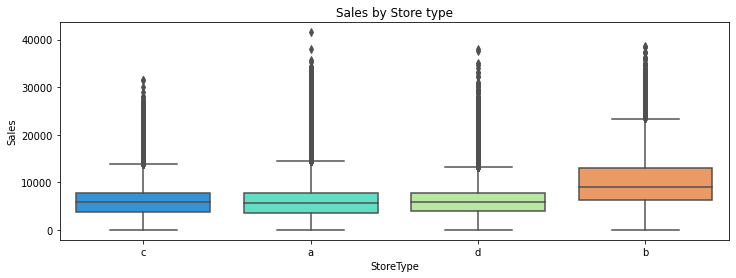

In [15]:
plt.figure(figsize=(12, 4))
sns.boxplot(x='StoreType', y='Sales', data=store_with_sales, palette='rainbow')
plt.title("Sales by Store type")

- From above plot we can observe that sales are high for store type='b'

#### Plot data between store-type and sales and use promo as hue parameter

Text(0.5, 1.0, 'Sales by Store type and Promotion')

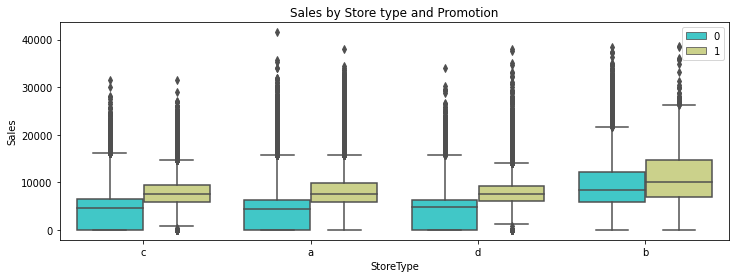

In [16]:
plt.figure(figsize=(12, 4))
sns.boxplot(x='StoreType', y='Sales', hue='Promo', data=store_with_sales, palette='rainbow')
plt.legend(loc='best')
plt.title("Sales by Store type and Promotion")

- Promo - indicates whether a store is running a promo on that day. 
- Irrespective of store type sales are high for store which is participating in promotions.

### Plot data between store-type and sales and use promo2Active as hue parameter

Text(0.5, 1.0, 'Sales by Store type and When Promo2 Active')

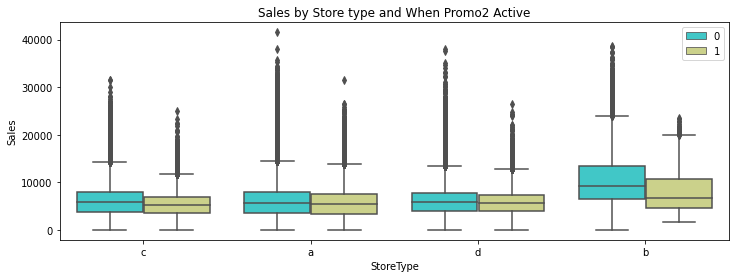

In [17]:
plt.figure(figsize=(12, 4))
sns.boxplot(x='StoreType', y='Sales', hue='Promo2Active', data=store_with_sales, palette='rainbow')
plt.legend(loc='best')
plt.title("Sales by Store type and When Promo2 Active")

- From above plot we can observe that promo2 is not so significant on sales data

#### Plot between store type and customer trend on promo day and non-promo day

<Figure size 1152x288 with 0 Axes>

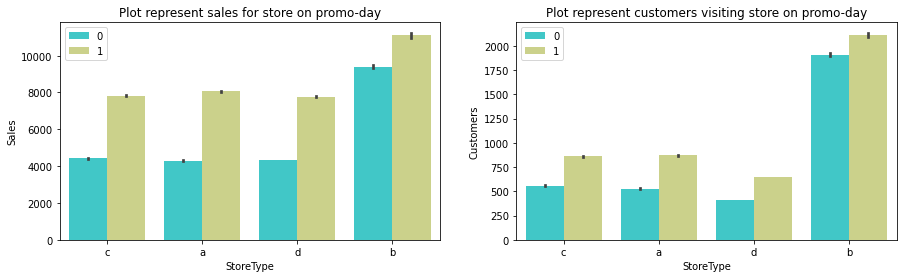

In [18]:
plt.figure(figsize=(16, 4))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 4))
sns.barplot(x='StoreType', y='Sales', hue='Promo', data=store_with_sales, palette='rainbow', ax=ax1)
ax1.set_title("Plot represent sales for store on promo-day")
ax1.legend(loc='best')
sns.barplot(x='StoreType', y='Customers', hue='Promo', data=store_with_sales, palette='rainbow', ax=ax2)
ax2.set_title("Plot represent customers visiting store on promo-day")
ax2.legend(loc='best')

- Number of customer customer visiting store on promoday reflects increase in sales as well.

#### Plot customer visit to store on Promo2Active and corresponding sales

<Figure size 1152x288 with 0 Axes>

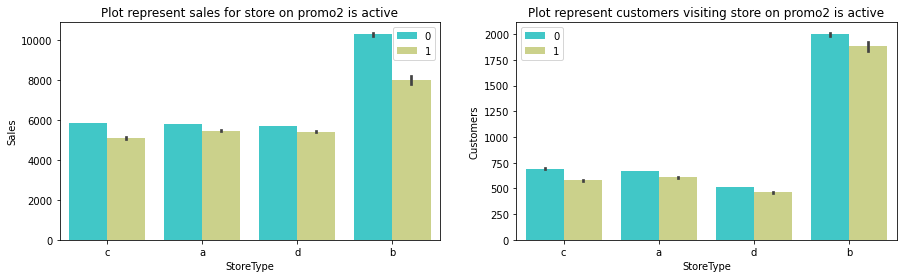

In [19]:
plt.figure(figsize=(16, 4))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 4))
sns.barplot(x='StoreType', y='Sales', hue='Promo2Active', data=store_with_sales, palette='rainbow', ax=ax1)
ax1.set_title("Plot represent sales for store on promo2 is active")
ax1.legend(loc='best')
sns.barplot(x='StoreType', y='Customers', hue='Promo2Active', data=store_with_sales, palette='rainbow', ax=ax2)
ax2.set_title("Plot represent customers visiting store on promo2 is active")
ax2.legend(loc='best')

#### Sales on day of week and customer visting store on day of week

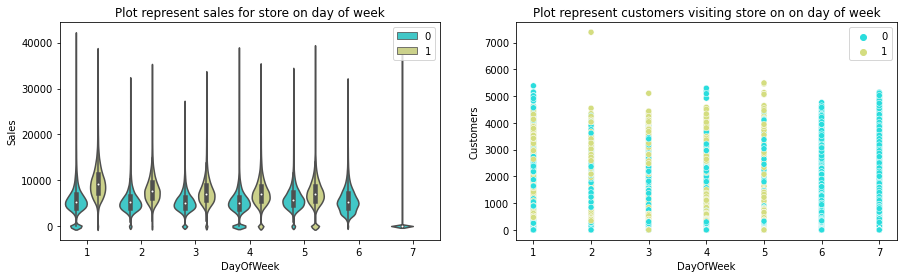

In [20]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 4))
sns.violinplot(x='DayOfWeek', y='Sales', hue='Promo', data=store_with_sales, palette='rainbow', ax=ax1)
ax1.set_title("Plot represent sales for store on day of week")
ax1.legend(loc='best')
sns.scatterplot(x='DayOfWeek', y='Customers', hue='Promo', data=store_with_sales, palette='rainbow', ax=ax2)
ax2.set_title("Plot represent customers visiting store on on day of week")
ax2.legend(loc='best')

#### Create buckets using Compitator distance if compitator present and sales vs nearest compitator.

In [21]:
distance_buckets = [0, 2000, 10000, 30000, 50000, 80000]
bins = pd.qcut(store_with_sales['CompetitionDistance'], q=5)
bins = bins.cat.add_categories('No Competition').fillna('No Competition')
grouped_sales = store_with_sales.groupby(bins)['Sales'].sum().reset_index()
grouped_sales

,CompetitionDistance,Sales
0,"(19.999, 510.0]",1287591800
1,"(510.0, 1600.0]",1161532905
2,"(1600.0, 3460.0]",1118446051
3,"(3460.0, 8740.0]",1143031113
4,"(8740.0, 75860.0]",1150594925
5,No Competition,11983829


Text(0.5, 1.0, 'Sales vs Near by Compitator')

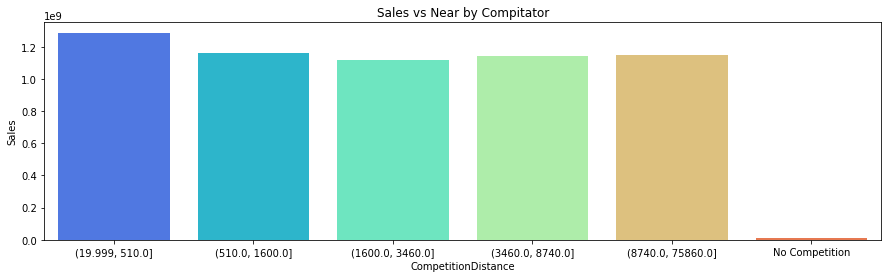

In [22]:
plt.figure(figsize=(15, 4))
sns.barplot(x='CompetitionDistance', y='Sales', data=grouped_sales, palette='rainbow')
plt.title("Sales vs Near by Compitator")

- From above plot we can observe that sales of stores is high for which has competation near by. Sales of the stores which has no near by compitator is very less.

#### Sales vs Near by Competitior with Promo

In [23]:
distance_buckets = [0, 2000, 10000, 30000, 50000, 80000]
bins = pd.qcut(store_with_sales['CompetitionDistance'], q=5)
bins = bins.cat.add_categories('No Competition').fillna('No Competition')
grouped_sales = store_with_sales.groupby([bins, 'Promo'])['Sales'].sum().reset_index()
grouped_sales

,CompetitionDistance,Promo,Sales
0,"(19.999, 510.0]",0,605062191
1,"(19.999, 510.0]",1,682529609
2,"(510.0, 1600.0]",0,560993056
3,"(510.0, 1600.0]",1,600539849
4,"(1600.0, 3460.0]",0,527622543
5,"(1600.0, 3460.0]",1,590823508
6,"(3460.0, 8740.0]",0,539707693
7,"(3460.0, 8740.0]",1,603323420
8,"(8740.0, 75860.0]",0,533206868
9,"(8740.0, 75860.0]",1,617388057


Text(0.5, 1.0, 'Sales vs Near by Compitator based On Promo')

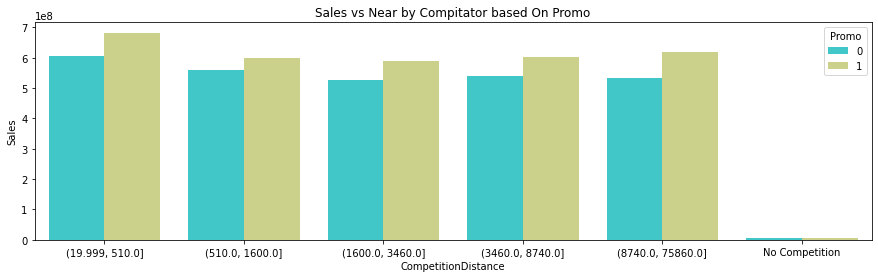

In [24]:
plt.figure(figsize=(15, 4))
sns.barplot(x='CompetitionDistance', y='Sales', hue='Promo', data=grouped_sales, palette='rainbow')
plt.title("Sales vs Near by Compitator based On Promo")

- <b>From most of above plots we notice that variable='Promo' playing significant roles increasing the Sales</b>

### Filter Store and Sales Data
`Filter the scope to nine key stores across Europe. These stores are key for the company keeping in mind the revenue and historical prestige associated with them. 
These stores are numbered - 1,3,8,9,13,25,29,31 and 46.`
- Once After filtering data for each store set frequency of data as daily for each store dataset

In [25]:
# Store forecast details
stores_to_filter = [1, 3, 8, 9, 13, 25, 29, 31, 46]

#Filter sales data for each store and set each store data frequency to daily
store_id_vs_sales_data = {}
for store in stores_to_filter:
    store_sales_data = store_with_sales[store_with_sales['Store'] == store]
    store_sales_data = store_sales_data.asfreq('D')
    store_id_vs_sales_data[store] = store_sales_data

### Plot Sales for stores: [1, 3, 8, 9, 13, 25, 29, 31, 46]

`Plot line-graphs for sales for above stores to check sales-trend`

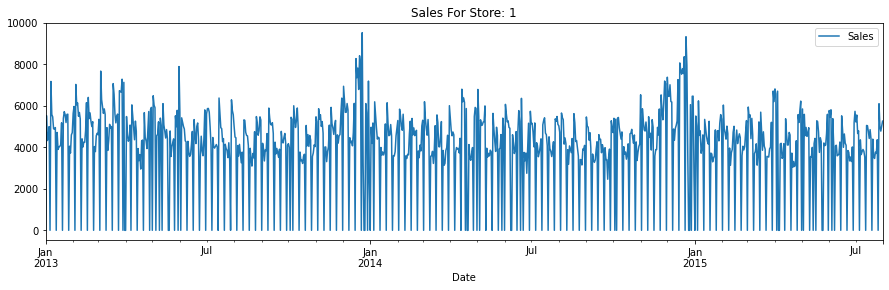

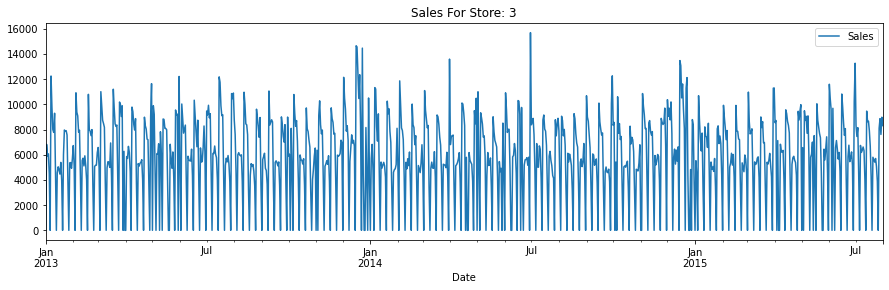

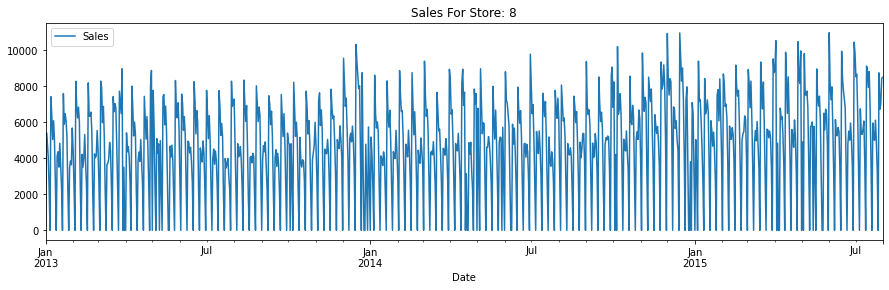

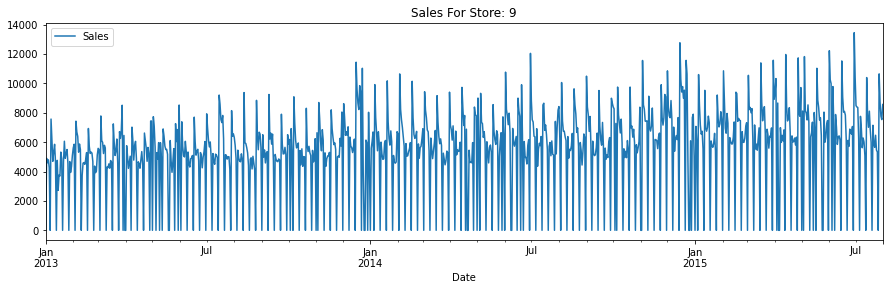

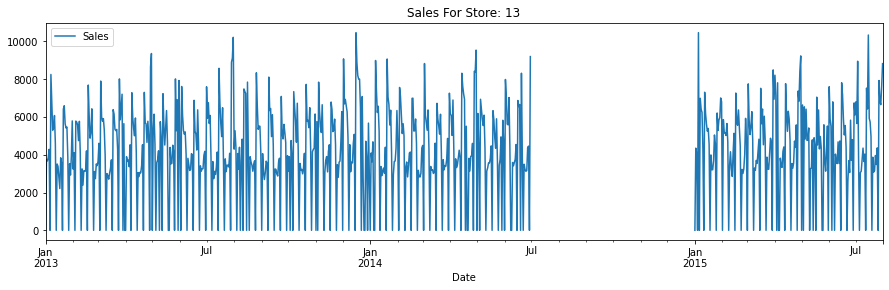

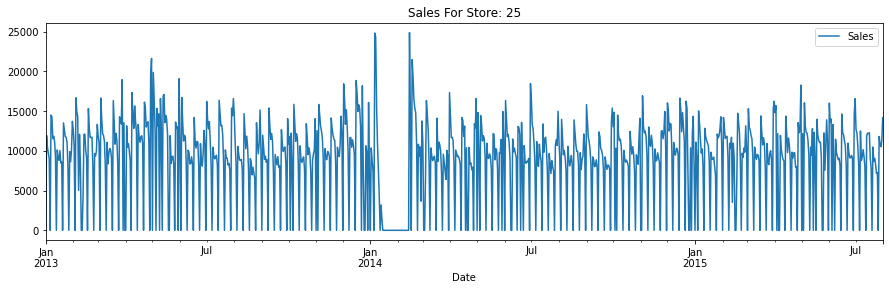

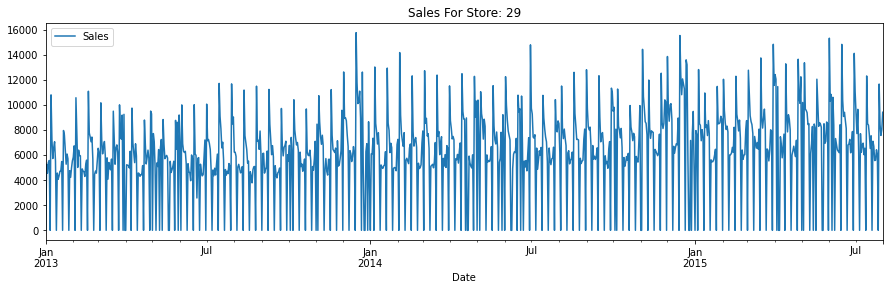

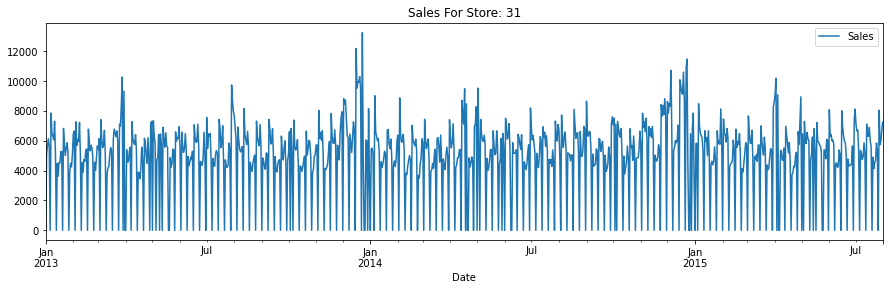

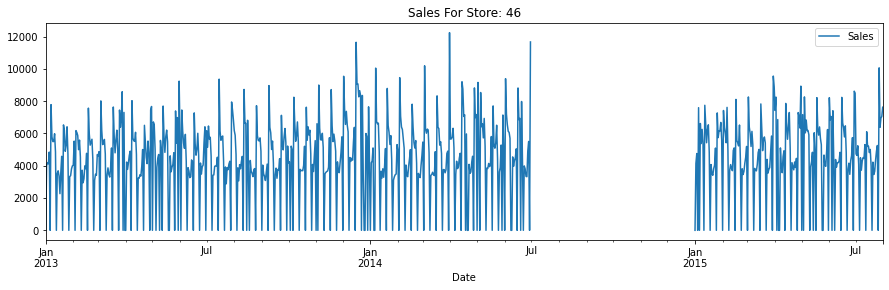

In [26]:
for store_id in store_id_vs_sales_data.keys():
    dataset = store_id_vs_sales_data.get(store_id)
    
    dataset['Sales'].plot(figsize=(15, 4))
    plt.legend(loc='best')
    plt.title('Sales For Store: %s' %store_id)
    plt.show()

### Check Missing values for dates and imputes them using 'SLINEAR' or 'ZERO' interpolation technique.
- interpolate(method='linear')
- fillna(method='zero')

In [27]:
# Check missing values in Sales data
for store_id in store_id_vs_sales_data.keys():
    dataset = store_id_vs_sales_data.get(store_id)
    print("Salets for Store: %s and its shape: %s" %(store_id, dataset.shape))
    print("Missing values count:\n %s" %dataset.isnull().sum(axis=0))
    print("\n")

Salets for Store: 1 and its shape: (942, 18)
Missing values count:
 Store                     0
StoreType                 0
Assortment                0
CompetitionDistance       0
Promo2                    0
Promo2SinceWeek         942
Promo2SinceYear         942
PromoInterval           942
DayOfWeek                 0
Sales                     0
Customers                 0
Open                      0
Promo                     0
StateHoliday              0
SchoolHoliday             0
CompetitionOpenSince      0
CompitationDuration       0
Promo2Active              0
dtype: int64


Salets for Store: 3 and its shape: (942, 18)
Missing values count:
 Store                   0
StoreType               0
Assortment              0
CompetitionDistance     0
Promo2                  0
Promo2SinceWeek         0
Promo2SinceYear         0
PromoInterval           0
DayOfWeek               0
Sales                   0
Customers               0
Open                    0
Promo                   0
StateHo

#### Based on above output we can notice that store 13 and store 46 has missing values count 184

### Impute Missing for Dataset related to store 13 and 46

In [30]:
store_13_data = store_id_vs_sales_data.get(13)
store_46_data = store_id_vs_sales_data.get(46)

In [31]:
store_46_data['PromoInterval'].value_counts()

Jan,Apr,Jul,Oct    758
Name: PromoInterval, dtype: int64

In [32]:
store_46_data['PromoInterval'].value_counts()

Jan,Apr,Jul,Oct    758
Name: PromoInterval, dtype: int64

In [33]:
#### For store 13 and 14 impute the PromoInterval with max occured value
store_13_data['PromoInterval'] = store_13_data['PromoInterval'].fillna(store_13_data['PromoInterval'].value_counts().index[0])
store_46_data['PromoInterval'] = store_46_data['PromoInterval'].fillna(store_46_data['PromoInterval'].value_counts().index[0])

In [34]:
## function to fill NaN for Promo2Active series
def fill_promo2Active(data_row):
    dateVal = data_row.name
    promoInterval = data_row['PromoInterval']
    if pd.isnull(promoInterval) == False:
        month_num = pd.to_datetime(dateVal).month
        promo_interval_array = promoInterval.lower().split(',')
        month_str = month_num_vs_str.get(month_num)
        if month_str in promo_interval_array:
            return 1
    return 0

In [35]:
# Impute Missing values 'Sales_imputed' and 'Customers_imputed' for store 13 using linear interpolation method.
# Promo imputed with 0
store_13_data = store_id_vs_sales_data.get(13)
store_13_data = store_13_data.assign(Sales_imputed=store_13_data.Sales.interpolate(method='slinear'))
store_13_data = store_13_data.assign(Customers_imputed=store_13_data.Customers.interpolate(method='slinear'))
store_13_data = store_13_data.assign(Sales_zero_imputed=store_13_data.Sales.interpolate(method='zero'))
store_13_data = store_13_data.assign(Customers_zero_imputed=store_13_data.Customers.interpolate(method='zero'))
store_13_data['Promo'] = store_13_data['Promo'].apply(lambda value: 0 if np.isnan(value) else value) # Impute promo with '0'
store_13_data['Promo2Active'] = store_13_data.apply(fill_promo2Active, axis=1)
store_13_data['Promo2Active'] = store_13_data['Promo2Active'].apply(lambda value: 0 if np.isnan(value) else value) # Impute promo with '0'

In [36]:
# Impute Missing values 'Sales_imputed' and 'Customers_imputed' for store 46 using linear interpolation method.
# Promo imputed with 0
store_46_data = store_id_vs_sales_data.get(46)
store_46_data = store_46_data.assign(Sales_imputed=store_46_data.Sales.interpolate(method='slinear'))
store_46_data = store_46_data.assign(Customers_imputed=store_46_data.Customers.interpolate(method='slinear'))
store_46_data = store_46_data.assign(Sales_zero_imputed=store_46_data.Sales.interpolate(method='zero'))
store_46_data = store_46_data.assign(Customers_zero_imputed=store_46_data.Customers.interpolate(method='zero'))
store_46_data['Promo'] = store_46_data['Promo'].apply(lambda value: 0 if np.isnan(value) else value) # Impute promo with '0'
store_46_data['Promo2Active'] = store_46_data.apply(fill_promo2Active, axis=1)
store_46_data['Promo2Active'] = store_46_data['Promo2Active'].apply(lambda value: 0 if np.isnan(value) else value) # Impute Promo2Active with '0'

In [37]:
# Update values in Map
store_13_data['Sales'] = store_13_data['Sales_imputed']
store_13_data['Customers'] = store_13_data['Customers_imputed']
store_46_data['Sales'] = store_46_data['Sales_imputed']
store_46_data['Customers'] = store_46_data['Customers_imputed']

#Drop imputed columns
store_13_data.drop(columns=['Sales_imputed','Customers_imputed'],inplace=True)
store_46_data.drop(columns=['Sales_imputed','Customers_imputed'],inplace=True)

store_id_vs_sales_data[13] = store_13_data
store_id_vs_sales_data[46] = store_46_data

### Outliers Ditection As part of This with interquartile range
- As part of this use IQR value to identify outliers

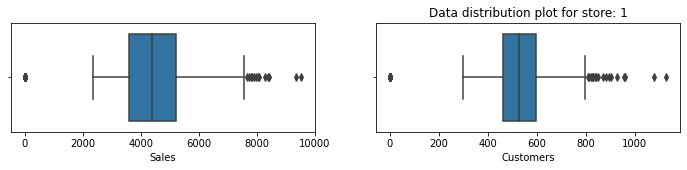

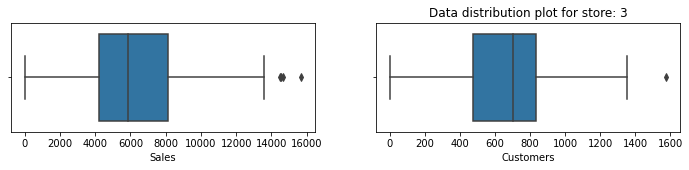

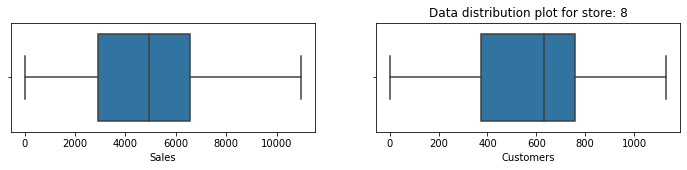

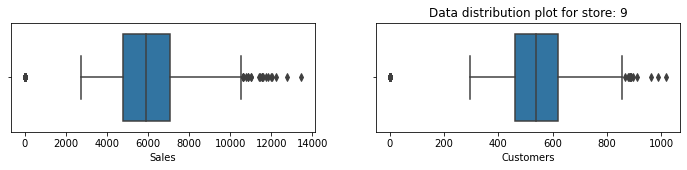

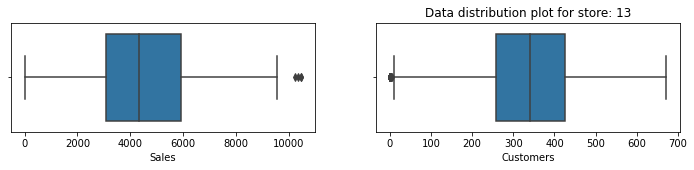

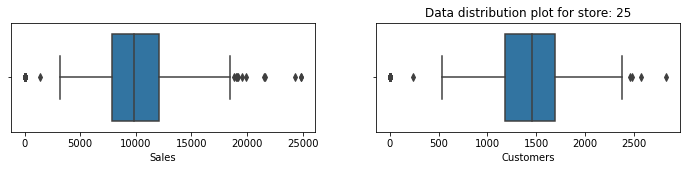

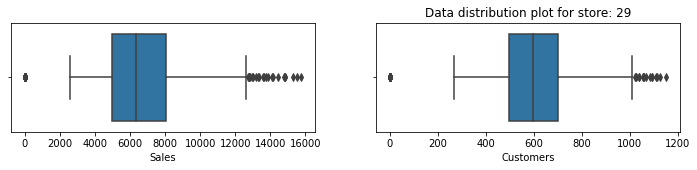

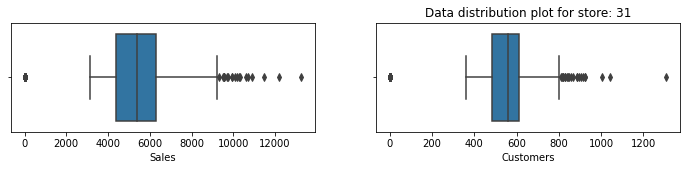

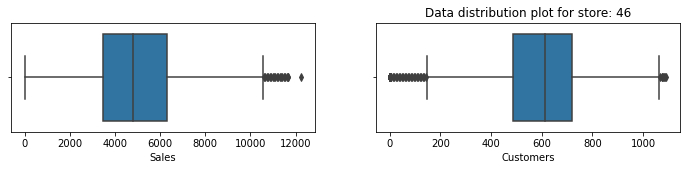

In [38]:
# Detect outliers in sales and customers data
for store_id in store_id_vs_sales_data.keys():
    dataset = store_id_vs_sales_data.get(store_id)
    fig, (ax1, ax2)= plt.subplots(1, 2, figsize=(12, 2))
    # If imputed column is there use it instead of original value
    plt.title("Data distribution plot for store: " + str(store_id))
    sns.boxplot(x=dataset['Sales'],  ax=ax1)
    sns.boxplot(x=dataset['Customers'], ax=ax2)

    plt.show()

### Outliers Treatment Techniques

#### 1. Using IQR with whis 2:
- We use  the following formula for setting outliers values  as part of dataset for store
`Q1 = df[cols].quantile(0.25)
 Q3 = df[cols].quantile(0.75)`
` IQR = Q3 - Q1`

 ` lower value -> Q1 - 2 * IQR
   Higher value -> Q3 + 2 * IQR` 

In [39]:
# It use inter qurtile technique to set the outliers values
# Quantile-based Flooring and Capping 
def treat_outliers(data_set, column_name, whis=2):
     # For sales data
    if column_name in data_set.columns:
        q1 = data_set[column_name].quantile(0.25)
        q3 = data_set[column_name].quantile(0.75)
        iqr = q3 - q1
        lower_val = q1 - whis * iqr
        higher_val = q3 + whis * iqr
        data_set[column_name] = np.where(data_set[column_name] < lower_val, lower_val, data_set[column_name])
        data_set[column_name] = np.where(data_set[column_name] > higher_val, higher_val, data_set[column_name])

#### 2. Outlier Treatment using 99th Percentile
- As part of this technique we set the value of outliers > 99th percentile value with 99th percentile value

In [40]:
# It 99th percentile value to set values values higer than >99th percentile value those values set with 99th percentile value
def treat_outliers_with_99th_percentile(data_set, column_name):
     # For sales data
    if column_name in data_set.columns:
        max_value = data_set[column_name].quantile(0.99)
        data_set[column_name] = np.where(data_set[column_name] > max_value, max_value, data_set[column_name])

#### Apply either one of outliers treatment on data sets

In [41]:
# Set outliers values using IQR method
for store_id in store_id_vs_sales_data.keys():
    dataset = store_id_vs_sales_data.get(store_id)
    # For sales data
    treat_outliers(dataset, 'Sales')
    treat_outliers(dataset, 'Customers')
    treat_outliers(dataset, 'Sales_zero_imputed')
    treat_outliers(dataset, 'Customers_zero_imputed')

### Decompose time-series data and check stationary

Sales Decomposition for store: 1


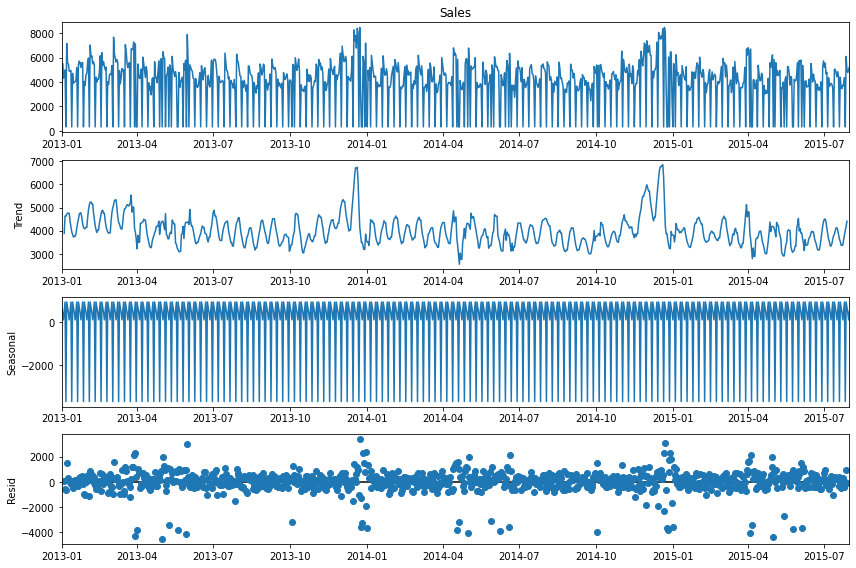

Sales Decomposition for store: 3


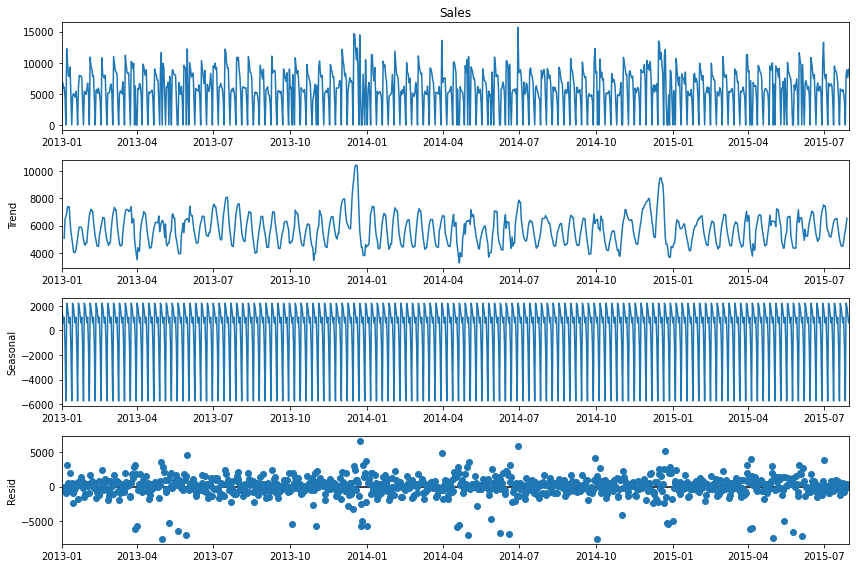

Sales Decomposition for store: 8


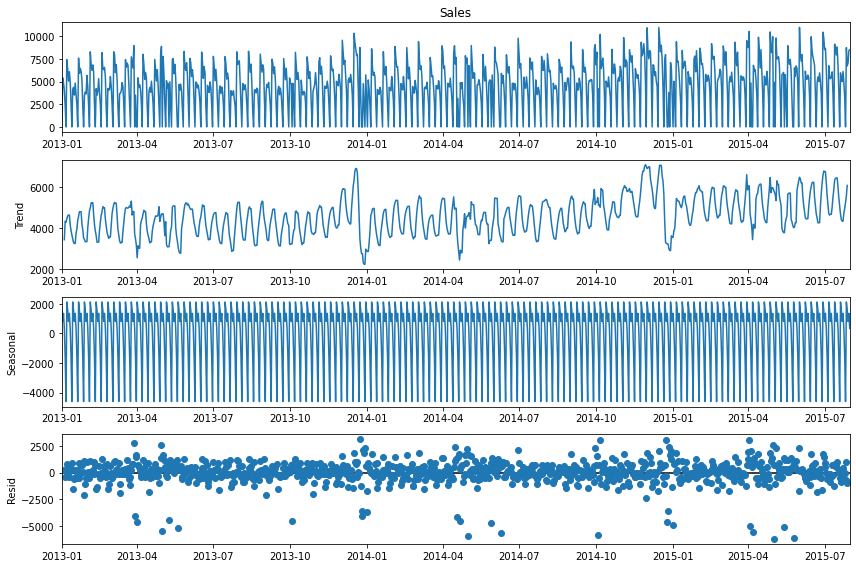

Sales Decomposition for store: 9


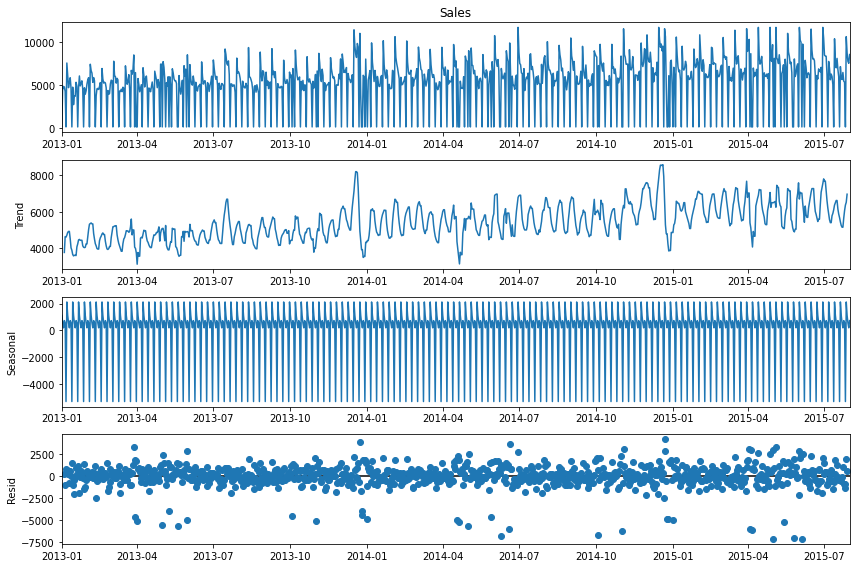

Sales Decomposition for store: 13


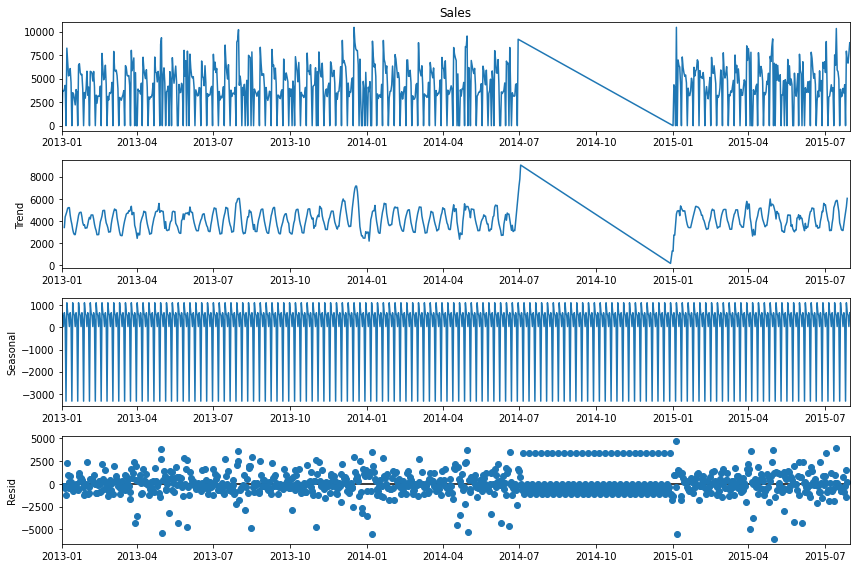

Sales Decomposition for store: 25


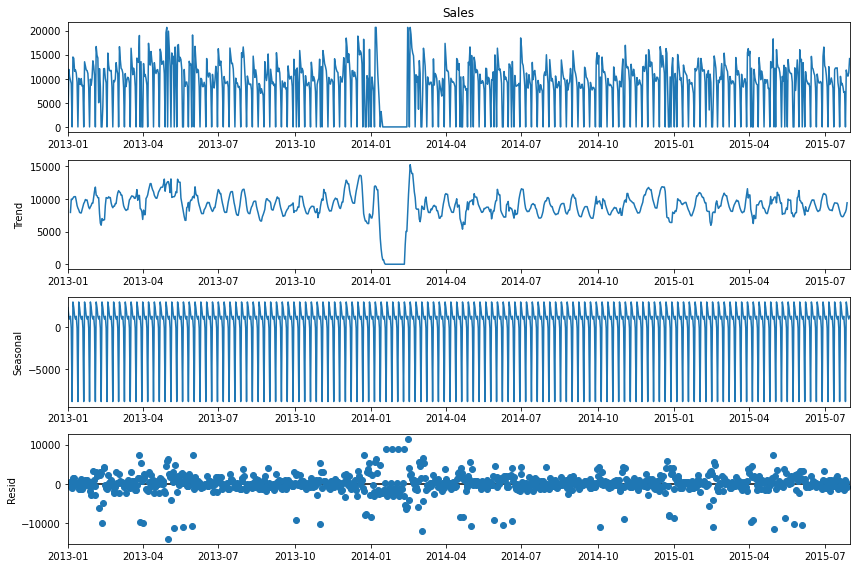

Sales Decomposition for store: 29


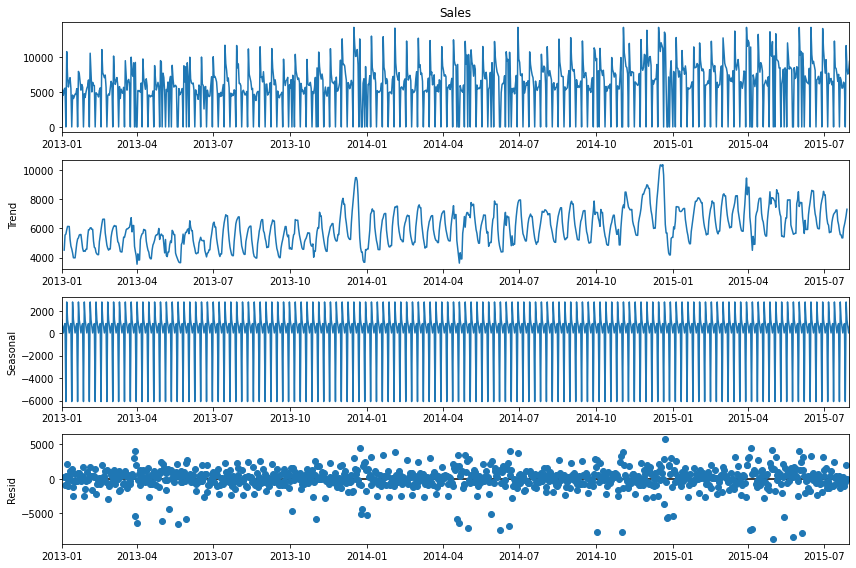

Sales Decomposition for store: 31


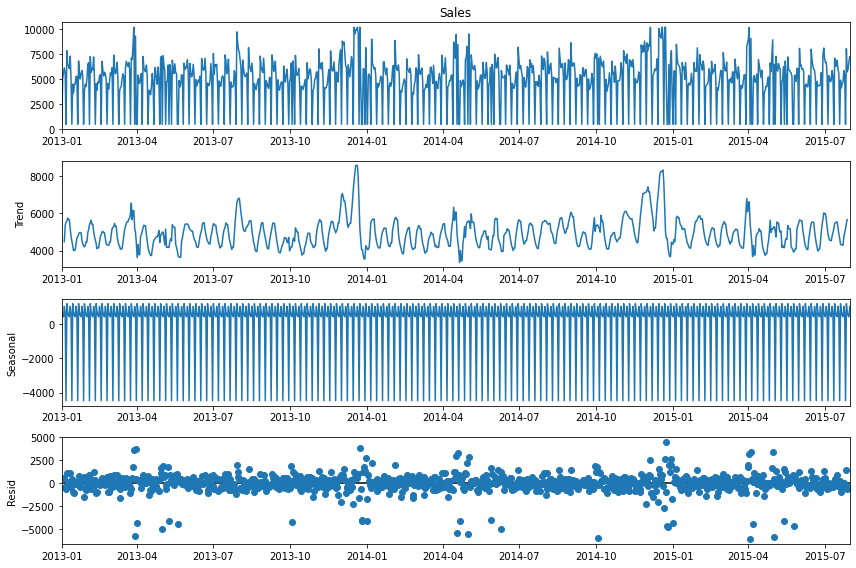

Sales Decomposition for store: 46


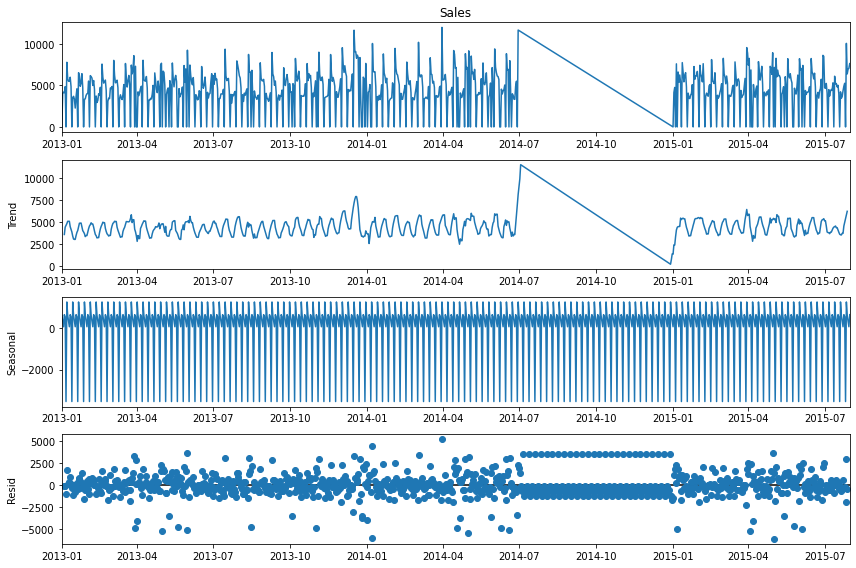

In [42]:
from pylab import rcParams
import statsmodels.api as sm

for store_id in store_id_vs_sales_data.keys():
    dataset = store_id_vs_sales_data.get(store_id)
    rcParams['figure.figsize'] = 12, 8
    print("Sales Decomposition for store: %s" %store_id)
    decomposition = sm.tsa.seasonal_decompose(dataset['Sales'], model='additive') # additive seasonal index
    fig = decomposition.plot()
    plt.show()

### Determine if the data is stationary for Sales and Customers

#### Run ADF test for sales and Customers data. It helps to identify whether series is stationary or not

#### Function to perform adfuller test on data series for stationary check

In [43]:
# Generic function to run adfuller test on data-series
from statsmodels.tsa.stattools import adfuller
def run_adfuller_check(dataset, dataset_map, store_id, column_name):
    # check column present in dataset
    data_series = None
    if column_name in dataset.columns:
        data_series = dataset[column_name]
    elif column_name in dataset_map.keys():
        data_series = dataset_map[column_name]
        
    if data_series is not None:    
        adf_test_res = adfuller(data_series)
        print("=========%s ADF for store: %s ============" %(column_name, store_id))
        print(adf_test_res)
        print("Adf Statistics: %f" %adf_test_res[0])
        print("Critical Value: @0.05: %0.2f" %adf_test_res[4]['5%'])
        print("P-Value: %f" %adf_test_res[1])
        print("========================================================")

In [44]:
for store_id in store_id_vs_sales_data.keys():
    dataset = store_id_vs_sales_data.get(store_id)
    print("======================Started performing ADF check for store : %d======================" %store_id)
    run_adfuller_check(dataset, {}, store_id, 'Sales')
    run_adfuller_check(dataset, {}, store_id, 'Customers')
    run_adfuller_check(dataset, {}, store_id, 'Sales_zero_imputed')
    run_adfuller_check(dataset, {}, store_id, 'Customers_zero_imputed')
    print("======================Completed performing ADF check for store : %d====================\n" %store_id)

======================Started performing ADF check for store : 1======================
=========Sales ADF for store: 1 ============
(-4.365794529554952, 0.0003410561869910743, 21, 920, {'1%': -3.4374778690219956, '5%': -2.864686684217556, '10%': -2.5684454926748583}, 15581.010120113295)
Adf Statistics: -4.365795
Critical Value: @0.05: -2.86
P-Value: 0.000341
=========Customers ADF for store: 1 ============
(-3.587127034403209, 0.00601195424189025, 21, 920, {'1%': -3.4374778690219956, '5%': -2.864686684217556, '10%': -2.5684454926748583}, 11049.200473600806)
Adf Statistics: -3.587127
Critical Value: @0.05: -2.86
P-Value: 0.006012
======================Completed performing ADF check for store : 1====================

======================Started performing ADF check for store : 3======================
=========Sales ADF for store: 3 ============
(-5.911548396935852, 2.6316169036390814e-07, 21, 920, {'1%': -3.4374778690219956, '5%': -2.864686684217556, '10%': -2.5684454926748583}, 16622.

=========Sales_zero_imputed ADF for store: 46 ============
(-1.93500521027618, 0.31577690716368, 22, 919, {'1%': -3.437485646962348, '5%': -2.8646901138095378, '10%': -2.568447319459459}, 16314.05476986912)
Adf Statistics: -1.935005
Critical Value: @0.05: -2.86
P-Value: 0.315777
=========Customers_zero_imputed ADF for store: 46 ============
(-1.8868943097827715, 0.3382513346933923, 22, 919, {'1%': -3.437485646962348, '5%': -2.8646901138095378, '10%': -2.568447319459459}, 12105.900483691858)
Adf Statistics: -1.886894
Critical Value: @0.05: -2.86
P-Value: 0.338251
======================Completed performing ADF check for store : 46====================



### To Standardize the data-set apply the box-cox transformation
- Applying the boxcox transformation will reduce the variance in dataset

In [96]:
# This computes transformed and differential series if series has any trend
def create_transform_diff_series(calculated_data_series, dataset, column_name):
    if column_name in dataset.columns:
        calculated_data_series[column_name +'_boxcox'] = pd.Series(boxcox1p(dataset[column_name], 0), index=dataset.index)
        calculated_data_series[column_name +'_boxcox_diff'] = pd.Series(calculated_data_series[column_name +'_boxcox'] - calculated_data_series[column_name +'_boxcox'].shift(), index = dataset.index)
        calculated_data_series[column_name +'_boxcox_diff'].dropna(inplace=True)

In [97]:
# Apply box-cox transformation to reduce variable in data we are applying boxcox1p because we have values of sales 0.
# Create computed series for each store-id
from scipy.special import boxcox1p 
store_id_vs_calculated_data_series = {}
for store_id in store_id_vs_sales_data.keys():
    dataset = store_id_vs_sales_data.get(store_id)
    calculated_data_series = {}
    create_transform_diff_series(calculated_data_series, dataset, 'Sales')
    create_transform_diff_series(calculated_data_series, dataset, 'Customers')
    create_transform_diff_series(calculated_data_series, dataset, 'Sales_zero_imputed')
    create_transform_diff_series(calculated_data_series, dataset, 'Customers_zero_imputed')
    # Add calculated series
    store_id_vs_calculated_data_series[store_id] = calculated_data_series

In [98]:
# Test whether all series are present or not
store_id_vs_calculated_data_series[13].keys()

dict_keys(['Sales_boxcox', 'Sales_boxcox_diff', 'Customers_boxcox', 'Customers_boxcox_diff', 'Sales_zero_imputed_boxcox', 'Sales_zero_imputed_boxcox_diff', 'Customers_zero_imputed_boxcox', 'Customers_zero_imputed_boxcox_diff'])

### Plot transformed and differential series for every store as part of filtered stores

In [99]:
# Function to plot the series for store
def plot_series(dataset, dataset_map, store_id, columns_name):
    series_data = None
    if columns_name in dataset.columns:
        series_data = dataset[columns_name]
    elif columns_name in dataset_map.keys():
        series_data = dataset_map[columns_name]
        
    # check series data is none
    if series_data is not None:
        series_data.plot(figsize=(15, 4))
        plt.legend(loc='best')
        plt.title('Series: %s For Store: %s' %(columns_name, store_id))
        plt.show()

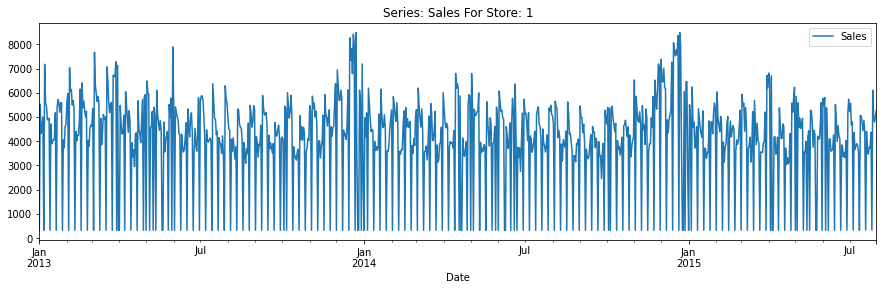

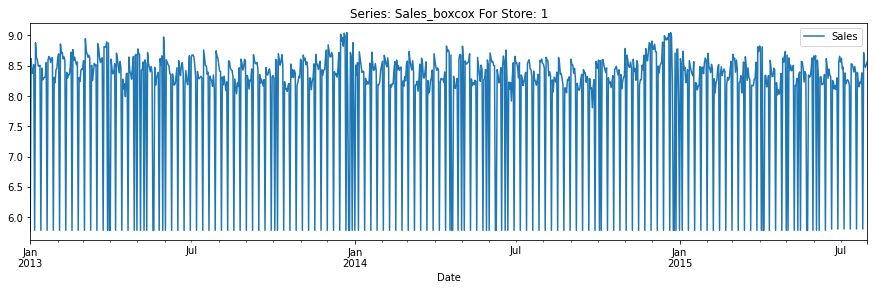

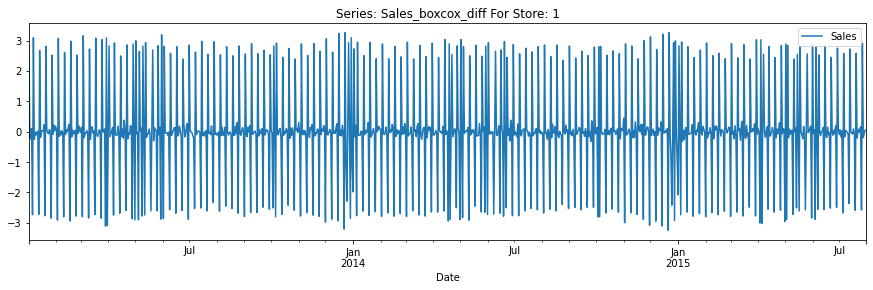

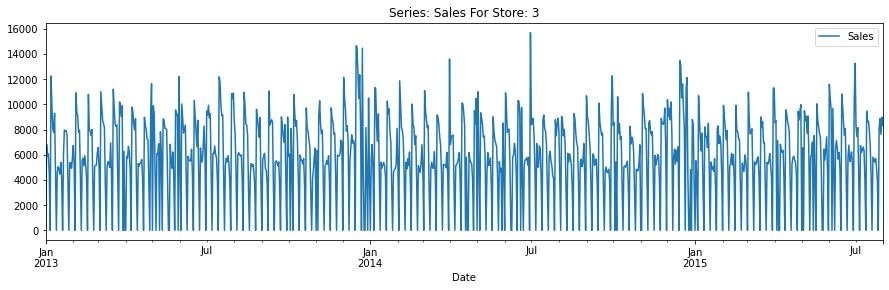

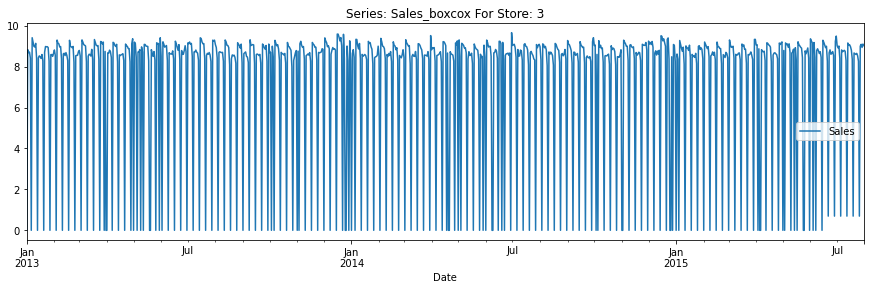

...

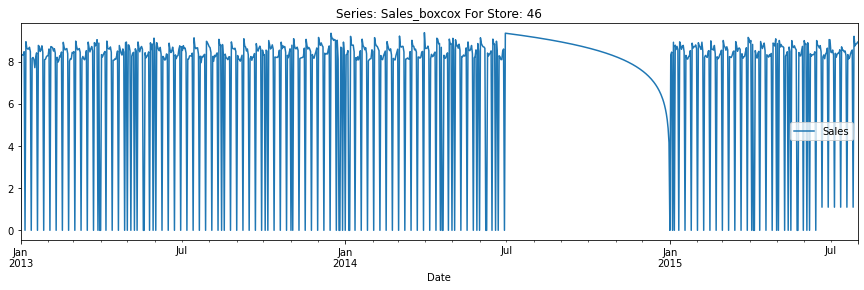

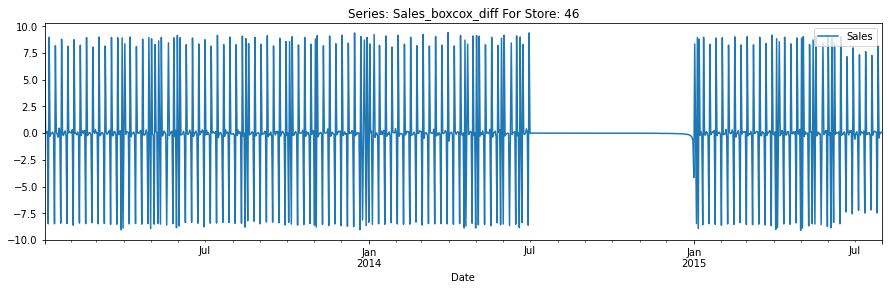

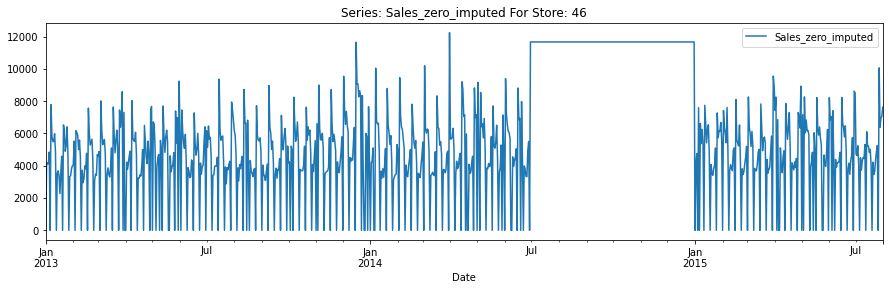

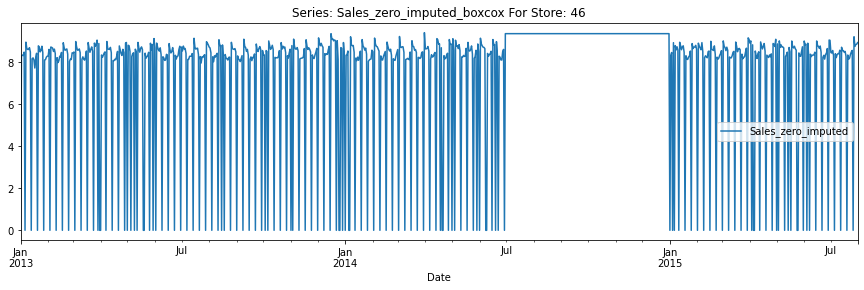

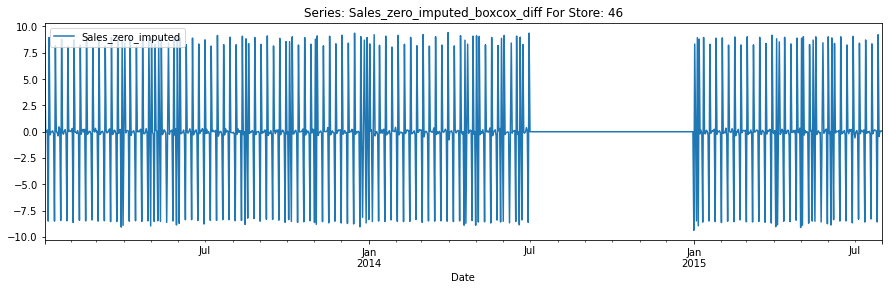

In [100]:
# Compare original data series with transformed and differential series for each store
for store_id in store_id_vs_calculated_data_series.keys():
    dataset = store_id_vs_sales_data.get(store_id)
    dataset_map = store_id_vs_calculated_data_series.get(store_id)
    plot_series(dataset, dataset_map, store_id, 'Sales')
    plot_series(dataset, dataset_map, store_id, 'Sales_boxcox')
    plot_series(dataset, dataset_map, store_id, 'Sales_boxcox_diff')
    plot_series(dataset, dataset_map, store_id, 'Sales_zero_imputed')
    plot_series(dataset, dataset_map, store_id, 'Sales_zero_imputed_boxcox')
    plot_series(dataset, dataset_map, store_id, 'Sales_zero_imputed_boxcox_diff')

### Run ADFuller test on all series for each store pick stationary series for each store

In [101]:
for store_id in store_id_vs_calculated_data_series.keys():
    dataset = store_id_vs_sales_data.get(store_id)
    dataset_map = store_id_vs_calculated_data_series.get(store_id)
    print("======================Started performing ADF check for store : %d======================" %store_id)
    run_adfuller_check(dataset, dataset_map, store_id, 'Sales_boxcox')
    run_adfuller_check(dataset, dataset_map, store_id, 'Customers_boxcox')
    run_adfuller_check(dataset, dataset_map, store_id, 'Sales_boxcox_diff')
    run_adfuller_check(dataset, dataset_map, store_id, 'Customers_boxcox_diff')
    run_adfuller_check(dataset, dataset_map, store_id, 'Sales_zero_imputed_boxcox')
    run_adfuller_check(dataset, dataset_map, store_id, 'Customers_zero_imputed_boxcox')
    run_adfuller_check(dataset, dataset_map, store_id, 'Sales_zero_imputed_boxcox_diff')
    run_adfuller_check(dataset, dataset_map, store_id, 'Customers_zero_imputed_boxcox_diff')
    print("======================Completed performing ADF check for store : %d====================\n" %store_id)

======================Started performing ADF check for store : 1======================
=========Sales_boxcox ADF for store: 1 ============
(-5.153205951814323, 1.0946900950179045e-05, 21, 920, {'1%': -3.4374778690219956, '5%': -2.864686684217556, '10%': -2.5684454926748583}, 1421.8906661644087)
Adf Statistics: -5.153206
Critical Value: @0.05: -2.86
P-Value: 0.000011
=========Customers_boxcox ADF for store: 1 ============
(-3.905162501258269, 0.0019971807338004842, 21, 920, {'1%': -3.4374778690219956, '5%': -2.864686684217556, '10%': -2.5684454926748583}, -58.067832607077435)
Adf Statistics: -3.905163
Critical Value: @0.05: -2.86
P-Value: 0.001997
=========Sales_boxcox_diff ADF for store: 1 ============
(-9.911551862819177, 3.1592407099118104e-17, 22, 918, {'1%': -3.4374934418959495, '5%': -2.8646935508856495, '10%': -2.568449150231867}, 1445.7348863050029)
Adf Statistics: -9.911552
Critical Value: @0.05: -2.86
P-Value: 0.000000
=========Customers_boxcox_diff ADF for store: 1 ==========

=========Customers_boxcox_diff ADF for store: 25 ============
(-8.292776200821526, 4.2177969174832346e-13, 22, 918, {'1%': -3.4374934418959495, '5%': -2.8646935508856495, '10%': -2.568449150231867}, 1519.155986201059)
Adf Statistics: -8.292776
Critical Value: @0.05: -2.86
P-Value: 0.000000
======================Completed performing ADF check for store : 25====================

======================Started performing ADF check for store : 29======================
=========Sales_boxcox ADF for store: 29 ============
(-5.86796175655536, 3.29128750551843e-07, 21, 920, {'1%': -3.4374778690219956, '5%': -2.864686684217556, '10%': -2.5684454926748583}, 3608.0299438001794)
Adf Statistics: -5.867962
Critical Value: @0.05: -2.86
P-Value: 0.000000
=========Customers_boxcox ADF for store: 29 ============
(-4.517254145441114, 0.0001829955185261373, 20, 921, {'1%': -3.437470108019385, '5%': -2.8646832620852853, '10%': -2.5684436698650503}, 993.6021816525104)
Adf Statistics: -4.517254
Critical Value

- <b>From above output  all 9 store's Sales_boxocx and Customers_boxcox data series are stationary because it's P-value < 0.05 significance level.
- For all stores We pick boxcox transformation with lambda value 0 for all series. For store 13 and 46 we use zero imputed series also for checking prediction with zero imputed series.


### Run Auto Correlation and Partial Auto Correlation checks on data to identify AR and MA variables

#### 1. Run ACF & PACF on Transformed data to check AR & MA varible values for each store-Id

ACF & PACF plot for store: 1


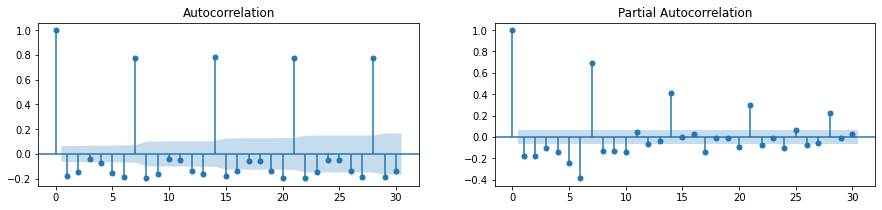

ACF & PACF plot for store: 3


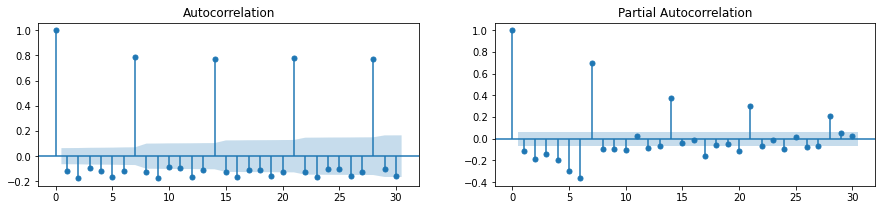

ACF & PACF plot for store: 8


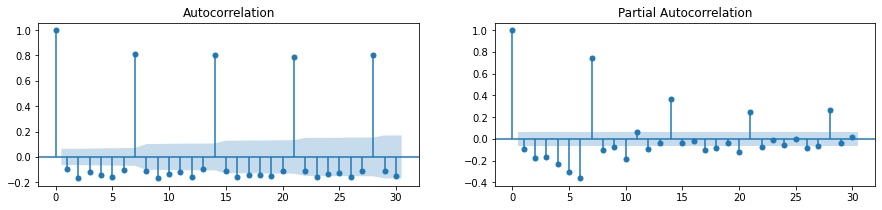

ACF & PACF plot for store: 9


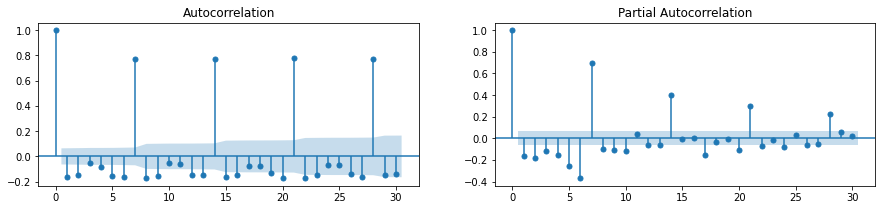

ACF & PACF plot for store: 13


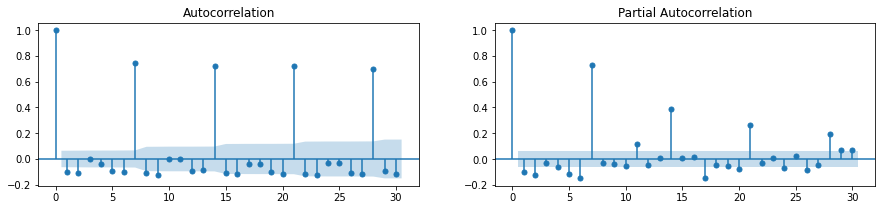

ACF & PACF plot for store: 25


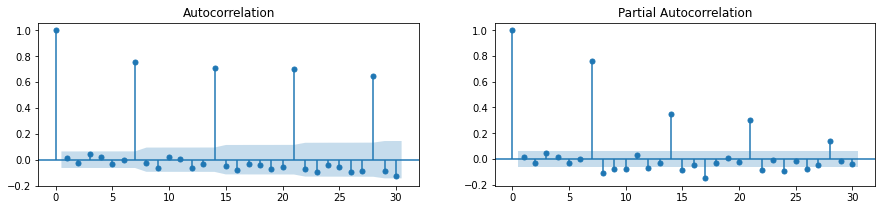

ACF & PACF plot for store: 29


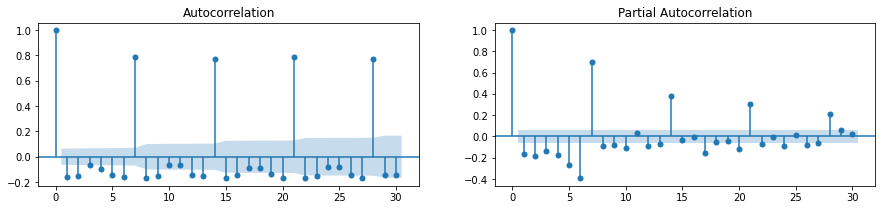

ACF & PACF plot for store: 31


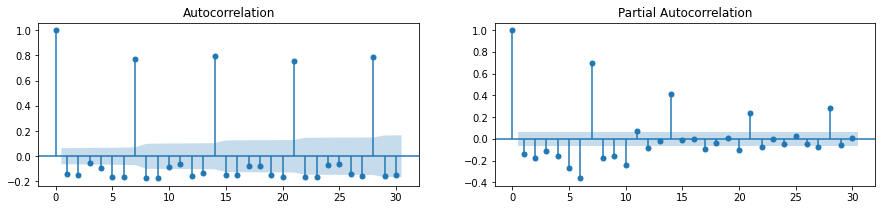

ACF & PACF plot for store: 46


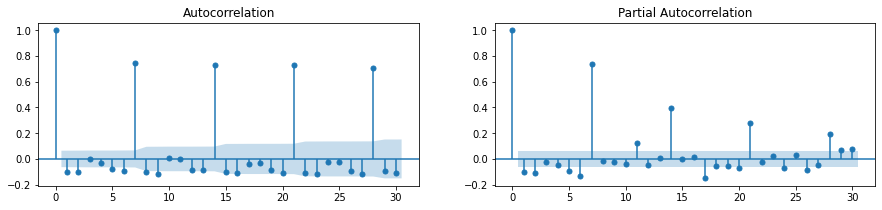

In [51]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

# Detect outliers in sales and customers data
for store_id in store_id_vs_calculated_data_series.keys():
    dataset = store_id_vs_calculated_data_series.get(store_id)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 3))
    print("ACF & PACF plot for store: " +str(store_id))
    acf1 = plot_acf(dataset['Sales_boxcox'], ax=ax1, lags=30)
    acf1 = plot_pacf(dataset['Sales_boxcox'], ax=ax2, lags=30)
    plt.show()

#### Plot PACF and ACF using line graph

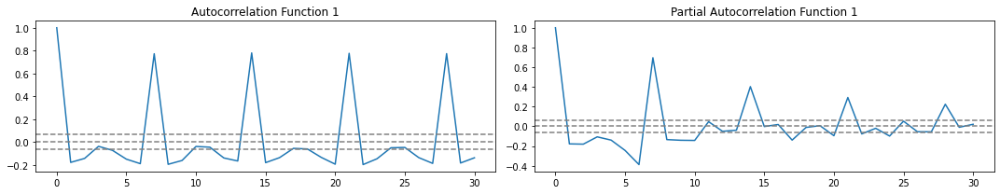

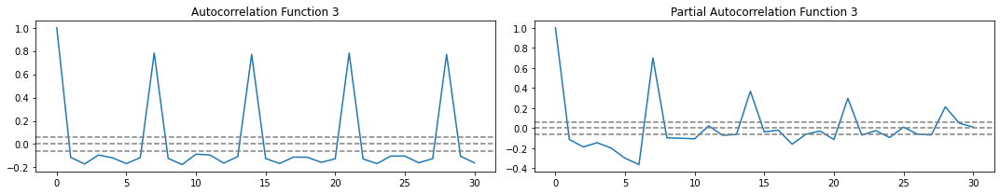

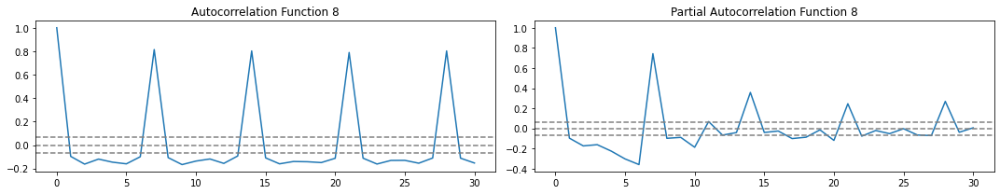

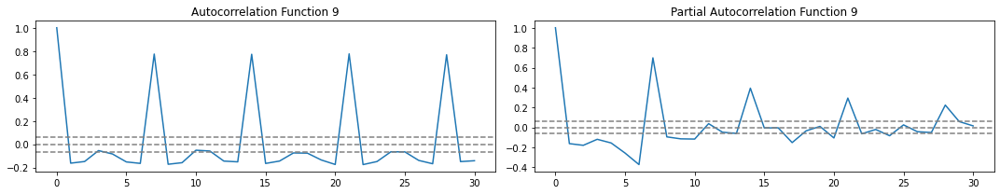

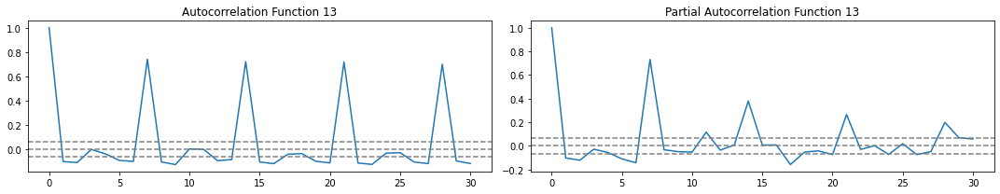

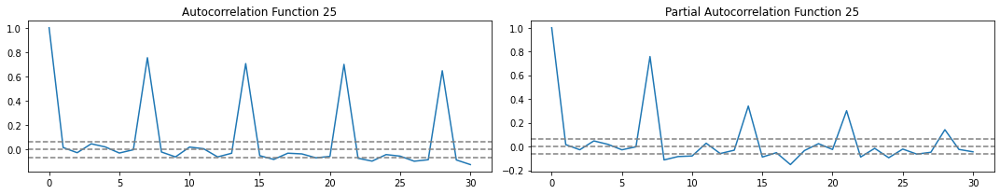

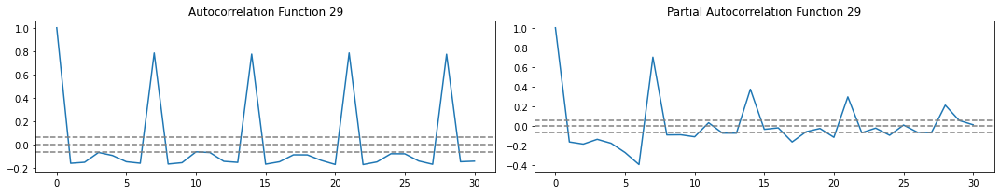

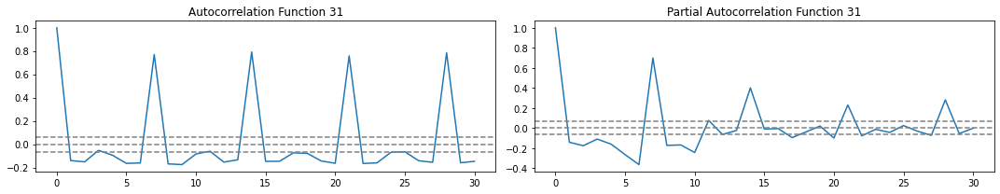

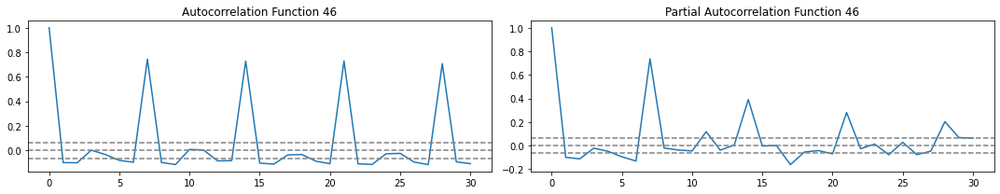

In [378]:
from statsmodels.tsa.stattools import acf, pacf
for store_id in store_id_vs_calculated_data_series.keys():
    dataset = store_id_vs_calculated_data_series.get(store_id)
    lag_acf = acf(dataset["Sales_boxcox"], nlags=30)
    lag_pacf = pacf(dataset["Sales_boxcox"], nlags=30, method='ols')
    
    plt.subplots(1, 2, figsize=(15, 3))
    #Plot ACF: 
    plt.subplot(121) 
    plt.plot(lag_acf)
    plt.axhline(y=0,linestyle='--',color='gray')
    plt.axhline(y=-1.96/np.sqrt(len(dataset["Sales_boxcox"])),linestyle='--',color='gray')
    plt.axhline(y=1.96/np.sqrt(len(dataset["Sales_boxcox"])),linestyle='--',color='gray')
    plt.title('Autocorrelation Function ' + str(store_id))

    #Plot PACF
    plt.subplot(122)
    plt.plot(lag_pacf)
    plt.axhline(y=0, linestyle='--', color='gray')
    plt.axhline(y=-1.96/np.sqrt(len(dataset["Sales_boxcox"])), linestyle='--', color='gray')
    plt.axhline(y=1.96/np.sqrt(len(dataset["Sales_boxcox"])), linestyle='--', color='gray')
    plt.title('Partial Autocorrelation Function ' + str(store_id))

    plt.tight_layout() 

##### Note: From Above plots we can observe that there is seasonality exist in correlation, picked MA=6 and AR = 6 for ARIMA model

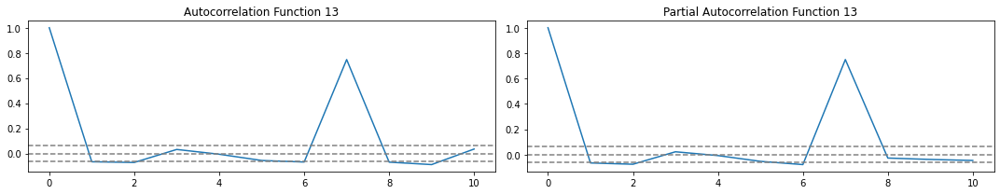

In [152]:
# For Store 13 and 46 run ACF and PACF check AR lag and MA lag
dataset_13 = store_id_vs_calculated_data_series.get(13)
lag_acf = acf(dataset_13["Sales_zero_imputed_boxcox"], nlags=10)
lag_pacf = pacf(dataset_13["Sales_zero_imputed_boxcox"], nlags=10, method='ols')

plt.subplots(1, 2, figsize=(15, 3))
#Plot ACF: 
plt.subplot(121) 
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(dataset_13["Sales_zero_imputed_boxcox"])),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(dataset_13["Sales_zero_imputed_boxcox"])),linestyle='--',color='gray')
plt.title('Autocorrelation Function ' + str(13))

#Plot PACF
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0, linestyle='--', color='gray')
plt.axhline(y=-1.96/np.sqrt(len(dataset_13["Sales_zero_imputed_boxcox"])), linestyle='--', color='gray')
plt.axhline(y=1.96/np.sqrt(len(dataset_13["Sales_zero_imputed_boxcox"])), linestyle='--', color='gray')
plt.title('Partial Autocorrelation Function ' + str(13))

plt.tight_layout() 

### Cointegration check between Sales and Customer's  data 
###### Note: which may not requires current scenario because all these data series are stationary

In [363]:
from statsmodels.tsa.vector_ar.vecm import coint_johansen #Johansen Cointegration test

dataset_for_store_1 = dataset = store_id_vs_calculated_data_series.get(1)

temp_dataframe = pd.concat([dataset_for_store_1['Sales_boxcox'],dataset_for_store_1['Customers_boxcox']], axis=1)

john_test_store1 = coint_johansen(temp_dataframe, -1 , 1)
print(john_test_store1.lr1) # Trace Stats
print(john_test_store1.lr2) #Max Eign Value Stats

[5.85730791e+02 9.98286232e-02]
[5.85630962e+02 9.98286232e-02]


In [364]:
def joh_output(res):
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')

In [365]:
joh_output(john_test_store1)

   max_eig_stat  trace_stat
0    585.630962  585.730791
1      0.099829    0.099829 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[ 9.4748 11.2246 15.0923]
 [ 2.9762  4.1296  6.9406]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[10.4741 12.3212 16.364 ]
 [ 2.9762  4.1296  6.9406]] 



##### From above method we can observe that rank is 1, so cointegration exist between sales and customers data.

In [366]:
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
rank=select_coint_rank(temp_dataframe,-1,1)
print(rank.rank)

1


## Start Model  Building For Stores

### ---Start utility Functions ---

### Operation to calculate MAPE for actual and predicted series

In [55]:
from sklearn.metrics import mean_squared_error
#calculate mape error
def calculate_mape(predicted_series, actual_series):
    actual_series += 1
    predicted_series +=1
    mape = np.round(np.mean(np.abs(actual_series - predicted_series)/actual_series) * 100, 2)
    return mape

#calculate RMSE error
def calculate_rmse(predicted_series, actual_series):
    rmse = np.sqrt(mean_squared_error(actual_series, predicted_series)).round(2)
    return rmse

###  Create ARMA model function and plot the data
- As part of this model uses test_size as 42 to forecast data for 6 weeks.

### ARIMA Model Function which takes series and forecast return error

In [389]:
from statsmodels.tsa.arima_model import ARIMA
from scipy.special import inv_boxcox1p

# This ARMA Function performs folloing activities.
# 1. Split data in train and test
# 2. Train the model on training data
# 3. Perform perdiction based test index duration
# 4. Transform data back to original target data
# 5. Plot Train, Test & prediction data to visullay represent how is predication quality from model.
# 6. Compte the MAPE and RMSE error between prediction data and test data.
def create_arma_model_and_plot_forecast(store_id, sales_original_series, sales_transformed_series, ar_lag, ma_lag, title="", test_size=42, lmbda=0):
    # create train size based on test_size
    train_size = sales_original_series.shape[0] - test_size
    train_original = sales_original_series[:train_size]
    test_original = sales_original_series[train_size:]
    # Split the train data
    train_data = sales_transformed_series[:train_size]
        
    model = ARIMA(train_data, order=(ar_lag, 0, ma_lag))
    model_fit = model.fit()
    
    y_hat_arma = sales_transformed_series.copy()
    y_hat_arma['arma_forecast_boxcox'] = model_fit.predict(sales_transformed_series.index.min(), sales_transformed_series.index.max())
    #y_hat_arma['arma_forecast_boxcox'] = y_hat_arma['arma_forecast_boxcox_diff'].cumsum()
    #y_hat_arma['arma_forecast_boxcox'] = y_hat_arma['arma_forecast_boxcox'].add(sales_transformed_series[0])
    y_hat_arma['arma_forecast'] = inv_boxcox1p(y_hat_arma['arma_forecast_boxcox'], lmbda)
    
    ## Plot Train, Test and Forecast
    plt.figure(figsize=(14, 4))
    plt.plot(train_original, label = 'Train')
    plt.plot(test_original, label='Test')
    plt.plot(y_hat_arma['arma_forecast'][test_original.index.min():], label='ARMA Forecast')
    plt.legend(loc='best')
    plt.title(title)
    plt.show()
    
    # Compute the MAPE and return the value
    mape = calculate_mape(y_hat_arma['arma_forecast'][test_original.index.min():], test_original)
    rmse = calculate_rmse(y_hat_arma['arma_forecast'][test_original.index.min():], test_original)
    return (mape, rmse)

#### Based above forecasting data for store 13 and store 46, data series imputed with zero is giving better forecasting error compare data imputed using 'slinear' function.

### Create SARIMAX Model Function

In [390]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# This SARIMAX take series and seasonal and non-seasonal tuples as an input and performs folloing activities.
# 1. Split data in train and test
# 2. Train the model on training data
# 3. Perform perdiction based test index duration
# 4. Transform data back to original target data
# 5. Plot Train, Test & prediction data to visullay represent how is predication quality from model.
# 6. Compte the MAPE and RMSE error between prediction data and test data.
def create_sarimax_model_and_plot_forecast(store_id, sales_series, transformed_series, exogenous_series, order_tuple, seasonal_tuple, test_size=42, lmbda=0):
    train_size = sales_series.shape[0] - test_size
    train_original = sales_series[:train_size]
    test_original = sales_series[train_size:]
    
    train_sales_boxcox = transformed_series[:train_size]
    # Initialize forecast series
    y_hat_sarimax = test_original.copy()
    
    if exogenous_series is not None:
        exog_train = exogenous_series[:train_size]
        exog_test = exogenous_series[train_size:]
        model = SARIMAX(train_sales_boxcox, order=order_tuple,
                        seasonal_order=seasonal_tuple,
                        exog=exog_train)
        model_fit = model.fit(maxiter=50)
        y_hat_sarimax['sarimax_forecast_boxcox'] = model_fit.predict(test_original.index.min(), test_original.index.max(), exog=exog_test)
    else:
        model = SARIMAX(train_sales_boxcox, order=order_tuple,
                            seasonal_order=seasonal_tuple)
        model_fit = model.fit(maxiter=50)
        y_hat_sarimax['sarimax_forecast_boxcox'] = model_fit.predict(test_original.index.min(), test_original.index.max())
    
    y_hat_sarimax['sarimax_forecast'] = inv_boxcox1p(y_hat_sarimax['sarimax_forecast_boxcox'], lmbda)
    
    ## Plot Train, Test and Forecast
    plt.figure(figsize=(14, 4))
    plt.plot(train_original, label = 'Train')
    plt.plot(test_original, label='Test')
    plt.plot(y_hat_sarimax['sarimax_forecast'][test_original.index.min():], label='SARIMAX Forecast')
    plt.legend(loc='best')
    plt.title("SARIMAX Forecasting for store_id: "+str(store_id))
    plt.show()
    
    # Compute the MAPE and return the value
    mape = calculate_mape(y_hat_sarimax['sarimax_forecast'][test_original.index.min():], test_original)
    rmse = calculate_rmse(y_hat_sarimax['sarimax_forecast'][test_original.index.min():], test_original)
    return (mape, rmse)

### Create VARMAX Model function

In [418]:
from statsmodels.tsa.statespace.varmax import VARMAX
from scipy.special import inv_boxcox1p

# This VARMAX take series and p, q values as an input and performs folloing activities.
# 1. Split data in train and test
# 2. Train the model on training data
# 3. Perform perdiction based test index duration
# 4. Transform data back to original target data
# 5. Plot Train, Test & prediction data to visullay represent how is predication quality from model.
# 6. Compte the MAPE and RMSE error between prediction data and test data.
def run_var_model(store_id, sales_series, endog1_series, endog2_series, exogenous_series, ar_lag, ma_lag, debug_mode=False, test_size=42, lmbda=0):
    train_size = sales_series.shape[0] - test_size
    
    train_original = sales_series[:train_size]
    test_original = sales_series[train_size:]
    train_exos = None
    test_exos = None
    
    train_endog1_boxcox = endog1_series[:train_size]
    train_endog2_boxcox = endog2_series[:train_size]
    
    train_data = pd.concat([train_endog1_boxcox, train_endog2_boxcox], axis=1)
    model_fit = None
    if exogenous_series is not None:
        train_exos = exogenous_series[:train_size]
        test_exos = exogenous_series[train_size:]
        model = VARMAX(train_data, order=(ar_lag, ma_lag), trend='n', initialization='approximate_diffuse', exog=train_exos)
        model_fit = model.fit(maxiter=1000, disp=False)
    else:
        model = VARMAX(train_data, order=(ar_lag, ma_lag), trend='n')
        model_fit = model.fit(maxiter=1000, disp=False)
    
    if debug_mode:
        print(model_fit.summary())
    
    # Predict and forecast and calculate errors
    y_hat_var = test_original.copy()
    if exogenous_series is not None:
        y_hat_var['varmax_forecast_boxcox'] = model_fit.predict(test_original.index.min(), test_original.index.max(), exog=test_exos)
    else:
        y_hat_var['varmax_forecast_boxcox'] = model_fit.predict(test_original.index.min(), test_original.index.max())
        
    y_hat_var['varmax_forecast'] = inv_boxcox1p(y_hat_var['varmax_forecast_boxcox'], lmbda)
    
    predicted_target_series = None
    if 'Sales' in y_hat_var['varmax_forecast'].columns:
        predicted_target_series = y_hat_var['varmax_forecast']['Sales']
    elif 'Sales_zero_imputed' in y_hat_var['varmax_forecast'].columns:
        predicted_target_series = y_hat_var['varmax_forecast']['Sales_zero_imputed']
        
    ## Plot Train, Test and Forecast
    plt.figure(figsize=(14, 4))
    plt.plot(train_original, label = 'Train')
    plt.plot(test_original, label='Test')
    plt.plot(predicted_target_series, label= 'VARMAX Forecast')
    plt.legend(loc='best')
    plt.title("Forecasting for store_id: "+str(store_id))
    plt.show()
    
    # Compute the MAPE and return the value
    mape = calculate_mape(predicted_target_series, test_original)
    rmse = calculate_rmse(predicted_target_series, test_original)
    return (model_fit, mape, rmse)

### Create Holts Winter's Model function

In [392]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# This HOLT's Winters model take series as an input and performs folloing activities.
# 1. Split data in train and test
# 2. Train the model on training data
# 3. Perform perdiction based test index duration
# 4. Transform data back to original target data
# 5. Plot Train, Test & prediction data to visullay represent how is predication quality from model.
# 6. Compte the MAPE and RMSE error between prediction data and test data.
def run_holts_winter_model(store_id, original_series, seasonal_period=7, trend=None, seasonal='add', test_size=42):
    train_size = original_series.shape[0] - test_size
    originl_train = original_series[:train_size]
    original_test = original_series[train_size:]
    
    y_hat_hwa = original_test.copy()
    model = ExponentialSmoothing(np.asarray(originl_train) ,seasonal_periods=seasonal_period ,trend=trend, seasonal=seasonal)
    model_fit = model.fit(optimized=True)
    print(model_fit.params)
    y_hat_hwa['hw_forecast'] = model_fit.forecast(42)
    y_hat_hwa_predicted = pd.Series(y_hat_hwa['hw_forecast'], index=original_test.index)
    # plot forecasting and original data
    plt.figure(figsize=(12,4))
    plt.plot(originl_train, label='Train')
    plt.plot(original_test, label='Test')
    plt.plot(y_hat_hwa_predicted, label='Holt Winters\'s forecast, method: ' + seasonal)
    plt.legend(loc='best')
    plt.title('Holt Winters\'s additive forecast: ' + str(store_id))
    plt.show()
    
    # calculate errors and return error
    mape = np.round(np.mean(np.abs(y_hat_hwa_predicted - original_test)/original_test) * 100, 2)
    rmse = calculate_rmse(y_hat_hwa_predicted, original_test)
    return (mape, rmse)

### Run Auto ARIMA to get Optiomal values for p, d, q and seasonal order components

In [73]:
# function to run auto_arima for data series without or with exogenous variable
from pmdarima import auto_arima

def run_auto_arima(data_series, exogenous_var, season_period=7):
    if exogenous_var is None:
        print(auto_arima(data_series, m=season_period, Trace=True, seasonal=True).summary())
    else:
        print(auto_arima(data_series, X=exogenous_var, m=season_period, Trace=True, seasonal=True).summary())

### ---End utility functions ---

### 1. Run ARMA model for 'Sales' Transformed data of all stores and capture errors
- Prediction period is 6 weeks, So we took test data size as 6 week for prediction.
- AR Lag - 6
- MA Lag - 6

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


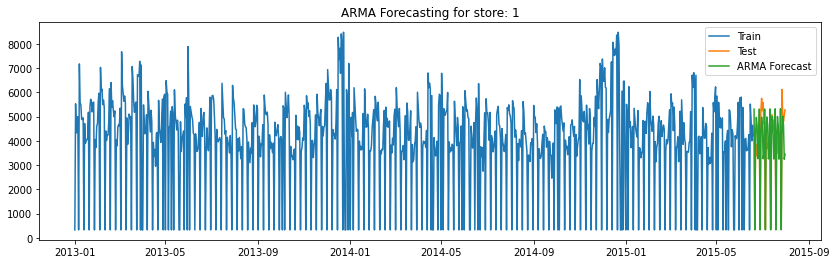

Results for store 1: 
                     Method   MAPE    RMSE
0  ARMA_On_Transformed_data  18.14  990.47


c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


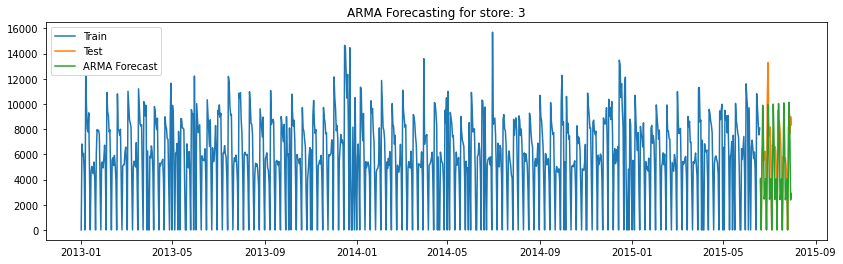

Results for store 3: 
                     Method   MAPE     RMSE
0  ARMA_On_Transformed_data  44.75  2969.52


c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


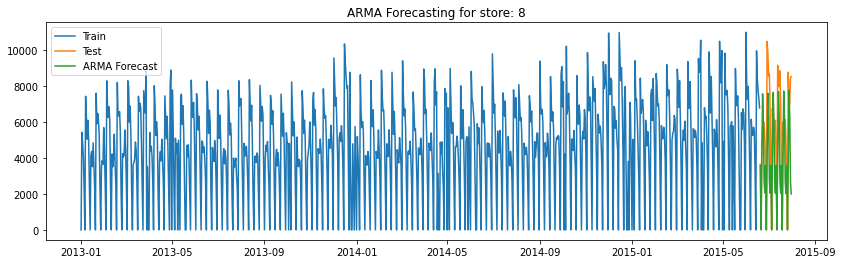

Results for store 8: 
                     Method   MAPE     RMSE
0  ARMA_On_Transformed_data  46.26  3096.05


c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


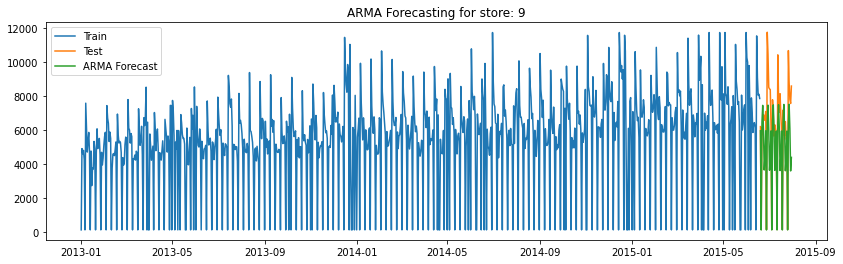

Results for store 9: 
                     Method   MAPE     RMSE
0  ARMA_On_Transformed_data  23.96  2323.64


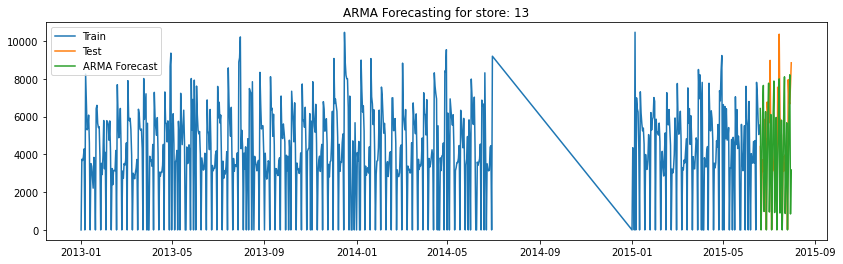

Results for store 13: 
                     Method   MAPE     RMSE
0  ARMA_On_Transformed_data  57.41  2996.97


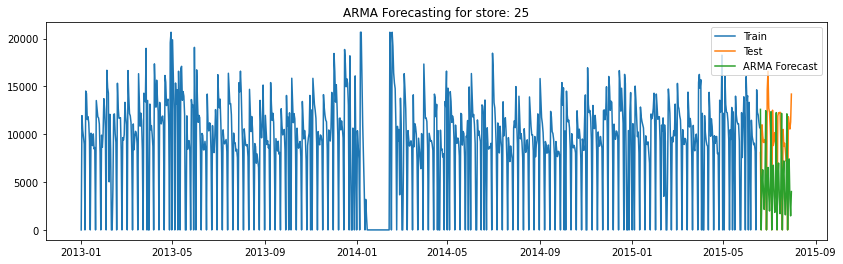

Results for store 25: 
                     Method   MAPE     RMSE
0  ARMA_On_Transformed_data  62.19  6120.96


c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


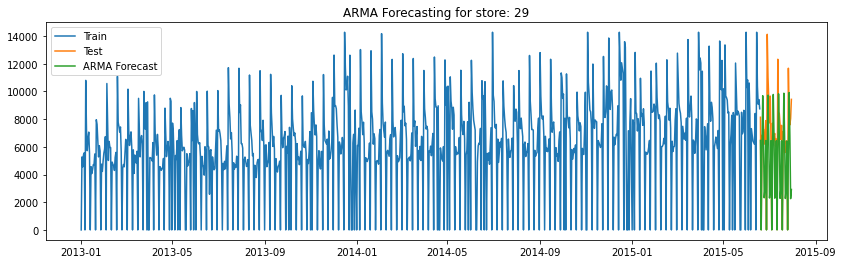

Results for store 29: 
                     Method   MAPE     RMSE
0  ARMA_On_Transformed_data  45.07  3423.62


c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


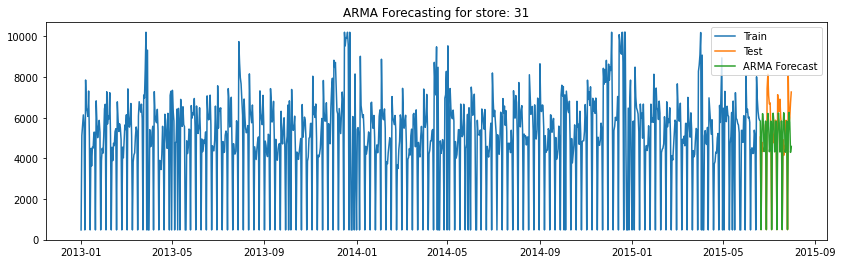

Results for store 31: 
                     Method   MAPE     RMSE
0  ARMA_On_Transformed_data  16.53  1327.46


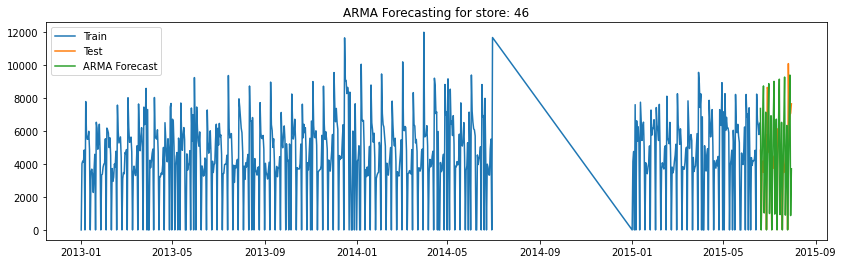

Results for store 46: 
                     Method   MAPE    RMSE
0  ARMA_On_Transformed_data  59.31  2965.3


In [395]:
stores_error_data = {}
# RUN ARMA on sales series using train_size for all stores 
for store_id in store_id_vs_calculated_data_series.keys():
    original_dataset = store_id_vs_sales_data.get(store_id)
    dataset_series_map = store_id_vs_calculated_data_series.get(store_id)
    # call function to create ARMA model for sales data
    mape_error, rmse_error = create_arma_model_and_plot_forecast(store_id,
                                                                 original_dataset['Sales'],
                                                                 dataset_series_map['Sales_boxcox'],
                                                                 6, 6, title="ARMA Forecasting for store: %d" %store_id)
    results = pd.DataFrame({'Method':['ARMA_On_Transformed_data'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
    print("Results for store %s: " %store_id)
    print(results)
    stores_error_data[store_id] = results

#### 2.  Store 13 and 46 use 0 imputed series to forecast usin ARIMA models 

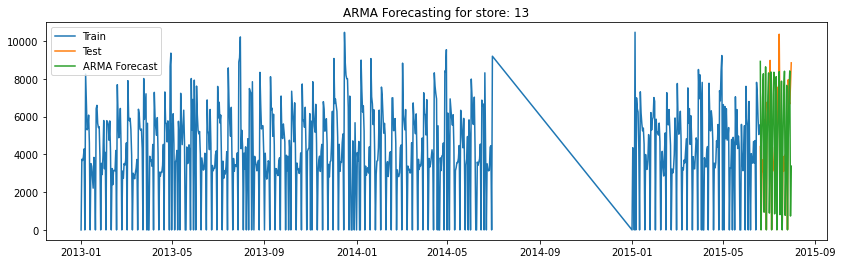

Results for store 13: 
                     Method   MAPE     RMSE
0  ARMA_On_Transformed_data  57.25  2996.36
0    ARMA_zero_imputed_data  68.22  3293.48


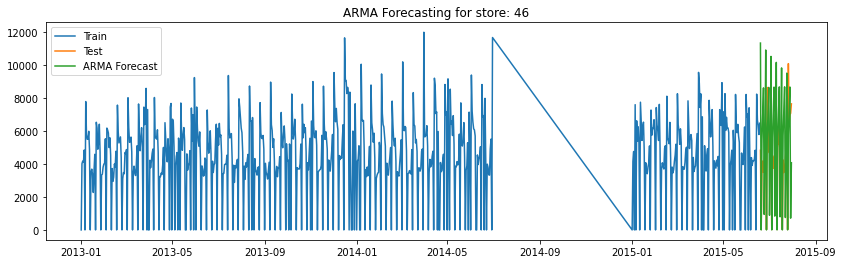

Results for store 46: 
                     Method   MAPE     RMSE
0  ARMA_On_Transformed_data  59.15  2965.24
0    ARMA_zero_imputed_data  68.06  3396.37


In [385]:
# For series related to store 13 and 46 use 0 imputed series to forecast data compare its
# predictions with 'slinear' imputed data
# RUN ARMA on sales series using train_size for all stores 
for store_id in (13, 46):
    original_dataset = store_id_vs_sales_data.get(store_id)
    dataset_series_map = store_id_vs_calculated_data_series.get(store_id)
    # call function to create ARMA model for sales data
    mape_error, rmse_error = create_arma_model_and_plot_forecast(store_id,
                                                                 original_dataset['Sales'],
                                                                 dataset_series_map['Sales_zero_imputed_boxcox'],
                                                                 6, 6, title="ARMA Forecasting for store: %d" %store_id)
    tempResult = pd.DataFrame({'Method':['ARMA_zero_imputed_data'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
    results = pd.concat([stores_error_data[store_id], tempResult])
    print("Results for store %s: " %store_id)
    print(results)
    stores_error_data[store_id] = results

### Time Series Anaylysis & Forecasting for Store-1

#### Store_Id = 1 - RUN SARIMAX with exogenous and with-out exegenous variable
- Using  AR=6 and MA=6 for non seasonal and AR=6 for Seasonal component in SARIMAX
- As an alternate option we use auto_arima to get values for p, q, d and P, Q, D for seasonal and non-component
- Once we get these values we run model and perform forecast

#### 1. SARIMAX model with manual computed p and q values

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


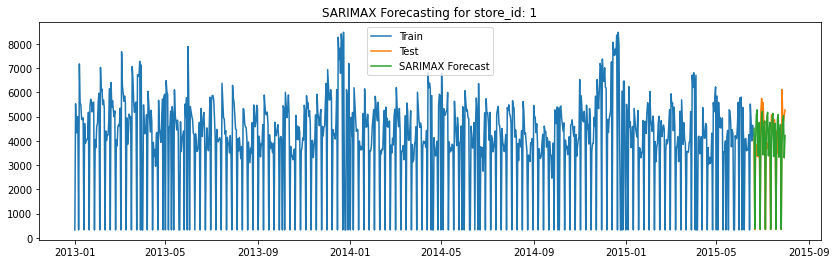

,Method,MAPE,RMSE
0,SARIMAX,16.96,952.16


In [386]:
store_id = 1
dataset_series_map = store_id_vs_calculated_data_series.get(store_id)
original_dataset = store_id_vs_sales_data.get(store_id)
# call function to create SARIMAX model for sales data
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset['Sales'], 
                                                             dataset_series_map['Sales_boxcox'], 
                                                             None, (6, 0, 6), (1, 0, 0, 7))
sarimax_store1_with_manual_acf_pacf = pd.DataFrame({'Method':['SARIMAX'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store1_with_manual_acf_pacf

#### Identify p,q, d and P, Q, D using auto_arima for running SARIMAX models

In [74]:
# Run Auto-ARIMA for store Id 1
store_id = 1
dataset_series_map = store_id_vs_calculated_data_series.get(store_id)
original_dataset = store_id_vs_sales_data.get(store_id)
run_auto_arima(dataset_series_map['Sales_boxcox'], None)

                                SARIMAX Results                                
Dep. Variable:                       y   No. Observations:                  942
Model:             SARIMAX(1, 0, 0, 7)   Log Likelihood                -915.948
Date:                 Wed, 11 Aug 2021   AIC                           1837.896
Time:                         00:26:50   BIC                           1852.440
Sample:                              0   HQIC                          1843.440
                                 - 942                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.7468      0.231      7.548      0.000       1.293       2.200
ar.S.L7        0.7814      0.032     24.217      0.000       0.718       0.845
sigma2         0.4065      0.018     23.222 

#### 2. Run Model for store-1 using above identified parameters without exogenous

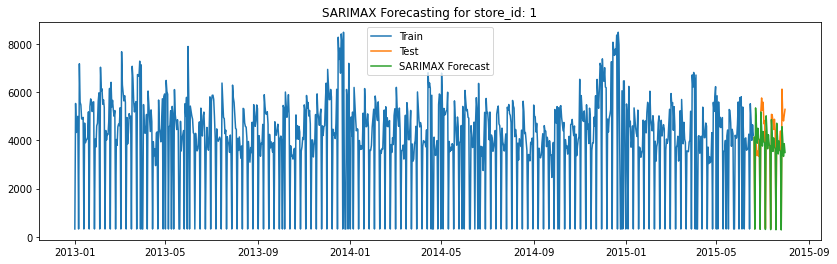

,Method,MAPE,RMSE
0,SARIMAX,15.39,817.74


In [400]:
store_id = 1
original_dataset = store_id_vs_sales_data.get(store_id)
dataset_series_map = store_id_vs_calculated_data_series.get(store_id)
# call function to create SARIMAX model for sales data
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset['Sales'], 
                                                             dataset_series_map['Sales_boxcox'], 
                                                             None, (0, 0, 0), (1, 0, 0, 7))
tempResults = pd.DataFrame({'Method':['SARIMAX'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
tempResults

##### Note: Compare to Manual computed p,q values from ACF and PACF the values computed using auto_arima function giving better prediction quality. So continue to use auto_arima for series to compute seasonal and non-seasonla component.

#### Store-id=1 Run auto_arima with following exogenous variables
- Promo
- Promo2Active

In [409]:
run_auto_arima(dataset_series_map['Sales_boxcox'], 
               original_dataset['Promo'].values.reshape(-1, 1))

                                       SARIMAX Results                                        
Dep. Variable:                                      y   No. Observations:                  942
Model:             SARIMAX(2, 0, 1)x(2, 0, [1, 2], 7)   Log Likelihood                -616.474
Date:                                Sat, 14 Aug 2021   AIC                           1252.948
Time:                                        22:23:14   BIC                           1301.428
Sample:                                             0   HQIC                          1271.427
                                                - 942                                         
Covariance Type:                                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0352      0.028      1.277      0.202      -0.019       0.089
x1 

#### 3. Run SARIMAX with exogenous Promo for store-1

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


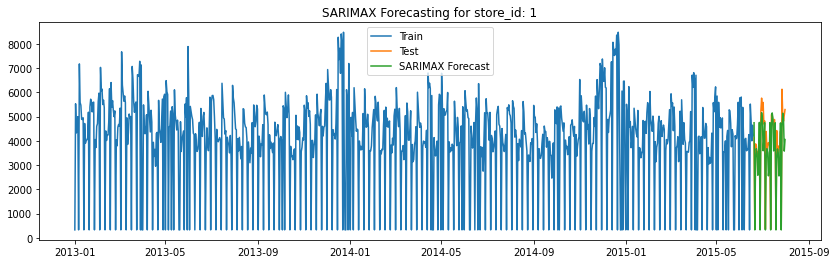

,Method,MAPE,RMSE
0,SARIMAX,13.93,770.29


In [412]:
# run model with 
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset['Sales'], 
                                                             dataset_series_map['Sales_boxcox'],
                                                             original_dataset['Promo'],(2, 0, 1), (1, 0, [1, 2], 7))
store_1_res2 = pd.DataFrame({'Method':['SARIMAX'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
store_1_res2

#### Use Promo2Active as exogenous variable for store-id and check the prediction quality

In [84]:
# run auto-arima with promo2Active
run_auto_arima(dataset_series_map['Sales_boxcox'], original_dataset['Promo2Active'].values.reshape(-1, 1))

                                SARIMAX Results                                
Dep. Variable:                       y   No. Observations:                  942
Model:             SARIMAX(1, 0, 0, 7)   Log Likelihood                -915.948
Date:                 Wed, 11 Aug 2021   AIC                           1839.896
Time:                         00:55:46   BIC                           1859.288
Sample:                              0   HQIC                          1847.288
                                 - 942                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.7468      0.232      7.535      0.000       1.292       2.201
const               0   5.68e+04          0      1.000   -1.11e+05    1.11e+05
ar.S.L7        0.7814      0.032     24.194 

#### 4. Run SARIMAX with exogenous Promo2Active for store-1

using exog


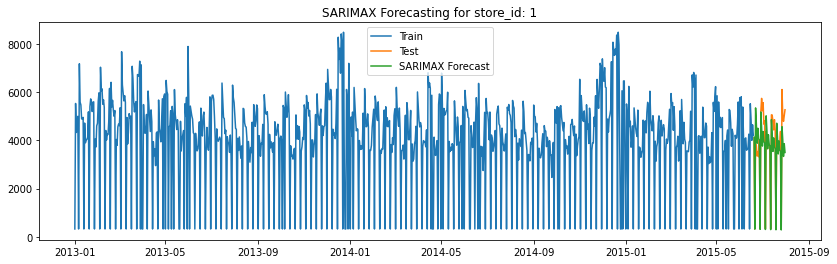

,Method,MAPE,RMSE
0,SARIMAX,14.77,812.39


In [86]:
# run model with Promo2Active as exognous variable using previous identified p, q values
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset['Sales'], 
                                                             dataset_series_map['Sales_boxcox'],
                                                             original_dataset['Promo2Active'], (0, 0, 0), (1, 0, 0, 7))
store_1_res3 = pd.DataFrame({'Method':['SARIMAX'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
store_1_res3

#### Use Promo and Promo2Active as exogenous variables for store-id 1 and check the prediction quality

In [414]:
store1_exog_variables = pd.concat([original_dataset['Promo'], original_dataset['Promo2Active']], axis=1)
run_auto_arima(dataset_series_map['Sales_boxcox'], store1_exog_variables.values.reshape(-1, 2))

                                       SARIMAX Results                                        
Dep. Variable:                                      y   No. Observations:                  942
Model:             SARIMAX(2, 0, 1)x(1, 0, [1, 2], 7)   Log Likelihood                -625.848
Date:                                Sat, 14 Aug 2021   AIC                           1271.696
Time:                                        22:29:41   BIC                           1320.176
Sample:                                             0   HQIC                          1290.175
                                                - 942                                         
Covariance Type:                                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0756      0.042      1.801      0.072      -0.007       0.158
x1 

#### 4. Run SARIMAX with exogenous variables: Promo2Active, Promo for store-1

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


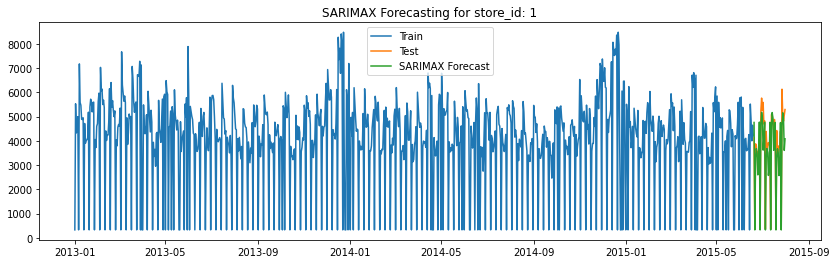

,Method,MAPE,RMSE
0,SARIMAX-With-Promo-And_promo2,13.79,757.51


In [416]:
# run model with Promo2Active as exognous variable using previous identified p, q values
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset['Sales'], 
                                                             dataset_series_map['Sales_boxcox'],
                                                             store1_exog_variables, (2, 0, 1), (1, 0, [1, 2], 7))
store_1_sarimax_with_promo_and_promo2 = pd.DataFrame({'Method':['SARIMAX-With-Promo-And_promo2'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
store_1_sarimax_with_promo_and_promo2

#### So far for store_id 1 SARIMAX with 'Promo' exogenous variable providing better error forecasting compare to other SARIMAX models.
MAPE = 12.04

### Multivariate time series analysis VAR model for store-id-1

- Since bother Sales_boxcox and Cutomers_boxcox series are stationary from ADF test not required to run cointegration check.
- For Identify p, q to run VAR  model with range 1-8 for both params get best fit combination.

In [130]:
from statsmodels.tsa.api import VAR
from statsmodels.tsa.statespace.varmax import VARMAX

store_id = 1
original_dataset = store_id_vs_sales_data.get(store_id)
dataset_series_map = store_id_vs_calculated_data_series.get(store_id)
# call function to create ARMA model for sales data
transformed_data = pd.concat([dataset_series_map['Sales_boxcox'], dataset_series_map['Customers_boxcox']], axis=1)
var_model = VAR(transformed_data)

var_fit = var_model.select_order(maxlags=15)
var_fit.summary()

,AIC,BIC,FPE,HQIC
0,-5.158,-5.147,0.005754,-5.154
1,-5.483,-5.452,0.004156,-5.471
2,-5.616,-5.564,0.003640,-5.596
3,-5.664,-5.591,0.003470,-5.636
4,-5.697,-5.603,0.003355,-5.662
5,-5.794,-5.680,0.003045,-5.750
6,-6.020,-5.884,0.002431,-5.968
7,-6.748,-6.592,0.001173,-6.688
8,-6.781,-6.604,0.001135,-6.714
9,-6.790,-6.592,0.001125,-6.715


#### 5. Run VAR for store-id 1 using the AR lag 15 and check the prediction quality

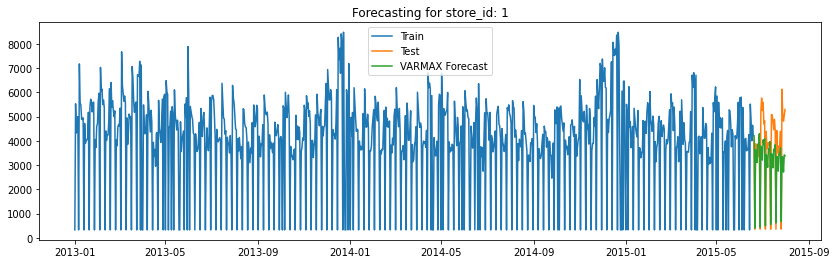

,Method,MAPE,RMSE
0,VAR_MODEL,24.21,1124.06


In [423]:
# run VAR model with earlier identified AR value
model_fit_store1_no_exog, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset['Sales'], 
                                       dataset_series_map['Sales_boxcox'],
                                       dataset_series_map['Customers_boxcox'],
                                       None, 15, 0)
store_1_res_var_model1_no_exog = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
store_1_res_var_model1_no_exog

#### Plot the Impulse response function for store-1

[Text(0.5, 0, 'Day'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

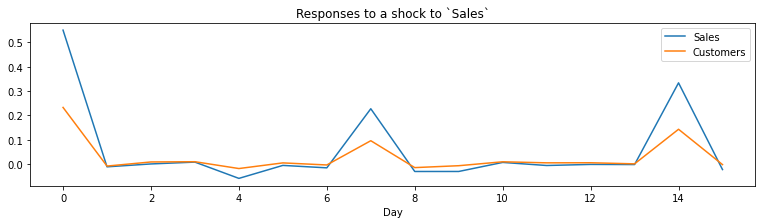

In [424]:
ax = model_fit_store1_no_exog.impulse_responses(15, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Day', title='Responses to a shock to `Sales`')

##### From above plot we can observe that Shock in customers flow to store impact  Sales immediately. From day 1 to day 3 slope of Sales and customer is zero and sales and customer values also zero and It could be due to holiday.

#### 6. Run VARMAX for store-id 1 using the AR lag 15 with Promo as Exogonus variable

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


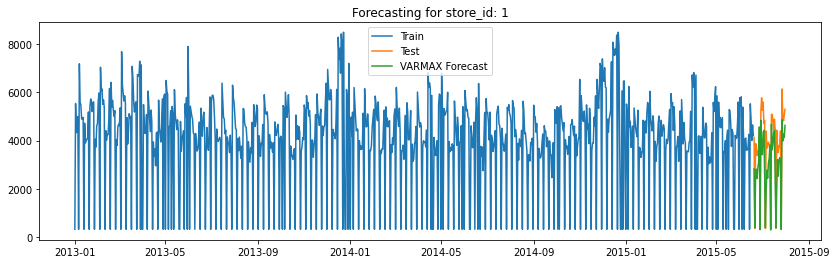

,Method,MAPE,RMSE
0,VAR_MODEL_with_promo,21.36,1119.73


In [421]:
# run VAR model with earlier identified AR value
varmax_model_fit_store1_with_promo, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset['Sales'], 
                                       dataset_series_map['Sales_boxcox'],
                                       dataset_series_map['Customers_boxcox'],
                                       original_dataset['Promo'], 15, 0)
store_1_res_var_model1_with_promo = pd.DataFrame({'Method':['VAR_MODEL_with_promo'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
store_1_res_var_model1_with_promo

#### After adding exogenous variable for store-1 prediction quality increased bit and MAPE reduced from 25.48 to 22.53

[Text(0.5, 0, 'Day'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

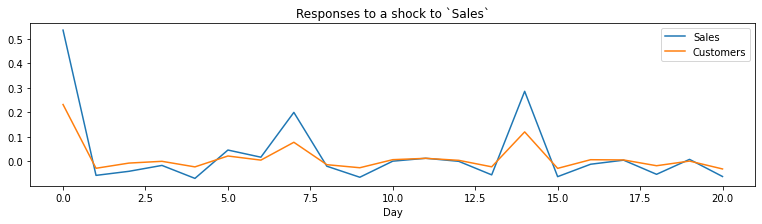

In [422]:
ax = varmax_model_fit_store1_with_promo.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Day', title='Responses to a shock to `Sales`')

##### From above plot we can observe that Shock in customers flow to store impact  Sales immediately. From day 1 to day 3 slope of Sales and customer is zero and sales moving '-ve' values and customer values at zero.

#### 7. Run VARMAX for store-id 1 using the AR lag 15 with Promo and Promo2 as Exogonus variables

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


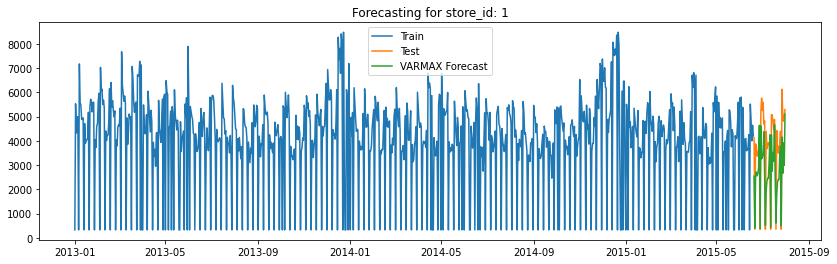

,Method,MAPE,RMSE
0,VAR_MODEL,29.9,1385.78


In [419]:
# run VAR model with earlier identified AR value
varmax_model_fit_store1, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset['Sales'], 
                                       dataset_series_map['Sales_boxcox'],
                                       dataset_series_map['Customers_boxcox'],
                                       store1_exog_variables, 15, 0)
store_1_res_var_model1_with_prom_and_promo2 = pd.DataFrame({'Method':['VAR_MODEL-With_promo_and_promo2'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
store_1_res_var_model1_with_prom_and_promo2

In [420]:
store_1_res_var_model1_with_prom_and_promo2 = pd.DataFrame({'Method':['VAR_MODEL-With_promo_and_promo2'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
store_1_res_var_model1_with_prom_and_promo2

,Method,MAPE,RMSE
0,VAR_MODEL-With_promo_and_promo2,29.9,1385.78


#### 7. Run Holt Winters' additive method with trend and seasonality for Store Id - 1

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\tsa\holtwinters\model.py:922: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning,


{'smoothing_level': 0.05214285714285714, 'smoothing_trend': nan, 'smoothing_seasonal': 0.1387108013937282, 'damping_trend': nan, 'initial_level': 4662.331395348837, 'initial_trend': nan, 'initial_seasons': array([-4337.58139535,   867.66860465,  -335.33139535,  -176.33139535,
         334.66860465, -4337.58139535,  2513.66860465]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


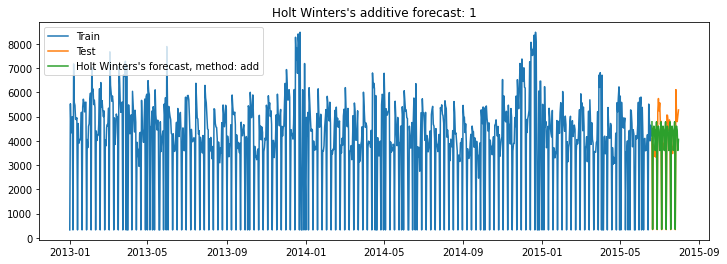

,Method,MAPE,RMSE
0,Holt Winters' additive method,13.97,765.47


In [351]:
store_id = 1
dataset_series_map = store_id_vs_calculated_data_series.get(store_id)
original_dataset = store_id_vs_sales_data.get(store_id)
mape_error, rmse_error = run_holts_winter_model(1, original_dataset['Sales'])
holts_winter_res_store_1 = pd.DataFrame({'Method':['Holt Winters\' additive method'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
holts_winter_res_store_1

### Time Series Analysis and Forecasting for Store-3

#### Store_Id = 1 - RUN SARIMAX with exogenous and with-out exegenous variable
- As part of this first we run auto_arima to get values for p, q, d
- Once we get these values we run model and perform forecast

In [425]:
# Run Auto-ARIMA for store Id 3
store_id = 3
dataset_series_map_store_3 = store_id_vs_calculated_data_series.get(store_id)
original_dataset_store_3 = store_id_vs_sales_data.get(store_id)
run_auto_arima(dataset_series_map_store_3['Sales_boxcox'], None)

                                       SARIMAX Results                                        
Dep. Variable:                                      y   No. Observations:                  942
Model:             SARIMAX(2, 0, 1)x(1, 0, [1, 2], 7)   Log Likelihood               -1774.253
Date:                                Sat, 14 Aug 2021   AIC                           3564.506
Time:                                        23:59:45   BIC                           3603.290
Sample:                                             0   HQIC                          3579.289
                                                - 942                                         
Covariance Type:                                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0276      0.017      1.608      0.108      -0.006       0.061
ar.

#### 1. Run Model for store-3 using above identified parameters without exogenous

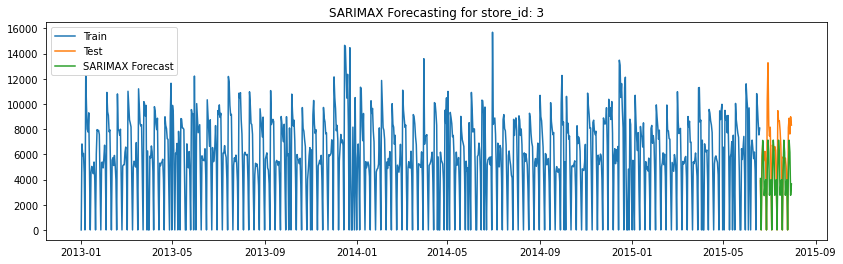

,Method,MAPE,RMSE
0,SARIMAX-No_EXOG,37.54,2768.55


In [157]:
# call function to create SARIMAX model for sales data
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_3['Sales'], 
                                                             dataset_series_map_store_3['Sales_boxcox'], 
                                                             None, (2, 0, 1), (1, 0, [1, 2], 7))
sarimax_store_3_no_exog = pd.DataFrame({'Method':['SARIMAX-No_EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_3_no_exog

#### Store-id=3 Run auto_arima with following exogenous variables
- Promo
- Promo2Active

In [158]:
run_auto_arima(dataset_series_map_store_3['Sales_boxcox'], original_dataset_store_3['Promo'].values.reshape(-1, 1))

                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                  942
Model:             SARIMAX(2, 0, 3)x(1, 0, [1], 7)   Log Likelihood               -1762.646
Date:                             Thu, 12 Aug 2021   AIC                           3545.292
Time:                                     00:35:58   BIC                           3593.772
Sample:                                          0   HQIC                          3563.771
                                             - 942                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0819      0.048      1.699      0.089      -0.013       0.176
x1             0.6819      

#### 2. Run SARIMAX with exogenous Promo for store-3

using exog


c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


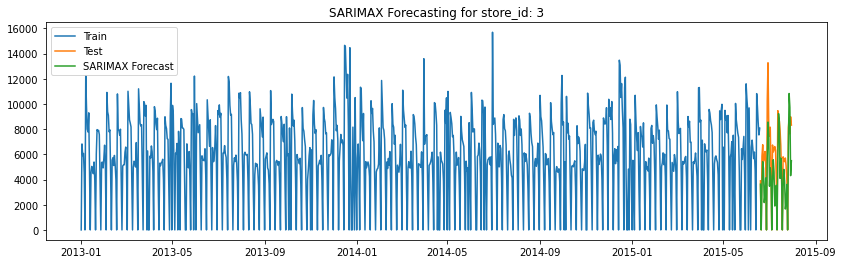

,Method,MAPE,RMSE
0,SARIMAX-EXOG,38.25,2482.11


In [159]:
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_3['Sales'], 
                                                             dataset_series_map_store_3['Sales_boxcox'], 
                                                             original_dataset_store_3['Promo'], (2, 0, 3), (1, 0, 1, 7))
sarimax_store_3_exog = pd.DataFrame({'Method':['SARIMAX-EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_3_exog

#### Use Promo2Active as exogenous variable for store-id and check the prediction quality

In [160]:
run_auto_arima(dataset_series_map_store_3['Sales_boxcox'], original_dataset_store_3['Promo2Active'].values.reshape(-1, 1))

                                 SARIMAX Results                                 
Dep. Variable:                         y   No. Observations:                  942
Model:             SARIMAX(2, 0, [1], 7)   Log Likelihood               -1868.780
Date:                   Thu, 12 Aug 2021   AIC                           3749.560
Time:                           00:42:27   BIC                           3778.648
Sample:                                0   HQIC                          3760.647
                                   - 942                                         
Covariance Type:                     opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.6390      0.123      5.191      0.000       0.398       0.880
x1            -0.2508      0.104     -2.414      0.016      -0.454      -0.047
ar.S.L7        0.6830      0

#### 3. Run SARIMAX with exogenous Promo2Active for store-3

using exog


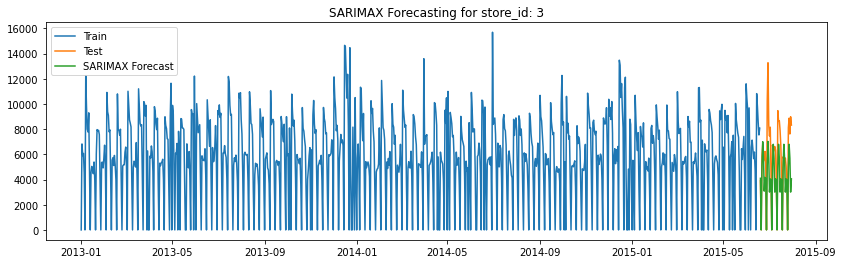

,Method,MAPE,RMSE
0,SARIMAX-EXOG,36.82,2631.19


In [161]:
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_3['Sales'], 
                                                             dataset_series_map_store_3['Sales_boxcox'], 
                                                             original_dataset_store_3['Promo2Active'], (0, 0, 0), (2, 0, [1], 7))
sarimax_store_3_exog_promo2 = pd.DataFrame({'Method':['SARIMAX-EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_3_exog_promo2

#### Use Promo2Active and Promo as exogenous variables for store-id-3 and check the prediction quality

In [426]:
store3_exog_variables = pd.concat([original_dataset_store_3['Promo'], original_dataset_store_3['Promo2Active']], axis=1)
run_auto_arima(dataset_series_map_store_3['Sales_boxcox'], store3_exog_variables.values.reshape(-1, 2))

                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                  942
Model:             SARIMAX(2, 0, 2)x(1, 0, [1], 7)   Log Likelihood               -1765.179
Date:                             Sun, 15 Aug 2021   AIC                           3550.358
Time:                                     00:12:22   BIC                           3598.838
Sample:                                          0   HQIC                          3568.837
                                             - 942                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0026      0.002      1.468      0.142      -0.001       0.006
x1             0.6924      

#### 4. Run SARIMAX with exogenous variables Promo and Promo2Active for store-3

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


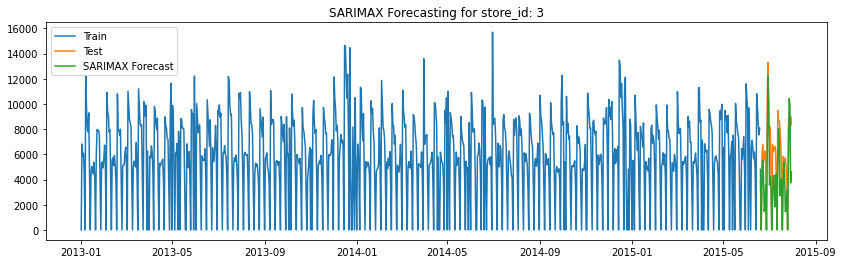

,Method,MAPE,RMSE
0,SARIMAX-With-Promo-And_promo2,45.39,2743.81


In [427]:
# run model with Promo2Active as exognous variable using previous identified p, q values
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_3['Sales'], 
                                                             dataset_series_map_store_3['Sales_boxcox'],
                                                             store3_exog_variables, (2, 0, 2), (1, 0, [1], 7))
store_3_sarimax_with_promo_and_promo2 = pd.DataFrame({'Method':['SARIMAX-With-Promo-And_promo2'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
store_3_sarimax_with_promo_and_promo2

### VAR model for store-id - 3

- Since bother Sales_boxcox and Cutomers_boxcox series are stationary from ADF test not required to run cointegration check.
- For Identify p to run VAR  model with range 1-15 for both params get best fit combination.

In [162]:
# create transformed data set for store-3
transformed_data_store_3 = pd.concat([dataset_series_map_store_3['Sales_boxcox'], dataset_series_map_store_3['Customers_boxcox']], axis=1)
var_model_store_3 = VAR(transformed_data_store_3)

var_fit_store_3 = var_model_store_3.select_order(maxlags=15)
var_fit_store_3.summary()

,AIC,BIC,FPE,HQIC
0,-2.582,-2.571,0.07565,-2.578
1,-2.841,-2.810,0.05836,-2.829
2,-2.955,-2.903,0.05207,-2.935
3,-2.982,-2.909,0.05068,-2.954
4,-3.060,-2.967,0.04687,-3.025
5,-3.159,-3.044,0.04247,-3.115
6,-3.414,-3.279,0.03290,-3.363
7,-4.050,-3.894,0.01742,-3.991
8,-4.062,-3.885,0.01721,-3.995
9,-4.060,-3.862,0.01725,-3.984


####  4. Run VAR for store-id 3 using the AR lag 15 and check the prediction quality

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VAR(15)   Log Likelihood                -412.205
Date:                    Thu, 12 Aug 2021   AIC                            950.410
Time:                            00:59:16   BIC                           1252.961
Sample:                        01-01-2013   HQIC                          1065.987
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.05, 0.00   Jarque-Bera (JB):      5890.39, 100.77
Prob(Q):                        0.82, 0.97   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.22, 1.41   Skew:                      -2.19, 0.17
Prob(H) (two-sided):            0.08, 0.00   Kurtosis:                  14.74, 4.60


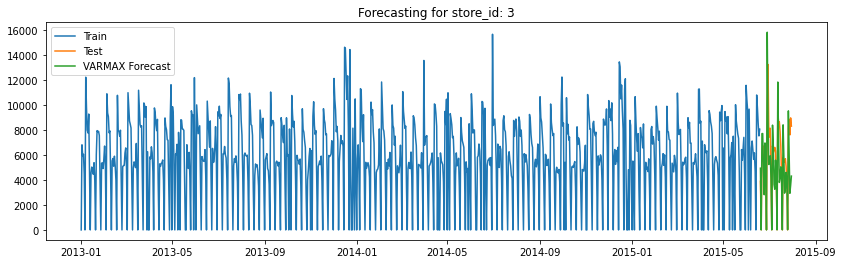

,Method,MAPE,RMSE
0,VAR_MODEL,31.49,2452.94


In [164]:
# run VAR model with earlier identified AR value
model_fit_store3, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_3['Sales'], 
                                       dataset_series_map_store_3['Sales_boxcox'],
                                       dataset_series_map_store_3['Customers_boxcox'],
                                       None, 15, 0)
var_mode_res_store_3_no_exog = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_mode_res_store_3_no_exog

#### Plot the Impulse response function for store-3

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

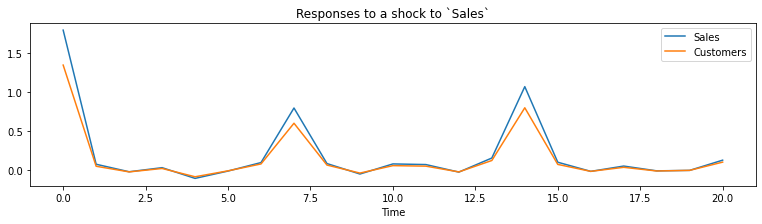

In [165]:
ax = model_fit_store3.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

##### From above plot we can observe that Shock customers visiting to store is  impact immediately Sales of store-3 both the plot hugging each oher and moving together.

#### 5. Run VARMAX for store-id 3 using the AR lag 15 with Promo as Exogonus variable

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                           VARX(15)   Log Likelihood                -357.781
Date:                    Thu, 12 Aug 2021   AIC                            845.563
Time:                            01:16:39   BIC                           1157.718
Sample:                        01-01-2013   HQIC                           964.808
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.63, 3.39   Jarque-Bera (JB):      4769.30, 130.64
Prob(Q):                        0.43, 0.07   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.23, 1.24   Skew:                      -1.99, 0.04
Prob(H) (two-sided):            0.08, 0.06   Kurtosis:                  13.55, 4.86


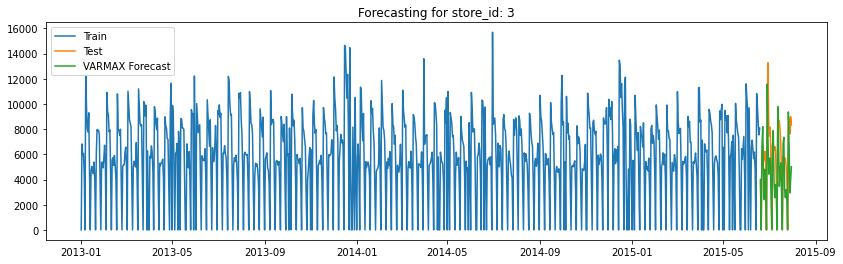

,Method,MAPE,RMSE
0,VAR_MODEL,33.95,2462.59


In [166]:
# run VAR model with earlier identified AR value
varmax_model_fit_store3, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_3['Sales'], 
                                       dataset_series_map_store_3['Sales_boxcox'],
                                       dataset_series_map_store_3['Customers_boxcox'],
                                       original_dataset_store_3['Promo'], 15, 0)
var_mode_res_store_3_exog_promo = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_mode_res_store_3_exog_promo

#### Plot Impulse response function for above model for store-3

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

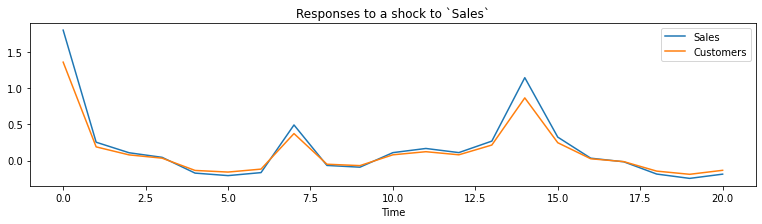

In [169]:
ax = varmax_model_fit_store3.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

##### From above plot we can observe that Shock in customers flow to store impact  Sales immediately and both these series are highly correlated each other.

#### 6. Run VARMAX for store-id 3 using the AR lag 15 with Promo2 as Exogonus variable

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                           VARX(15)   Log Likelihood                -416.090
Date:                    Thu, 12 Aug 2021   AIC                            962.179
Time:                            02:07:08   BIC                           1274.335
Sample:                        01-01-2013   HQIC                          1081.425
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.08, 0.08   Jarque-Bera (JB):       5508.13, 85.09
Prob(Q):                        0.77, 0.78   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.22, 1.41   Skew:                      -2.22, 0.17
Prob(H) (two-sided):            0.09, 0.00   Kurtosis:                  14.28, 4.47


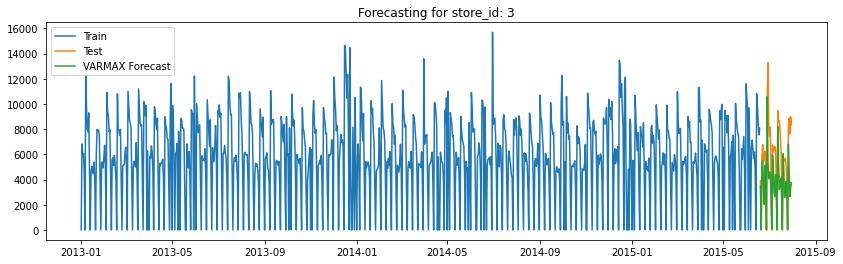

,Method,MAPE,RMSE
0,VAR_MODEL,38.59,2880.03


In [212]:
# run VAR model with earlier identified AR value
varmax_model_fit_store3_promo2, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_3['Sales'], 
                                       dataset_series_map_store_3['Sales_boxcox'],
                                       dataset_series_map_store_3['Customers_boxcox'],
                                       original_dataset_store_3['Promo2Active'], 15, 0)
var_mode_res_store_3_exog_promo2 = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_mode_res_store_3_exog_promo2

#### 7. Run Holt Winters' additive method with trend and seasonality for Store Id - 3

{'smoothing_level': 0.005, 'smoothing_trend': nan, 'smoothing_seasonal': 0.11845238095238095, 'damping_trend': nan, 'initial_level': 7559.085271317829, 'initial_trend': nan, 'initial_seasons': array([-7559.08527132,  -736.08527132, -1657.08527132, -1490.08527132,
       -3036.08527132, -7559.08527132,  4687.91472868]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\tsa\holtwinters\model.py:922: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning,


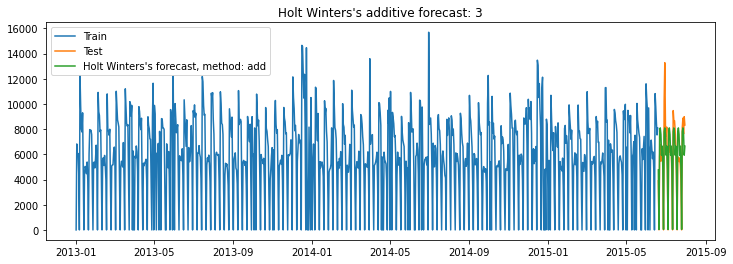

,Method,MAPE,RMSE
0,Holt Winters' additive method,68.65,1510.81


In [210]:
mape_error, rmse_error = run_holts_winter_model(store_id, original_dataset_store_3['Sales'])
holts_winter_res_store_3 = pd.DataFrame({'Method':['Holt Winters\' additive method'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
holts_winter_res_store_3

### Time Series Analysis and Forecasting for Store-8

#### Store_Id - 8 - RUN SARIMAX with exogenous and without exegenous variable
- As part of this first we run auto_arima to get values for p, q, d
- Once we get these values we run model and perform forecast

In [429]:
# Run Auto-ARIMA for store Id 8
store_id = 8
dataset_series_map_store_8 = store_id_vs_calculated_data_series.get(store_id)
original_dataset_store_8 = store_id_vs_sales_data.get(store_id)
run_auto_arima(dataset_series_map_store_8['Sales_boxcox'], None)

                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                  942
Model:             SARIMAX(1, 0, 3)x(1, 0, [1], 7)   Log Likelihood               -1668.078
Date:                             Sun, 15 Aug 2021   AIC                           3352.156
Time:                                     02:13:45   BIC                           3390.940
Sample:                                          0   HQIC                          3366.939
                                             - 942                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0166      0.011      1.503      0.133      -0.005       0.038
ar.L1         -0.1900      

#### 1. Run Model for store-8 using above identified parameters without exogenous

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


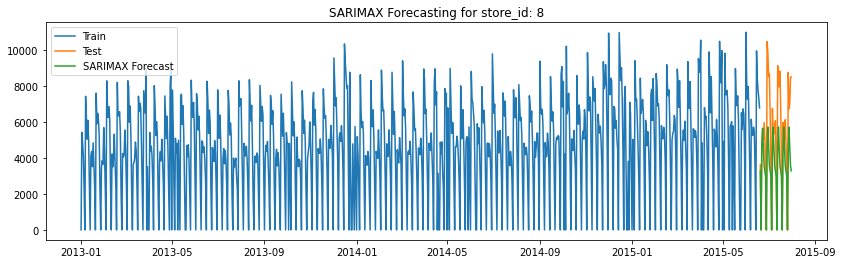

,Method,MAPE,RMSE
0,SARIMAX-No_EXOG,38.11,2700.79


In [215]:
# call function to create SARIMAX model for sales data
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_8['Sales'], 
                                                             dataset_series_map_store_8['Sales_boxcox'], 
                                                             None, (1, 0, 3), (1, 0, [1], 7))
sarimax_store_8_no_exog = pd.DataFrame({'Method':['SARIMAX-No_EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_8_no_exog

#### Store-id=8 Run auto_arima with following exogenous variables
- Promo
- Promo2Active

In [216]:
run_auto_arima(dataset_series_map_store_8['Sales_boxcox'], original_dataset_store_8['Promo'].values.reshape(-1, 1))

                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                  942
Model:             SARIMAX(3, 0, 0)x(1, 0, [1], 7)   Log Likelihood               -1660.251
Date:                             Thu, 12 Aug 2021   AIC                           3336.503
Time:                                     14:47:40   BIC                           3375.287
Sample:                                          0   HQIC                          3351.286
                                             - 942                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0348      0.015      2.379      0.017       0.006       0.063
x1             0.6815      

#### 2. Run SARIMAX with exogenous Promo for store-8

using exog


c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


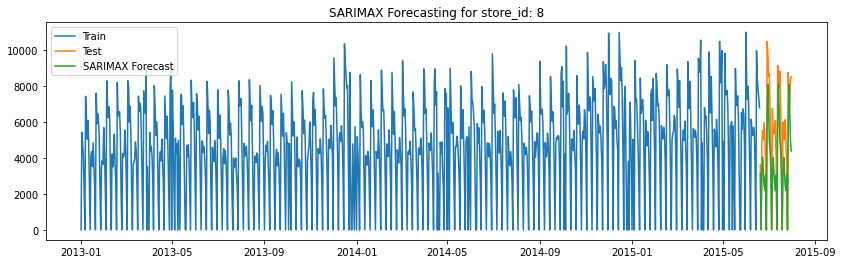

,Method,MAPE,RMSE
0,SARIMAX-EXOG,40.99,2322.14


In [219]:
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_8['Sales'], 
                                                             dataset_series_map_store_8['Sales_boxcox'], 
                                                             original_dataset_store_8['Promo'], (3, 0, 0), (1, 0, [1], 7) )
sarimax_store_8_exog_promo = pd.DataFrame({'Method':['SARIMAX-EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_8_exog_promo

#### Use Promo2Active as exogenous variable for store-id  8 and check the prediction quality

In [220]:
run_auto_arima(dataset_series_map_store_8['Sales_boxcox'], original_dataset_store_8['Promo2Active'].values.reshape(-1, 1))

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                  942
Model:             SARIMAX(0, 0, 1)x(2, 0, 1, 7)   Log Likelihood               -1676.637
Date:                           Thu, 12 Aug 2021   AIC                           3367.274
Time:                                   14:53:54   BIC                           3401.210
Sample:                                        0   HQIC                          3380.210
                                           - 942                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0198      0.012      1.692      0.091      -0.003       0.043
const               0    459.118          0

#### 3. Run SARIMAX with exogenous Promo2Active for store-8

using exog


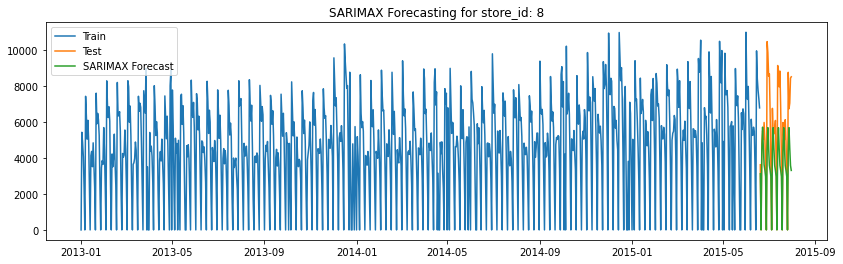

,Method,MAPE,RMSE
0,SARIMAX-EXOG,40.22,2705.55


In [221]:
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_8['Sales'], 
                                                             dataset_series_map_store_8['Sales_boxcox'], 
                                                             original_dataset_store_8['Promo2Active'], (0, 0, 1), (2, 0, 1, 7))
sarimax_store_8_exog_promo2 = pd.DataFrame({'Method':['SARIMAX-EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_8_exog_promo2

#### Use Promo and Promo2Active as exogenous variables for store-id  8 and check the prediction quality

In [428]:
store8_exog_variables = pd.concat([original_dataset_store_8['Promo'], original_dataset_store_8['Promo2Active']], axis=1)
run_auto_arima(dataset_series_map_store_8['Sales_boxcox'], store8_exog_variables.values.reshape(-1, 2))

                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                  942
Model:             SARIMAX(1, 0, 0)x(2, 0, [1], 7)   Log Likelihood               -1676.090
Date:                             Sun, 15 Aug 2021   AIC                           3368.180
Time:                                     02:10:16   BIC                           3406.964
Sample:                                          0   HQIC                          3382.963
                                             - 942                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0718      0.046      1.565      0.118      -0.018       0.162
x1             0.6474      

#### 4. Run SARIMAX with exogenous variables Promo and Promo2Active for store-8

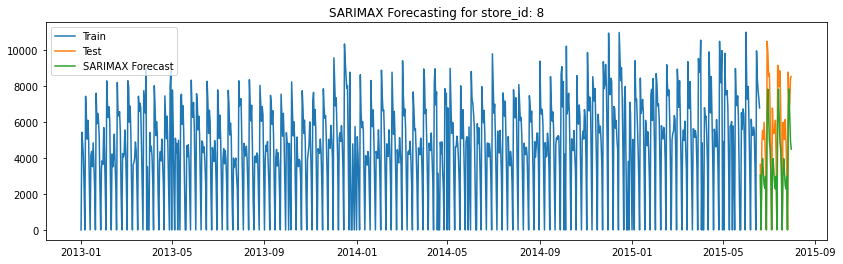

,Method,MAPE,RMSE
0,SARIMAX-With-Promo-And_promo2,42.99,2336.02


In [430]:
# run model with Promo2Active as exognous variable using previous identified p, q values
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_8['Sales'], 
                                                             dataset_series_map_store_8['Sales_boxcox'],
                                                             store8_exog_variables, (1, 0, 0), (2, 0, [1], 7))
store_8_sarimax_with_promo_and_promo2 = pd.DataFrame({'Method':['SARIMAX-With-Promo-And_promo2'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
store_8_sarimax_with_promo_and_promo2

### VAR model for store-id - 8

- Since bother Sales_boxcox and Cutomers_boxcox series are stationary from ADF test not required to run cointegration check.
- For Identify p to run VAR  model with range 1-15 for both params get best fit combination.

In [232]:
# create transformed data set for store-8
transformed_data_store_8 = pd.concat([dataset_series_map_store_8['Sales_boxcox'], dataset_series_map_store_8['Customers_boxcox']], axis=1)
var_model_store_8 = VAR(transformed_data_store_8)
var_fit_store_8 = var_model_store_8.select_order(maxlags=15)
var_fit_store_8.summary()

,AIC,BIC,FPE,HQIC
0,-2.499,-2.488,0.08219,-2.495
1,-2.759,-2.728,0.06334,-2.747
2,-2.785,-2.733,0.06170,-2.766
3,-2.984,-2.911,0.05060,-2.956
4,-3.297,-3.203,0.03698,-3.262
5,-3.339,-3.224,0.03548,-3.295
6,-3.578,-3.443,0.02792,-3.527
7,-4.262,-4.106,0.01409,-4.203
8,-4.295,-4.118,0.01363,-4.228
9,-4.308,-4.110,0.01346,-4.233


####  5. Run VAR for store-id 8 using the AR lag 15 and check the prediction quality

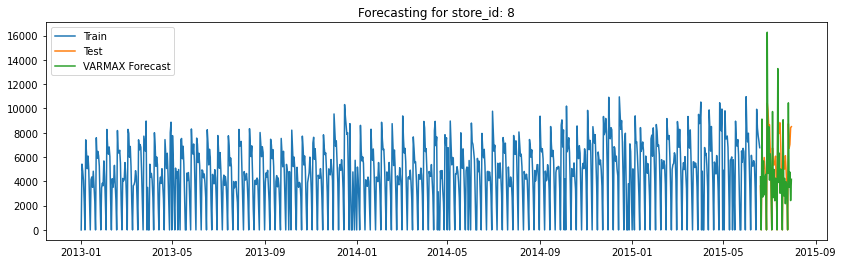

,Method,MAPE,RMSE
0,VAR_MODEL,41.58,2835.1


In [223]:
# run VAR model with earlier identified AR value
var_model_fit_store_8, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_8['Sales'], 
                                       dataset_series_map_store_8['Sales_boxcox'],
                                       dataset_series_map_store_8['Customers_boxcox'],
                                       None, 15, 0)
var_mode_res_store_8_no_exog = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_mode_res_store_8_no_exog

#### Plot the Impulse response function for store-8

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

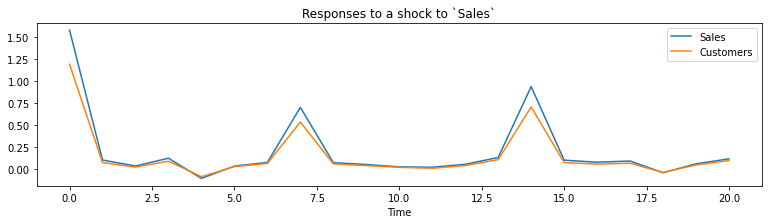

In [226]:
ax = var_model_fit_store_8.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

##### From above plot we can observe that Shock in customers flow to store impact  Sales immediately and both these series arre highly correlated.

#### 6. Run VARMAX for store-id 8 using the AR lag 15 with Promo as Exogonus variable

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


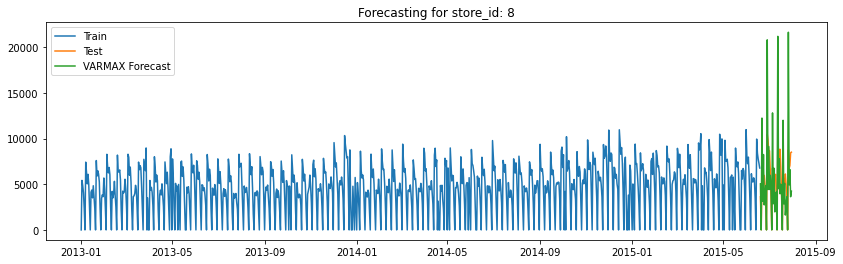

,Method,MAPE,RMSE
0,VAR_MODEL,54.68,4303.29


In [234]:
# run VAR model with earlier identified AR value
varmax_model_fit_store8_exog_promo, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_8['Sales'], 
                                       dataset_series_map_store_8['Sales_boxcox'],
                                       dataset_series_map_store_8['Customers_boxcox'],
                                       original_dataset_store_8['Promo'], 15, 0)
var_mode_res_store_8_exog_promo = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_mode_res_store_8_exog_promo

#### Plot Impulse response function for above model for store-8

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

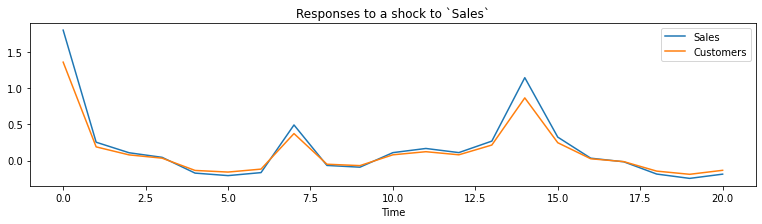

In [235]:
ax = varmax_model_fit_store3.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

##### From above plot we can observe that Shock in customers flow to store impact Sales immediately and both these series are highly correlated each other.

#### 7. Run VARMAX for store-id 8 using the AR lag 15 with Promo2 as Exogonus variable

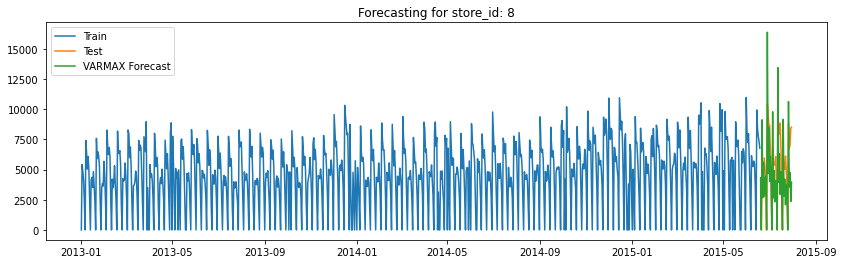

,Method,MAPE,RMSE
0,VAR_MODEL,43.2,2880.67


In [236]:
# run VAR model with earlier identified AR value
varmax_model_fit_store8_promo2, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_8['Sales'], 
                                       dataset_series_map_store_8['Sales_boxcox'],
                                       dataset_series_map_store_8['Customers_boxcox'],
                                       original_dataset_store_8['Promo2Active'], 15, 0)
var_mode_res_store_8_exog_promo2 = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_mode_res_store_8_exog_promo2

#### 8. Run Holt Winters' additive method with trend and seasonality for Store Id - 8

{'smoothing_level': 0.42928571428571427, 'smoothing_trend': nan, 'smoothing_seasonal': 0.12484375, 'damping_trend': nan, 'initial_level': 6104.418604651163, 'initial_trend': nan, 'initial_seasons': array([-6104.41860465,  -685.41860465, -1262.41860465, -2045.41860465,
       -3767.41860465, -6104.41860465,  1311.58139535]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\tsa\holtwinters\model.py:922: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning,


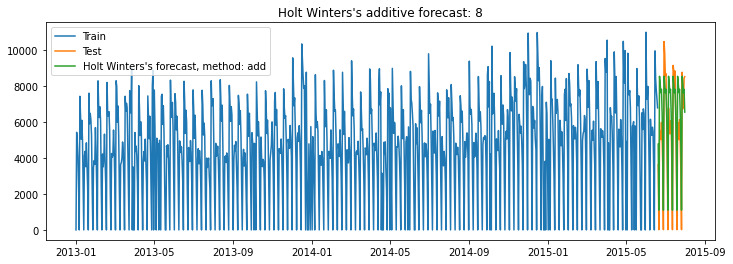

,Method,MAPE,RMSE
0,Holt Winters' additive method,1129.56,1647.01


In [240]:
mape_error, rmse_error = run_holts_winter_model(store_id, original_dataset_store_8['Sales'], seasonal='add')
holts_winter_res_store_8 = pd.DataFrame({'Method':['Holt Winters\' additive method'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
holts_winter_res_store_8

### Time Series Analysis and Forecasting for Store-9

#### Store_Id = 9 - RUN SARIMAX with exogenous and with-out exegenous variable
- As part of this first we run auto_arima to get values for p, q, d
- Once we get these values we run model and perform forecast

In [241]:
# Run Auto-ARIMA for store Id 3
store_id = 9
dataset_series_map_store_9 = store_id_vs_calculated_data_series.get(store_id)
original_dataset_store_9 = store_id_vs_sales_data.get(store_id)
run_auto_arima(dataset_series_map_store_9['Sales_boxcox'], None)

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                  942
Model:             SARIMAX(5, 1, 0)x(2, 0, 0, 7)   Log Likelihood               -1251.323
Date:                           Thu, 12 Aug 2021   AIC                           2518.646
Time:                                   19:54:52   BIC                           2557.421
Sample:                                        0   HQIC                          2533.427
                                           - 942                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8128      0.024    -34.410      0.000      -0.859      -0.766
ar.L2         -0.6181      0.038    -16.135

#### 1. Run Model for store-9 using above identified parameters without exogenous

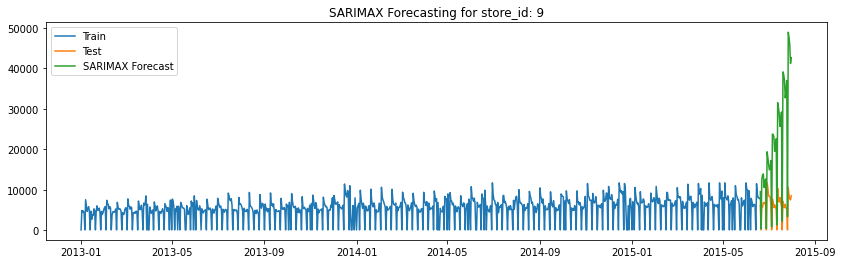

,Method,MAPE,RMSE
0,SARIMAX-No_EXOG,376.13,20195.64


In [246]:
# call function to create SARIMAX model for sales data
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_9['Sales'], 
                                                             dataset_series_map_store_9['Sales_boxcox'], 
                                                             None, (5, 1, 0), (2, 0, 0, 7))
sarimax_store_9_no_exog = pd.DataFrame({'Method':['SARIMAX-No_EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_9_no_exog

#### Store-id=9 Run auto_arima with following exogenous variables
- Promo
- Promo2Active

In [247]:
run_auto_arima(dataset_series_map_store_9['Sales_boxcox'], original_dataset_store_9['Promo'].values.reshape(-1, 1))

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                  942
Model:             SARIMAX(4, 1, 1)x(2, 0, 1, 7)   Log Likelihood               -1026.250
Date:                           Thu, 12 Aug 2021   AIC                           2074.501
Time:                                   20:09:02   BIC                           2127.817
Sample:                                        0   HQIC                          2094.824
                                           - 942                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept  -2.102e-06   4.29e-05     -0.049      0.961   -8.62e-05     8.2e-05
x1             0.3576      0.053      6.747

#### 2. Run SARIMAX with exogenous Promo for store-9

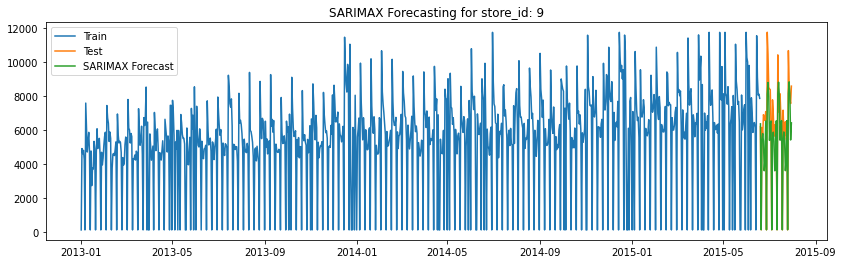

,Method,MAPE,RMSE
0,SARIMAX-EXOG,16.76,1630.99


In [248]:
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_9['Sales'], 
                                                             dataset_series_map_store_9['Sales_boxcox'], 
                                                             original_dataset_store_9['Promo'], (4, 1, 1), (2, 0, 1, 7))
sarimax_store_9_exog = pd.DataFrame({'Method':['SARIMAX-EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_9_exog

#### Use Promo2Active as exogenous variable for store-id-9 and check the prediction quality

In [249]:
run_auto_arima(dataset_series_map_store_9['Sales_boxcox'], original_dataset_store_9['Promo2Active'].values.reshape(-1, 1))

                                 SARIMAX Results                                 
Dep. Variable:                         y   No. Observations:                  942
Model:             SARIMAX(1, 0, [1], 7)   Log Likelihood               -1052.072
Date:                   Thu, 12 Aug 2021   AIC                           2114.145
Time:                           20:19:56   BIC                           2138.385
Sample:                                0   HQIC                          2123.384
                                   - 942                                         
Covariance Type:                     opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0551      0.036      1.516      0.130      -0.016       0.126
const               0   3985.065          0      1.000   -7810.583    7810.583
ar.S.L7        0.9931      0

#### 3. Run SARIMAX with exogenous Promo2Active for store-9

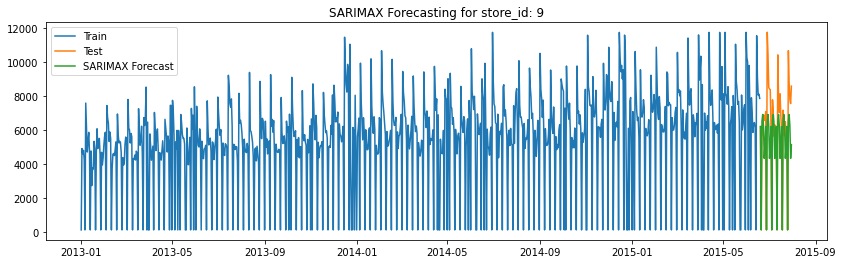

,Method,MAPE,RMSE
0,SARIMAX-EXOG,19.46,2052.08


In [250]:
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_9['Sales'], 
                                                             dataset_series_map_store_9['Sales_boxcox'], 
                                                             original_dataset_store_9['Promo2Active'], (0, 0, 0), (1, 0, [1], 7))
sarimax_store_9_exog_promo2 = pd.DataFrame({'Method':['SARIMAX-EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_9_exog_promo2

#### Use Promo and Promo2Active as exogenous variables for store-id-9 and check the prediction quality

In [431]:
store9_exog_variables = pd.concat([original_dataset_store_9['Promo'], original_dataset_store_9['Promo2Active']], axis=1)
run_auto_arima(dataset_series_map_store_9['Sales_boxcox'], store9_exog_variables.values.reshape(-1, 2))

                                       SARIMAX Results                                        
Dep. Variable:                                      y   No. Observations:                  942
Model:             SARIMAX(1, 0, 0)x(1, 0, [1, 2], 7)   Log Likelihood               -1012.520
Date:                                Sun, 15 Aug 2021   AIC                           2041.040
Time:                                        02:19:08   BIC                           2079.824
Sample:                                             0   HQIC                          2055.824
                                                - 942                                         
Covariance Type:                                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0278      0.018      1.559      0.119      -0.007       0.063
x1 

#### 4. Run SARIMAX with exogenous variables Promo and Promo2Active for store-9

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


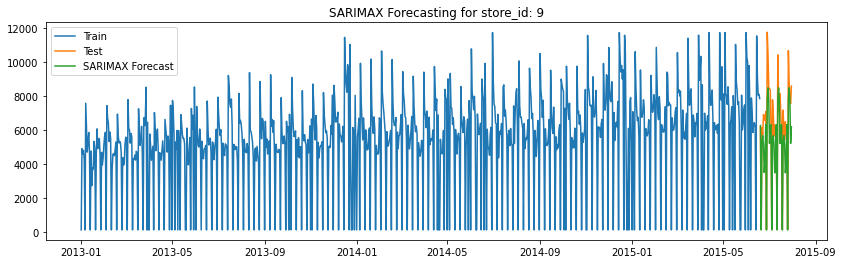

,Method,MAPE,RMSE
0,SARIMAX-With-Promo-And_promo2,19.27,1748.77


In [432]:
# run model with Promo2Active as exognous variable using previous identified p, q values
store_id=9
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_9['Sales'], 
                                                             dataset_series_map_store_9['Sales_boxcox'],
                                                             store9_exog_variables, (2, 0, 1), (1, 0, [1, 2], 7))
store_9_sarimax_with_promo_and_promo2 = pd.DataFrame({'Method':['SARIMAX-With-Promo-And_promo2'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
store_9_sarimax_with_promo_and_promo2

### VAR model for store-id - 9

- Since bother Sales_boxcox and Cutomers_boxcox series are stationary from ADF test not required to run cointegration check.
- For Identify p to run VAR  model with range 1-15 for both params get best fit combination.

In [251]:
# create transformed data set for store-3
transformed_data_store_9 = pd.concat([dataset_series_map_store_9['Sales_boxcox'], dataset_series_map_store_9['Customers_boxcox']], axis=1)
var_model_store_9 = VAR(transformed_data_store_9)

var_fit_store_9 = var_model_store_9.select_order(maxlags=15)
var_fit_store_9.summary()

,AIC,BIC,FPE,HQIC
0,-4.156,-4.145,0.01567,-4.152
1,-4.600,-4.569,0.01005,-4.588
2,-4.692,-4.640,0.009170,-4.672
3,-4.761,-4.688,0.008555,-4.733
4,-4.804,-4.710,0.008199,-4.768
5,-4.869,-4.755,0.007678,-4.826
6,-5.168,-5.033,0.005693,-5.117
7,-5.775,-5.619,0.003105,-5.715
8,-5.802,-5.624,0.003022,-5.734
9,-5.813,-5.614,0.002990,-5.737


####  5. Run VAR for store-id 9 using the AR lag 15 and check the prediction quality

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


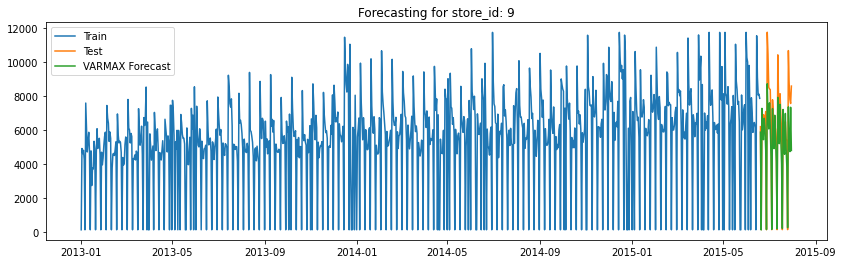

,Method,MAPE,RMSE
0,VAR_MODEL,21.71,1729.24


In [252]:
# run VAR model with earlier identified AR value
model_fit_store9, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_9['Sales'], 
                                       dataset_series_map_store_9['Sales_boxcox'],
                                       dataset_series_map_store_9['Customers_boxcox'],
                                       None, 15, 0)
var_mode_res_store_9_no_exog = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_mode_res_store_9_no_exog

#### Plot the Impulse response function for store-3

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

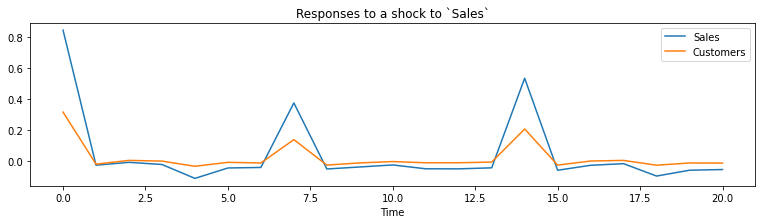

In [253]:
ax = model_fit_store9.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

##### From above plot we can observe that Shock in customers flow to store impact Sales immediately and both these series are highly correlated each other.

#### 6. Run VARMAX for store-id 9 using the AR lag 15 with Promo as Exogonus variable

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


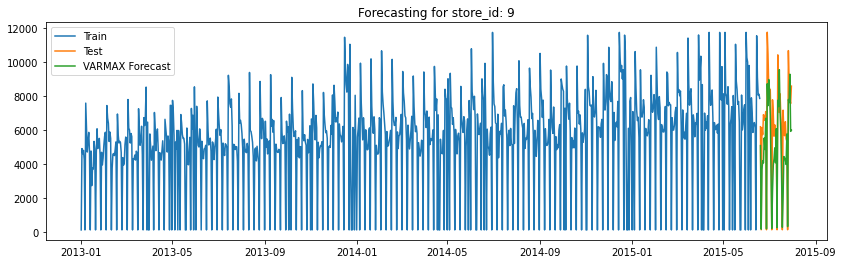

,Method,MAPE,RMSE
0,VAR_MODEL,33.66,2056.56


In [254]:
# run VAR model with earlier identified AR value
varmax_model_fit_store9, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_9['Sales'], 
                                       dataset_series_map_store_9['Sales_boxcox'],
                                       dataset_series_map_store_9['Customers_boxcox'],
                                       original_dataset_store_9['Promo'], 15, 0)
var_mode_res_store_9_exog_promo = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_mode_res_store_9_exog_promo

#### Plot Impulse response function for above model for store-9

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

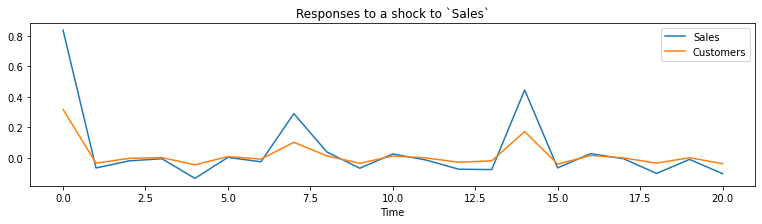

In [255]:
ax = varmax_model_fit_store9.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

##### From above plot we can observe that Shock in customers flow to store impact Sales immediately and both these series are highly correlated each other.

#### 7. Run VARMAX for store-id 9 using the AR lag 15 with Promo2 as Exogonus variable

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


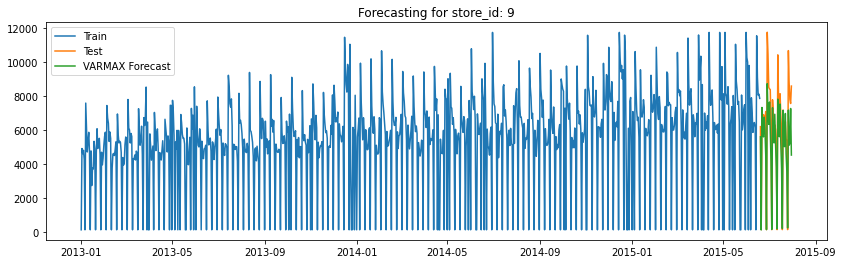

,Method,MAPE,RMSE
0,VAR_MODEL,21.41,1746.88


In [256]:
# run VAR model with earlier identified AR value
varmax_model_fit_store9_promo2, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_9['Sales'], 
                                       dataset_series_map_store_9['Sales_boxcox'],
                                       dataset_series_map_store_9['Customers_boxcox'],
                                       original_dataset_store_9['Promo2Active'], 15, 0)
var_mode_res_store_9_exog_promo2 = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_mode_res_store_9_exog_promo2

#### Plot Impulse response function for above model for store-9

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

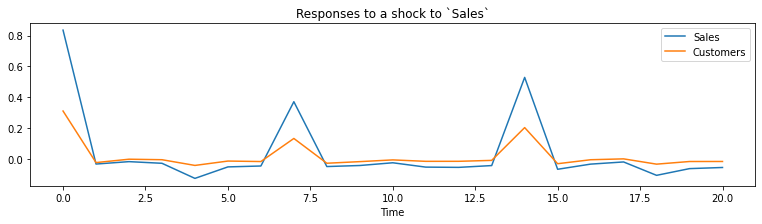

In [257]:
ax = varmax_model_fit_store9_promo2.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

##### From above plot we can observe that Shock in customers flow to store impact Sales immediately and both these series are highly correlated each other.

#### 8. Run Holt Winters' additive method with trend and seasonality for Store Id - 9

{'smoothing_level': 0.005, 'smoothing_trend': nan, 'smoothing_seasonal': 0.09476190476190476, 'damping_trend': nan, 'initial_level': 6480.604651162791, 'initial_trend': nan, 'initial_seasons': array([-6357.60465116, -1577.60465116, -1878.60465116, -1682.60465116,
       -2226.60465116, -6357.60465116,  1093.39534884]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\tsa\holtwinters\model.py:922: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning,


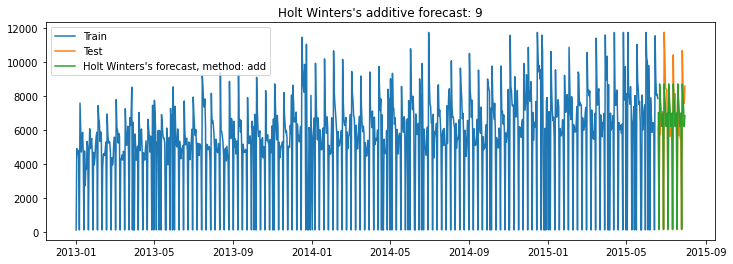

,Method,MAPE,RMSE
0,Holt Winters' additive method,18.59,1359.84


In [259]:
mape_error, rmse_error = run_holts_winter_model(store_id, original_dataset_store_9['Sales'], trend=None)
holts_winter_res_store_9 = pd.DataFrame({'Method':['Holt Winters\' additive method'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
holts_winter_res_store_9

### Time Series Analysis and Forecasting for Store-13

#### Store_Id = 13 - RUN SARIMAX with exogenous and with-out exegenous variable
- As part of this first we run auto_arima to get values for p, q, d
- Once we get these values we run model and perform forecast

In [260]:
# Run Auto-ARIMA for store Id 13
store_id = 13
dataset_series_map_store_13 = store_id_vs_calculated_data_series.get(store_id)
original_dataset_store_13 = store_id_vs_sales_data.get(store_id)
run_auto_arima(dataset_series_map_store_13['Sales_boxcox'], None)

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                  942
Model:             SARIMAX(3, 1, 1)x(1, 0, 1, 7)   Log Likelihood               -1836.568
Date:                           Thu, 12 Aug 2021   AIC                           3689.136
Time:                                   23:17:00   BIC                           3727.911
Sample:                                        0   HQIC                          3703.917
                                           - 942                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   1.309e-05      0.000      0.072      0.942      -0.000       0.000
ar.L1          0.0196      0.028      0.696

#### 1. Run Model for store-13 using above identified parameters without exogenous

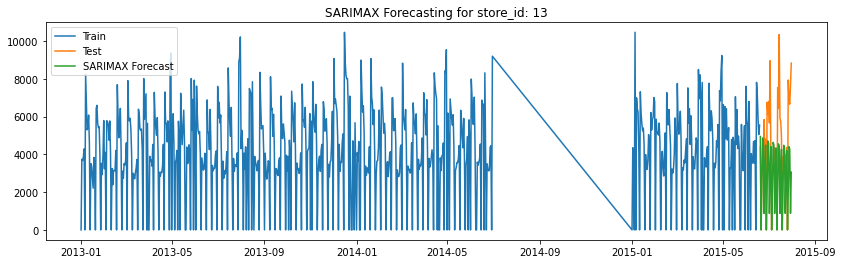

,Method,MAPE,RMSE
0,SARIMAX-No_EXOG,46.29,2982.24


In [261]:
# call function to create SARIMAX model for sales data
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_13['Sales'], 
                                                             dataset_series_map_store_13['Sales_boxcox'], 
                                                             None, (3, 1, 1), (1, 0, 1, 7))
sarimax_store_13_no_exog = pd.DataFrame({'Method':['SARIMAX-No_EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_13_no_exog

#### Store-id=13 Run auto_arima with following exogenous variables
- Promo
- Promo2Active

In [262]:
run_auto_arima(dataset_series_map_store_13['Sales_boxcox'], original_dataset_store_13['Promo'].values.reshape(-1, 1))

                                       SARIMAX Results                                        
Dep. Variable:                                      y   No. Observations:                  942
Model:             SARIMAX(2, 1, 3)x(2, 0, [1, 2], 7)   Log Likelihood               -1810.330
Date:                                Thu, 12 Aug 2021   AIC                           3642.661
Time:                                        23:21:45   BIC                           3695.977
Sample:                                             0   HQIC                          3662.984
                                                - 942                                         
Covariance Type:                                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.7870      0.100      7.832      0.000       0.590       0.984
ar.

#### 2. Run SARIMAX with exogenous Promo for store-13

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


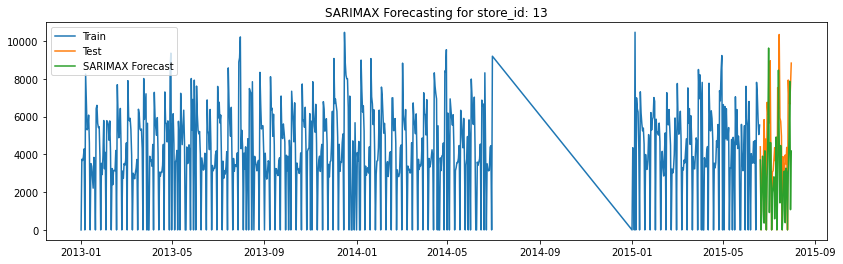

,Method,MAPE,RMSE
0,SARIMAX-EXOG,45.6,2796.98


In [263]:
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_13['Sales'], 
                                                             dataset_series_map_store_13['Sales_boxcox'], 
                                                             original_dataset_store_13['Promo'], (2, 1, 3), (2, 0, [1, 2], 7))
sarimax_store_13_exog_promo = pd.DataFrame({'Method':['SARIMAX-EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_13_exog_promo

#### Use "zero imputed series" for sales and check prediction error for store-13

In [369]:
run_auto_arima(dataset_series_map_store_13['Sales_zero_imputed_boxcox'], original_dataset_store_13['Promo'].values.reshape(-1, 1))

                                       SARIMAX Results                                        
Dep. Variable:                                      y   No. Observations:                  942
Model:             SARIMAX(2, 1, 3)x(2, 0, [1, 2], 7)   Log Likelihood               -1820.062
Date:                                Sat, 14 Aug 2021   AIC                           3662.125
Time:                                        11:12:51   BIC                           3715.441
Sample:                                             0   HQIC                          3682.448
                                                - 942                                         
Covariance Type:                                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.7258      0.107      6.781      0.000       0.516       0.936
ar.

#### 3. Use Promo as exogenous variable and Sales_zero_imputed series for store-id - 13 and check the prediction quality

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


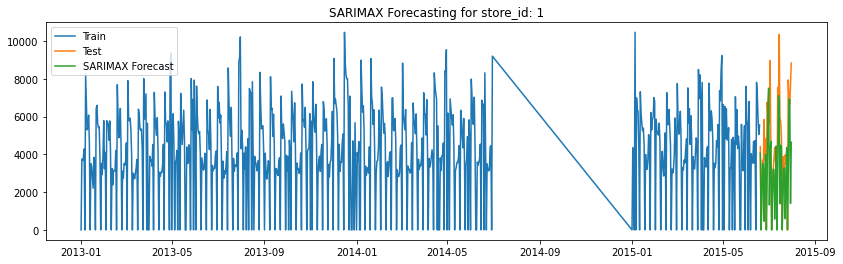

,Method,MAPE,RMSE
0,SARIMAX-Zero-Imputed-EXOG-Promo,40.34,2521.86


In [370]:
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_13['Sales'], 
                                                             dataset_series_map_store_13['Sales_zero_imputed_boxcox'], 
                                                             original_dataset_store_13['Promo'], (2, 1, 3), (2, 0, [1, 2], 7))
sarimax_store_zero_imputed_13_exog_promo = pd.DataFrame({'Method':['SARIMAX-Zero-Imputed-EXOG-Promo'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_zero_imputed_13_exog_promo

#### Use Promo2Active as exogenous variable for store-id - 13 and check the prediction quality

In [264]:
run_auto_arima(dataset_series_map_store_13['Sales_boxcox'], original_dataset_store_13['Promo2Active'].values.reshape(-1, 1))

                                       SARIMAX Results                                        
Dep. Variable:                                      y   No. Observations:                  942
Model:             SARIMAX(5, 1, 1)x(1, 0, [1, 2], 7)   Log Likelihood               -1834.176
Date:                                Thu, 12 Aug 2021   AIC                           3692.353
Time:                                        23:31:53   BIC                           3750.516
Sample:                                             0   HQIC                          3714.524
                                                - 942                                         
Covariance Type:                                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   2.436e-05      0.000      0.084      0.933      -0.001       0.001
x1 

#### 4. Run SARIMAX with exogenous Promo2Active for store-13

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


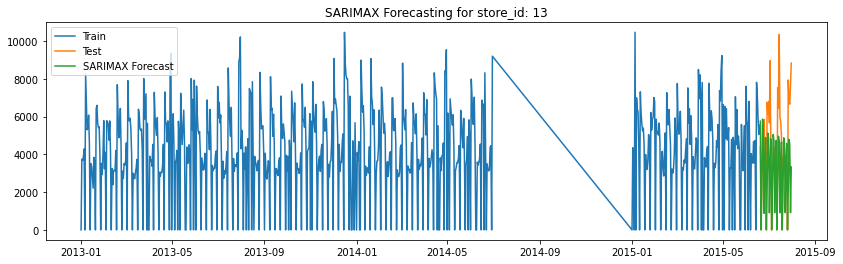

,Method,MAPE,RMSE
0,SARIMAX-EXOG,47.96,2936.74


In [265]:
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_13['Sales'], 
                                                             dataset_series_map_store_13['Sales_boxcox'], 
                                                             original_dataset_store_13['Promo2Active'], (5, 1, 1), (1, 0, [1, 2], 7))
sarimax_store_13_exog_promo2 = pd.DataFrame({'Method':['SARIMAX-EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_13_exog_promo2

#### Use Promo2Active as exogenous variable and Sales_zero_imputed series for store-id - 13 and check the prediction quality

In [375]:
run_auto_arima(dataset_series_map_store_13['Sales_zero_imputed_boxcox'], original_dataset_store_13['Promo2Active'].values.reshape(-1, 1))

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                  942
Model:             SARIMAX(3, 1, 1)x(1, 0, 1, 7)   Log Likelihood               -1840.839
Date:                           Sat, 14 Aug 2021   AIC                           3699.677
Time:                                   11:27:02   BIC                           3743.300
Sample:                                        0   HQIC                          3716.306
                                           - 942                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   9.692e-06      0.000      0.040      0.968      -0.000       0.000
x1            -0.1949      0.137     -1.419

#### 5. Run SARIMAX with exogenous Promo2Active and Sales Zero Imputes for store-13

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


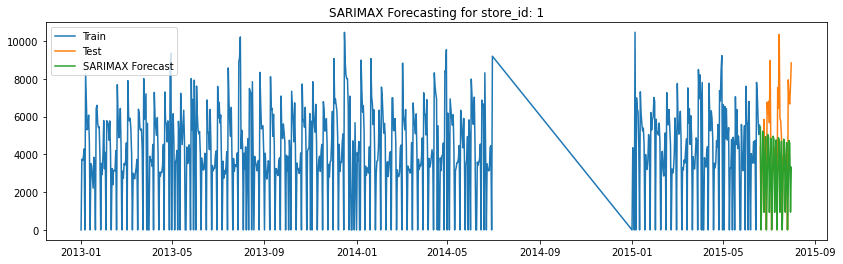

,Method,MAPE,RMSE
0,SARIMAX-EXOG-zero_imputed_exog_promo2,48.72,2909.35


In [376]:
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_13['Sales'], 
                                                             dataset_series_map_store_13['Sales_zero_imputed_boxcox'], 
                                                             original_dataset_store_13['Promo2Active'], (3, 1, 1), (1, 0, 1, 7))
sarimax_store_13_zero_imputed_exog_promo2 = pd.DataFrame({'Method':['SARIMAX-EXOG-zero_imputed_exog_promo2'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_13_zero_imputed_exog_promo2

#### Use Promo and Promo2Active as exogenous variables for store-id-13 and check the prediction quality

In [433]:
store_id=13
store13_exog_variables = pd.concat([original_dataset_store_13['Promo'], original_dataset_store_13['Promo2Active']], axis=1)
run_auto_arima(dataset_series_map_store_13['Sales_boxcox'], store13_exog_variables.values.reshape(-1, 2))

                                       SARIMAX Results                                        
Dep. Variable:                                      y   No. Observations:                  942
Model:             SARIMAX(2, 1, 3)x(2, 0, [1, 2], 7)   Log Likelihood               -1809.410
Date:                                Sun, 15 Aug 2021   AIC                           3642.820
Time:                                        02:27:42   BIC                           3700.983
Sample:                                             0   HQIC                          3664.991
                                                - 942                                         
Covariance Type:                                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.7842      0.101      7.767      0.000       0.586       0.982
x2 

#### 6. Run SARIMAX with exogenous variables Promo and Promo2Active for store-13

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


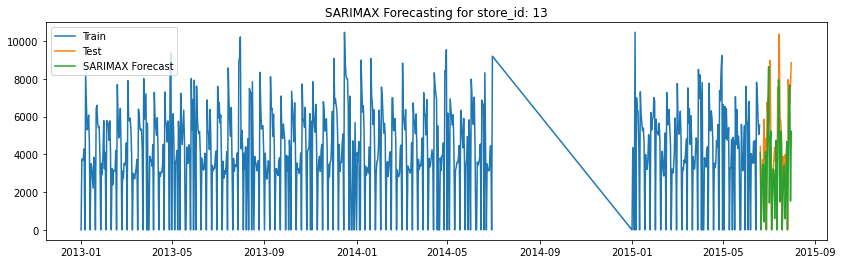

,Method,MAPE,RMSE
0,SARIMAX-With-Promo-And_promo2,42.19,2437.67


In [434]:
# run model with Promo2Active as exognous variable using previous identified p, q values
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_13['Sales'], 
                                                             dataset_series_map_store_13['Sales_boxcox'],
                                                             store13_exog_variables, (2, 1, 3), (2, 0, [1, 2], 7))
store_13_sarimax_with_promo_and_promo2 = pd.DataFrame({'Method':['SARIMAX-With-Promo-And_promo2'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
store_13_sarimax_with_promo_and_promo2

### VAR model for store-id - 13

- Since bother Sales_boxcox and Cutomers_boxcox series are stationary from ADF test not required to run cointegration check.
- For Identify p to run VAR  model with range 1-15 for both params get best fit combination.

In [266]:
# create transformed data set for store-13
transformed_data_store_13 = pd.concat([dataset_series_map_store_13['Sales_boxcox'], dataset_series_map_store_13['Customers_boxcox']], axis=1)
var_model_store_13 = VAR(transformed_data_store_13)

var_fit_store_13 = var_model_store_13.select_order(maxlags=15)
var_fit_store_13.summary()

,AIC,BIC,FPE,HQIC
0,-1.179,-1.168,0.3077,-1.175
1,-2.313,-2.282,0.09896,-2.301
2,-2.476,-2.424,0.08406,-2.456
3,-2.556,-2.483,0.07763,-2.528
4,-2.580,-2.486,0.07580,-2.544
5,-2.592,-2.478,0.07486,-2.548
6,-2.625,-2.490,0.07242,-2.574
7,-3.515,-3.358,0.02976,-3.455
8,-3.556,-3.379,0.02855,-3.489
9,-3.556,-3.358,0.02856,-3.480


####  7. Run VAR for store-id 13 using the AR lag 15 and check the prediction quality

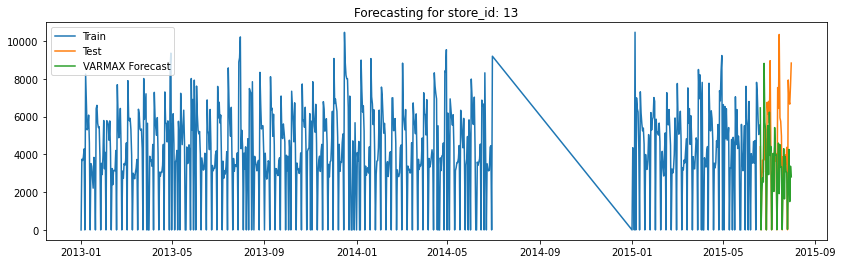

,Method,MAPE,RMSE
0,VAR_MODEL,45.86,2762.17


In [267]:
# run VAR model with earlier identified AR value
var_model_fit_store_13, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_13['Sales'], 
                                       dataset_series_map_store_13['Sales_boxcox'],
                                       dataset_series_map_store_13['Customers_boxcox'],
                                       None, 15, 0)
var_model_res_store_13_no_exog = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_model_res_store_13_no_exog

#### Plot the Impulse response function for store-13

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

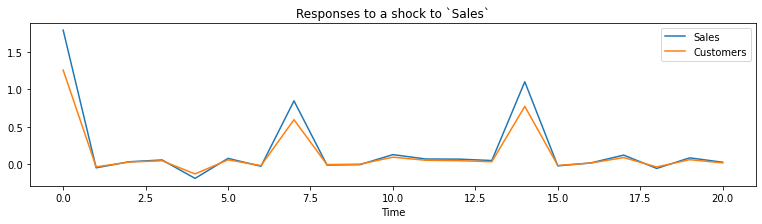

In [268]:
ax = var_model_fit_store_13.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

##### From above plot we can observe that Shock in customers flow to store impact Sales immediately and both these series are highly correlated each other.

####  8. Run VAR for store-id 13 using the AR lag 15 on Zero Imputed data

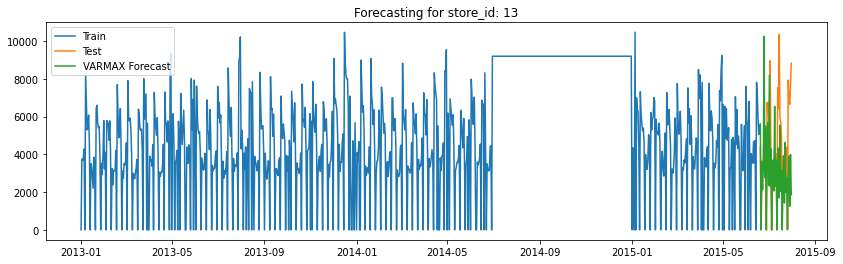

,Method,MAPE,RMSE
0,VAR_MODEL,138.13,2933.3


In [271]:
# run VAR model with earlier identified AR value
var_model_fit_store_zero_imputed_13, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_13['Sales_zero_imputed'], 
                                       dataset_series_map_store_13['Sales_zero_imputed_boxcox'],
                                       dataset_series_map_store_13['Customers_zero_imputed_boxcox'],
                                       None, 15, 0)
var_model_res_store_zero_imputed_13_no_exog = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_model_res_store_zero_imputed_13_no_exog

##### For Store Id - 13 VARMAX not performing well on zero imputed series comparetively 'slinear' imputed series

#### 9. Run VARMAX for store-id 13 using the AR lag 15 with Promo as Exogonus variable

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


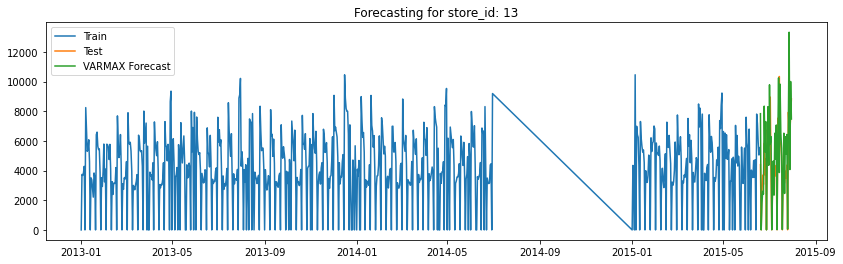

,Method,MAPE,RMSE
0,VAR_MODEL,58.06,2447.19


In [272]:
# run VAR model with earlier identified AR value
varmax_model_fit_store13_exog, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_13['Sales'], 
                                       dataset_series_map_store_13['Sales_boxcox'],
                                       dataset_series_map_store_13['Customers_boxcox'],
                                       original_dataset_store_13['Promo'], 15, 0)
var_mode_res_store_13_exog_promo = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_mode_res_store_13_exog_promo

#### Plot Impulse response function for above model for store-13

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

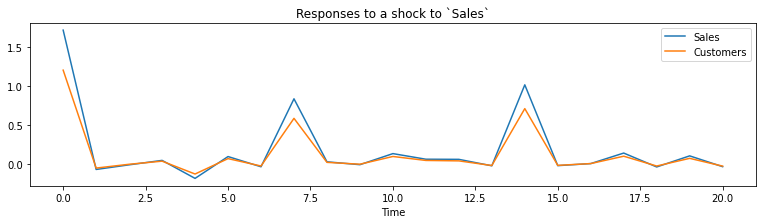

In [273]:
ax = varmax_model_fit_store13_exog.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

##### From above plot we can observe that Shock in customers flow to store impact Sales immediately and both these series are highly correlated each other.

#### 10. Run VARMAX for store-id 13 using the AR lag 15 with Promo2 as Exogonus variable

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


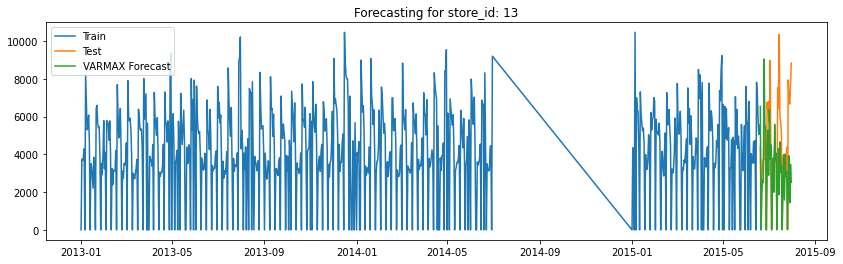

,Method,MAPE,RMSE
0,VAR_MODEL,42.26,2815.77


In [274]:
# run VAR model with earlier identified AR value
varmax_model_fit_store13_promo2, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_13['Sales'], 
                                       dataset_series_map_store_13['Sales_boxcox'],
                                       dataset_series_map_store_13['Customers_boxcox'],
                                       original_dataset_store_13['Promo2Active'], 15, 0)
var_mode_res_store_13_exog_promo2 = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_mode_res_store_13_exog_promo2

#### Plot Impulse response function for above model for store-13

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

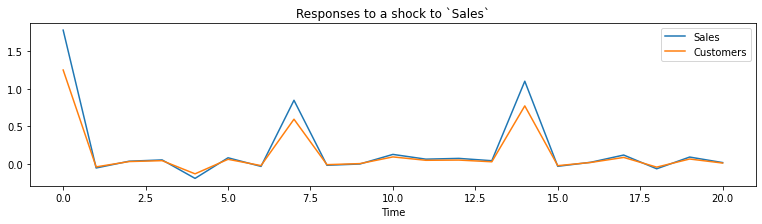

In [275]:
ax = varmax_model_fit_store13_promo2.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

##### From above plot we can observe that Shock in customers flow to store impact Sales immediately and both these series are highly correlated each other.

#### 11. Run Holt Winters' additive method with trend and seasonality for Store Id - 13

{'smoothing_level': 0.4057142857142857, 'smoothing_trend': nan, 'smoothing_seasonal': 0.16207792207792207, 'damping_trend': nan, 'initial_level': 4823.974942384245, 'initial_trend': nan, 'initial_seasons': array([-4823.97494238, -1086.97494238, -1149.97494238,  -975.97494238,
        -538.97494238, -4823.97494238,  3422.02505762]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\tsa\holtwinters\model.py:922: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning,


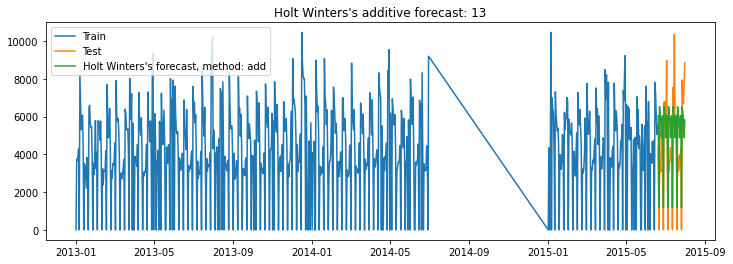

,Method,MAPE,RMSE
0,Holt Winters' additive method,1558.92,2033.68


In [278]:
mape_error, rmse_error = run_holts_winter_model(store_id, original_dataset_store_13['Sales'])
holts_winter_res_store_13 = pd.DataFrame({'Method':['Holt Winters\' additive method'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
holts_winter_res_store_13

### Time Series Analysis and Forecasting for Store-25

#### Store_Id = 25 - RUN SARIMAX with exogenous and with-out exegenous variable
- As part of this first we run auto_arima to get values for p, q, d
- Once we get these values we run model and perform forecast

In [279]:
# Run Auto-ARIMA for store Id 25
store_id = 25
dataset_series_map_store_25 = store_id_vs_calculated_data_series.get(store_id)
original_dataset_store_25 = store_id_vs_sales_data.get(store_id)
run_auto_arima(dataset_series_map_store_25['Sales_boxcox'], None)

                                       SARIMAX Results                                        
Dep. Variable:                                      y   No. Observations:                  942
Model:             SARIMAX(2, 0, 3)x(1, 0, [1, 2], 7)   Log Likelihood               -1997.399
Date:                                Fri, 13 Aug 2021   AIC                           4014.799
Time:                                        00:54:49   BIC                           4063.279
Sample:                                             0   HQIC                          4033.278
                                                - 942                                         
Covariance Type:                                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0053      0.003      1.831      0.067      -0.000       0.011
ar.

#### 1. Run Model for store-25 using above identified parameters without exogenous

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


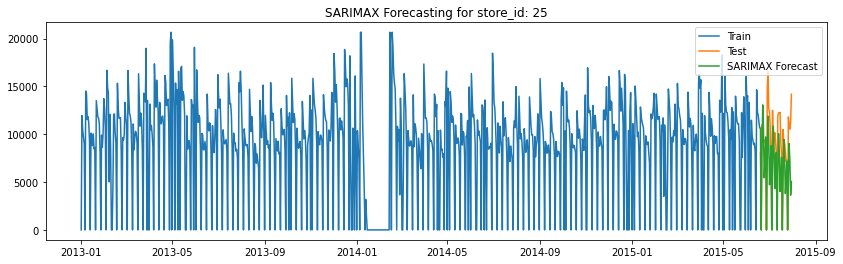

,Method,MAPE,RMSE
0,SARIMAX-No_EXOG,37.08,4024.79


In [280]:
# call function to create SARIMAX model for sales data
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_25['Sales'], 
                                                             dataset_series_map_store_25['Sales_boxcox'], 
                                                             None, (2, 0, 3), (1, 0, [1, 2], 7))
sarimax_store_25_no_exog = pd.DataFrame({'Method':['SARIMAX-No_EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_25_no_exog

#### Store-id=25 Run auto_arima with following exogenous variables
- Promo
- Promo2Active

In [281]:
run_auto_arima(dataset_series_map_store_25['Sales_boxcox'], original_dataset_store_25['Promo'].values.reshape(-1, 1))

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                  942
Model:             SARIMAX(2, 0, 1)x(2, 0, 1, 7)   Log Likelihood               -1988.084
Date:                           Fri, 13 Aug 2021   AIC                           3994.168
Time:                                   01:00:51   BIC                           4037.800
Sample:                                        0   HQIC                          4010.800
                                           - 942                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0012      0.001      1.685      0.092      -0.000       0.003
x1             0.7333      0.144      5.095

#### 2. Run SARIMAX with exogenous Promo for store-25

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


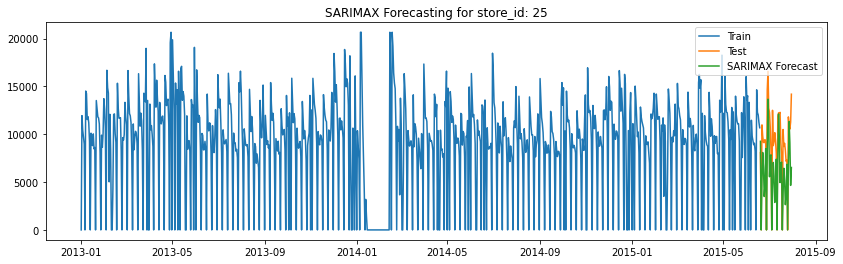

,Method,MAPE,RMSE
0,SARIMAX-EXOG,40.26,4074.6


In [282]:
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_25['Sales'], 
                                                             dataset_series_map_store_25['Sales_boxcox'], 
                                                             original_dataset_store_25['Promo'], (2, 0, 1), (2, 0, 1, 7))
sarimax_store_25_exog = pd.DataFrame({'Method':['SARIMAX-EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_25_exog

#### Use Promo2Active as exogenous variable for store-id 25 and check the prediction quality

In [283]:
run_auto_arima(dataset_series_map_store_25['Sales_boxcox'], original_dataset_store_25['Promo2Active'].values.reshape(-1, 1))

                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                  942
Model:             SARIMAX(0, 0, 2)x(2, 0, [1], 7)   Log Likelihood               -2036.192
Date:                             Fri, 13 Aug 2021   AIC                           4088.383
Time:                                     01:09:30   BIC                           4127.167
Sample:                                          0   HQIC                          4103.166
                                             - 942                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0287      0.020      1.448      0.148      -0.010       0.068
const               0    93

#### 3. Run SARIMAX with exogenous Promo2Active for store-25

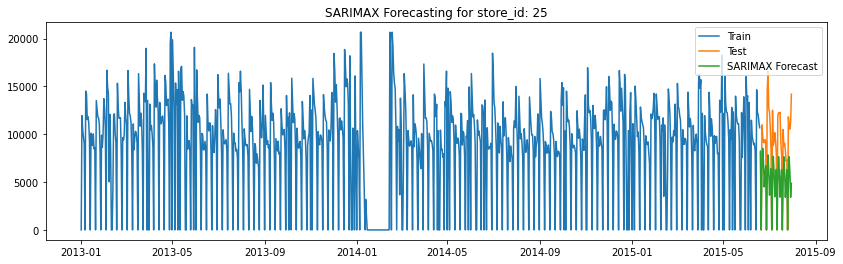

,Method,MAPE,RMSE
0,SARIMAX-EXOG,47.73,4950.2


In [285]:
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_25['Sales'], 
                                                             dataset_series_map_store_25['Sales_boxcox'], 
                                                             original_dataset_store_25['Promo2Active'], (0, 0, 2), (2, 0, [1], 7))
sarimax_store_25_exog_promo2 = pd.DataFrame({'Method':['SARIMAX-EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_25_exog_promo2

#### Use Promo and Promo2Active as exogenous variables for store-id-25 and check the prediction quality

In [435]:
store_id=25
store25_exog_variables = pd.concat([original_dataset_store_25['Promo'], original_dataset_store_25['Promo2Active']], axis=1)
run_auto_arima(dataset_series_map_store_25['Sales_boxcox'], store25_exog_variables.values.reshape(-1, 2))

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                  942
Model:             SARIMAX(2, 0, 1)x(2, 0, 1, 7)   Log Likelihood               -1988.465
Date:                           Sun, 15 Aug 2021   AIC                           3996.931
Time:                                   02:32:10   BIC                           4045.411
Sample:                                        0   HQIC                          4015.410
                                           - 942                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0013      0.001      1.650      0.099      -0.000       0.003
x1             0.7378      0.147      5.021

#### 4. Run SARIMAX with exogenous variables Promo and Promo2Active for store-25

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


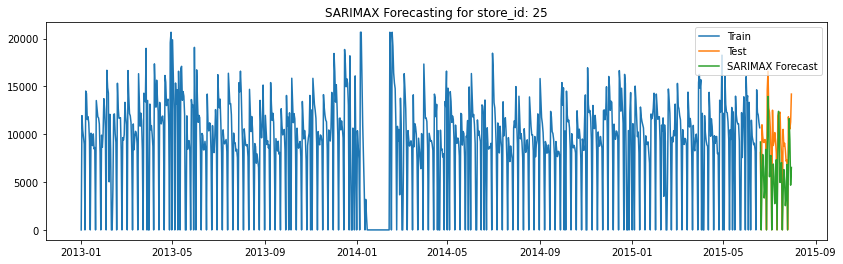

,Method,MAPE,RMSE
0,SARIMAX-With-Promo-And_promo2,43.26,4129.51


In [436]:
# run model with Promo2Active as exognous variable using previous identified p, q values
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_25['Sales'], 
                                                             dataset_series_map_store_25['Sales_boxcox'],
                                                             store25_exog_variables, (2, 0, 1), (2, 0, 1, 7))
store_25_sarimax_with_promo_and_promo2 = pd.DataFrame({'Method':['SARIMAX-With-Promo-And_promo2'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
store_25_sarimax_with_promo_and_promo2

### VAR model for store-id - 25

- Since bother Sales_boxcox and Cutomers_boxcox series are stationary from ADF test not required to run cointegration check.
- For Identify p to run VAR  model with range 1-15 for both params get best fit combination.

In [286]:
# create transformed data set for store-25
transformed_data_store_25 = pd.concat([dataset_series_map_store_25['Sales_boxcox'], dataset_series_map_store_25['Customers_boxcox']], axis=1)
var_model_store_25 = VAR(transformed_data_store_25)

var_fit_store_25 = var_model_store_25.select_order(maxlags=15)
var_fit_store_25.summary()

,AIC,BIC,FPE,HQIC
0,-1.408,-1.398,0.2446,-1.404
1,-1.725,-1.694,0.1782,-1.713
2,-1.753,-1.701,0.1733,-1.733
3,-1.817,-1.744,0.1626,-1.789
4,-1.813,-1.719,0.1632,-1.777
5,-1.815,-1.700,0.1628,-1.771
6,-1.997,-1.861,0.1358,-1.945
7,-2.743,-2.587,0.06436,-2.684
8,-2.801,-2.624,0.06076,-2.733
9,-2.805,-2.607,0.06051,-2.729


####  5. Run VAR for store-id 25 using the AR lag 15 and check the prediction quality

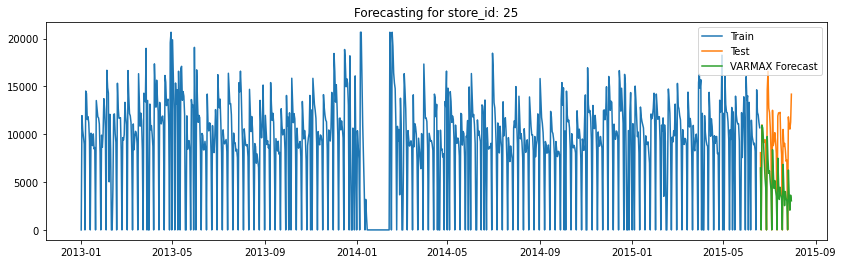

,Method,MAPE,RMSE
0,VAR_MODEL,49.75,5184.97


In [287]:
# run VAR model with earlier identified AR value
var_model_fit_store_25, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_25['Sales'], 
                                       dataset_series_map_store_25['Sales_boxcox'],
                                       dataset_series_map_store_25['Customers_boxcox'],
                                       None, 15, 0)
var_mode_res_store_25_no_exog = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_mode_res_store_25_no_exog

#### Plot the Impulse response function for store-25

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

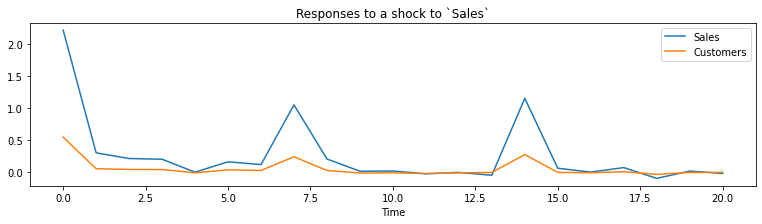

In [288]:
ax = var_model_fit_store_25.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

##### From above plot we can observe that Shock in customers flow to store impact Sales immediately and both these series are highly correlated each other.

#### 6. Run VARMAX for store-id 25 using the AR lag 15 with Promo as Exogonus variable

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


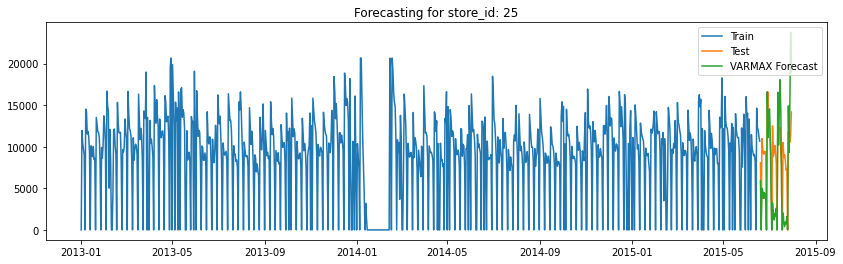

,Method,MAPE,RMSE
0,VAR_MODEL,54.4,5396.45


In [289]:
# run VAR model with earlier identified AR value
varmax_model_fit_store_25_with_promo, mape_error, rmse_error = run_var_model(store_id,
                                                                             original_dataset_store_25['Sales'], 
                                                                             dataset_series_map_store_25['Sales_boxcox'],
                                                                             dataset_series_map_store_25['Customers_boxcox'],
                                                                             original_dataset_store_25['Promo'], 15, 0)
var_mode_res_store_25_exog_promo = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_mode_res_store_25_exog_promo

#### Plot Impulse response function for above model for store-25

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

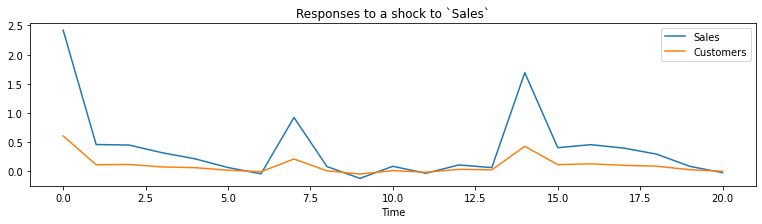

In [291]:
ax = varmax_model_fit_store_25_with_promo.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

##### From above plot we can observe that Shock in customers flow to store impact Sales immediately and both these series are highly correlated each other.

#### 7. Run VARMAX for store-id 25 using the AR lag 15 with Promo2 as Exogonus variable

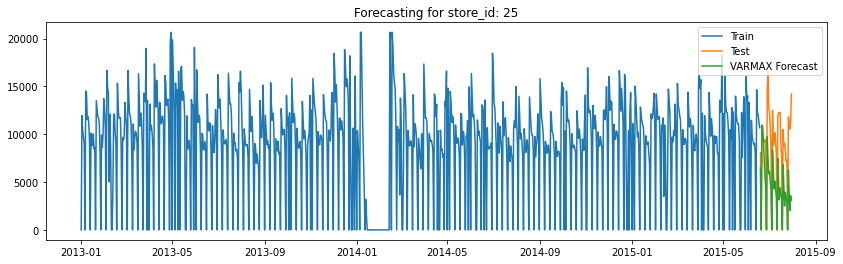

,Method,MAPE,RMSE
0,VAR_MODEL,48.95,5188.91


In [292]:
# run VAR model with earlier identified AR value
varmax_model_fit_store25_promo2, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_25['Sales'], 
                                       dataset_series_map_store_25['Sales_boxcox'],
                                       dataset_series_map_store_25['Customers_boxcox'],
                                       original_dataset_store_25['Promo2Active'], 15, 0)
var_model_res_store_25_exog_promo2 = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_model_res_store_25_exog_promo2

#### 8. Run Holt Winters' additive method with trend and seasonality for Store Id - 25

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\tsa\holtwinters\model.py:922: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning,


{'smoothing_level': 0.19357142857142856, 'smoothing_trend': nan, 'smoothing_seasonal': 0.10610902255639099, 'damping_trend': nan, 'initial_level': 11139.151162790698, 'initial_trend': nan, 'initial_seasons': array([-11139.15116279,    804.84883721,   -730.15116279,  -1410.15116279,
        -2152.15116279, -11139.15116279,   3373.84883721]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


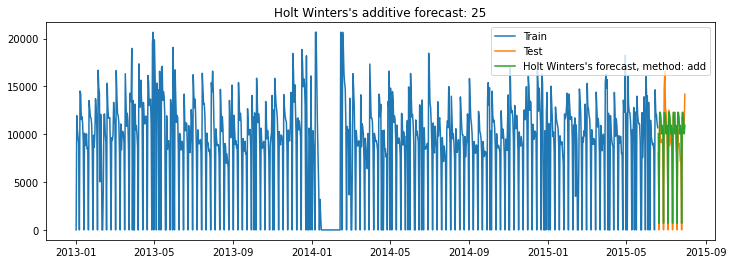

,Method,MAPE,RMSE
0,Holt Winters' additive method,1095.43,1956.78


In [295]:
mape_error, rmse_error = run_holts_winter_model(store_id, original_dataset_store_25['Sales'])
holts_winter_res_store_25 = pd.DataFrame({'Method':['Holt Winters\' additive method'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
holts_winter_res_store_25

### Time Series Analysis and Forecasting for Store-29

#### Store_Id = 29 - RUN SARIMAX with exogenous and with-out exegenous variable
- As part of this first we run auto_arima to get values for p, q, d
- Once we get these values we run model and perform forecast

In [296]:
# Run Auto-ARIMA for store Id 29
store_id = 29
dataset_series_map_store_29 = store_id_vs_calculated_data_series.get(store_id)
original_dataset_store_29 = store_id_vs_sales_data.get(store_id)
run_auto_arima(dataset_series_map_store_29['Sales_boxcox'], None)

                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                  942
Model:             SARIMAX(1, 0, 0)x(1, 0, [1], 7)   Log Likelihood               -1780.040
Date:                             Fri, 13 Aug 2021   AIC                           3570.080
Time:                                     10:23:50   BIC                           3594.320
Sample:                                          0   HQIC                          3579.319
                                             - 942                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0142      0.010      1.483      0.138      -0.005       0.033
ar.L1         -0.0033      

#### 1. Run Model for store-29 using above identified parameters without exogenous

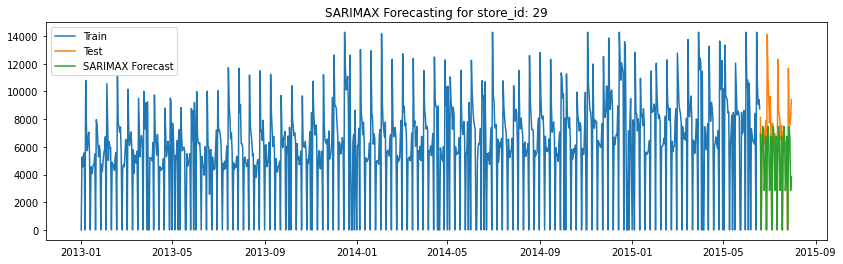

,Method,MAPE,RMSE
0,SARIMAX-No_EXOG,37.66,3117.2


In [297]:
# call function to create SARIMAX model for sales data
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_29['Sales'], 
                                                             dataset_series_map_store_29['Sales_boxcox'], 
                                                             None, (1, 0, 0), (1, 0, 1, 7))
sarimax_store_29_no_exog = pd.DataFrame({'Method':['SARIMAX-No_EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_29_no_exog

#### Store-id=29 Run auto_arima with following exogenous variables
- Promo
- Promo2Active

In [298]:
run_auto_arima(dataset_series_map_store_29['Sales_boxcox'], original_dataset_store_29['Promo'].values.reshape(-1, 1))

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                  942
Model:             SARIMAX(3, 0, 2)x(1, 0, 2, 7)   Log Likelihood               -1770.792
Date:                           Fri, 13 Aug 2021   AIC                           3563.584
Time:                                   10:55:24   BIC                           3616.912
Sample:                                        0   HQIC                          3583.911
                                           - 942                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.1073      0.048      2.214      0.027       0.012       0.202
x1             0.6260      0.131      4.779

#### 2. Run SARIMAX with exogenous Promo for store-29

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


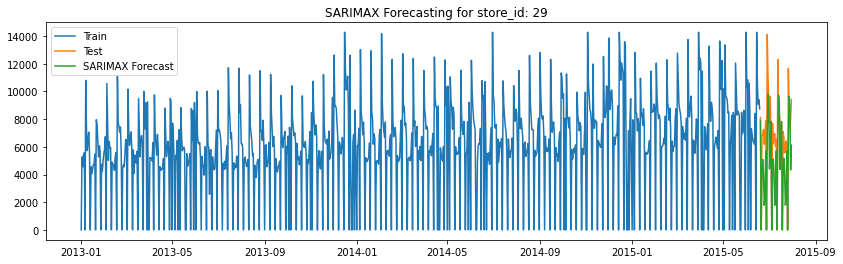

,Method,MAPE,RMSE
0,SARIMAX-EXOG,39.98,2867.7


In [299]:
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_29['Sales'], 
                                                             dataset_series_map_store_29['Sales_boxcox'], 
                                                             original_dataset_store_29['Promo'], (3, 0, 2), (1, 0, 2, 7))
sarimax_store_29_exog = pd.DataFrame({'Method':['SARIMAX-EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_29_exog

#### Use Promo2Active as exogenous variable for store-id 29 and check the prediction quality

In [300]:
run_auto_arima(dataset_series_map_store_29['Sales_boxcox'], original_dataset_store_29['Promo2Active'].values.reshape(-1, 1))

                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                  942
Model:             SARIMAX(1, 0, 0)x(1, 0, [1], 7)   Log Likelihood               -1778.993
Date:                             Fri, 13 Aug 2021   AIC                           3569.986
Time:                                     11:07:07   BIC                           3599.074
Sample:                                          0   HQIC                          3581.073
                                             - 942                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0188      0.013      1.401      0.161      -0.007       0.045
const               0    93

#### 3. Run SARIMAX with exogenous Promo2Active for store-29

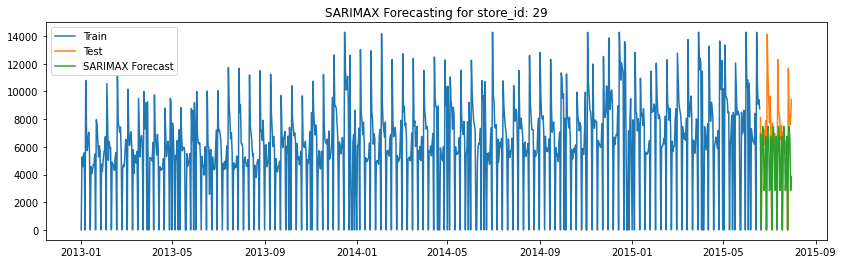

,Method,MAPE,RMSE
0,SARIMAX-EXOG,38.86,3118.5


In [302]:
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_29['Sales'], 
                                                             dataset_series_map_store_29['Sales_boxcox'], 
                                                             original_dataset_store_29['Promo2Active'], (1, 0, 0), (1, 0, 1, 7))
sarimax_store_29_exog_promo2 = pd.DataFrame({'Method':['SARIMAX-EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_29_exog_promo2

#### Use Promo and Promo2Active as exogenous variables for store-id-29 and check the prediction quality

In [437]:
store29_exog_variables = pd.concat([original_dataset_store_29['Promo'], original_dataset_store_29['Promo2Active']], axis=1)
run_auto_arima(dataset_series_map_store_29['Sales_boxcox'], store29_exog_variables.values.reshape(-1, 2))

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                  942
Model:             SARIMAX(3, 0, 2)x(1, 0, 2, 7)   Log Likelihood               -1770.787
Date:                           Sun, 15 Aug 2021   AIC                           3565.575
Time:                                   02:37:14   BIC                           3623.751
Sample:                                        0   HQIC                          3587.750
                                           - 942                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.1072      0.048      2.212      0.027       0.012       0.202
x1             0.6259      0.131      4.776

#### 4. Run SARIMAX with exogenous variables Promo and Promo2Active for store-29

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


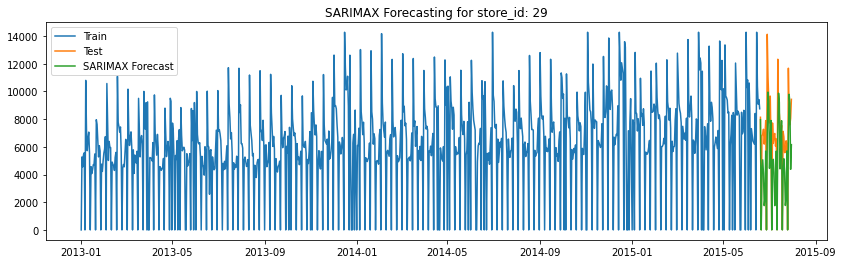

,Method,MAPE,RMSE
0,SARIMAX-With-Promo-And_promo2,42.28,2884.62


In [438]:
# run model with Promo2Active as exognous variable using previous identified p, q values
store_id=29
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_29['Sales'], 
                                                             dataset_series_map_store_29['Sales_boxcox'],
                                                             store29_exog_variables, (3, 0, 2), (1, 0, 2, 7))
store_29_sarimax_with_promo_and_promo2 = pd.DataFrame({'Method':['SARIMAX-With-Promo-And_promo2'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
store_29_sarimax_with_promo_and_promo2

### VAR model for store-id - 29

- Since bother Sales_boxcox and Cutomers_boxcox series are stationary from ADF test not required to run cointegration check.
- For Identify p to run VAR  model with range 1-15 for both params get best fit combination.

In [303]:
# create transformed data set for store-29
transformed_data_store_29 = pd.concat([dataset_series_map_store_29['Sales_boxcox'], dataset_series_map_store_29['Customers_boxcox']], axis=1)
var_model_store_29 = VAR(transformed_data_store_29)

var_fit_store_29 = var_model_store_29.select_order(maxlags=15)
var_fit_store_29.summary()

,AIC,BIC,FPE,HQIC
0,-1.679,-1.669,0.1865,-1.675
1,-2.163,-2.132,0.1150,-2.151
2,-2.275,-2.222,0.1028,-2.255
3,-2.344,-2.271,0.09591,-2.316
4,-2.369,-2.275,0.09355,-2.333
5,-2.432,-2.317,0.08787,-2.388
6,-2.734,-2.598,0.06498,-2.682
7,-3.355,-3.199,0.03491,-3.295
8,-3.382,-3.205,0.03396,-3.315
9,-3.389,-3.191,0.03373,-3.314


####  5. Run VAR for store-id 29 using the AR lag 15 and check the prediction quality

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


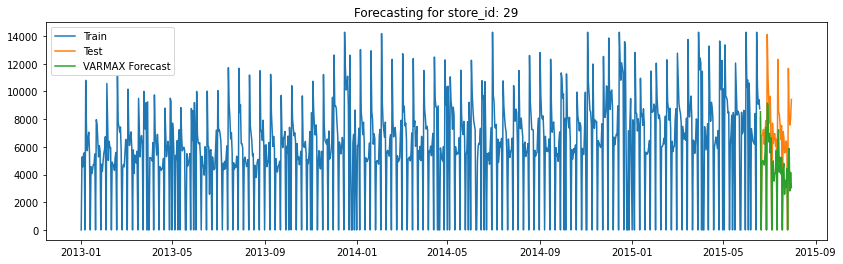

,Method,MAPE,RMSE
0,VAR_MODEL,36.79,2865.84


In [304]:
# run VAR model with earlier identified AR value
var_model_fit_store_29_no_exog, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_29['Sales'], 
                                       dataset_series_map_store_29['Sales_boxcox'],
                                       dataset_series_map_store_29['Customers_boxcox'],
                                       None, 15, 0)
var_model_res_store_29_no_exog = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_model_res_store_29_no_exog

#### Plot the Impulse response function for store-29

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

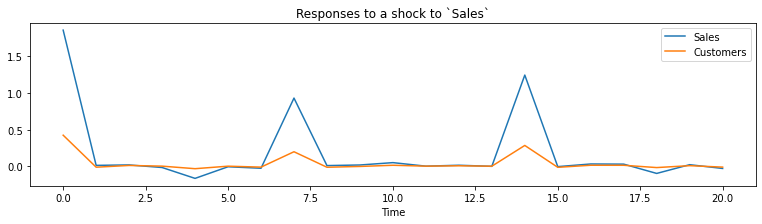

In [305]:
ax = var_model_fit_store_29_no_exog.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

##### From above plot we can observe that Shock in customers flow to store impact Sales immediately and both these series are highly correlated each other.

#### 6. Run VARMAX for store-id 29 using the AR lag 15 with Promo as Exogonus variable

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


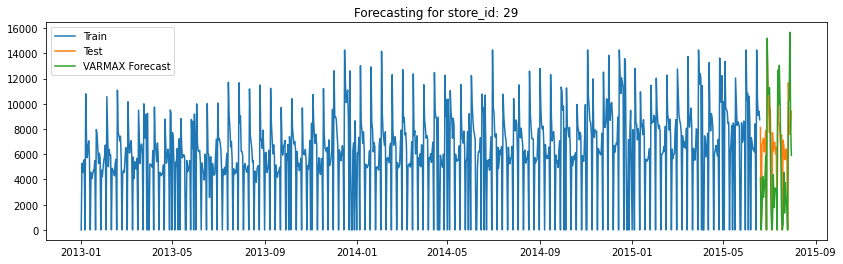

,Method,MAPE,RMSE
0,VAR_MODEL,46.97,3483.89


In [306]:
# run VAR model with earlier identified AR value
varmax_model_fit_store_29_with_exog_promo, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_29['Sales'], 
                                       dataset_series_map_store_29['Sales_boxcox'],
                                       dataset_series_map_store_29['Customers_boxcox'],
                                       original_dataset_store_29['Promo'], 15, 0)
var_model_res_store_29_exog_promo = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_model_res_store_29_exog_promo

#### Plot Impulse response function for above model for store-29

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

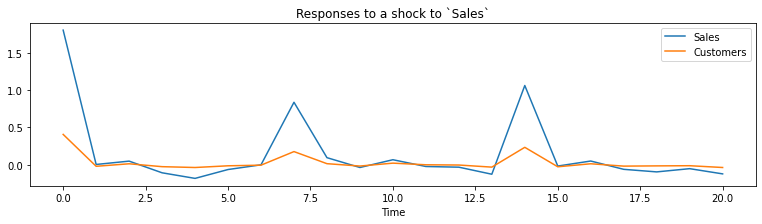

In [307]:
ax = varmax_model_fit_store_29_with_exog_promo.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

##### Based on bove plot we can observe that customer visit to store and Sales are highly correlated. In some cases from lag 2 to 4 though customer visiting store not reduced much though we can see dip sales to negative and start increasing sales again (this could be due to holiday period once holiday period over sales increasing again).

#### 7. Run VARMAX for store-id 29 using the AR lag 15 with Promo2 as Exogonus variable

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


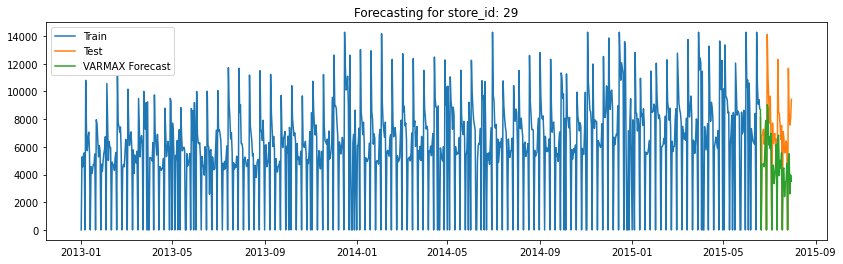

,Method,MAPE,RMSE
0,VAR_MODEL,38.29,2879.81


In [308]:
# run VAR model with earlier identified AR value
varmax_model_fit_store_29_promo2, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_29['Sales'], 
                                       dataset_series_map_store_29['Sales_boxcox'],
                                       dataset_series_map_store_29['Customers_boxcox'],
                                       original_dataset_store_29['Promo2Active'], 15, 0)
var_model_res_store_29_exog_promo2 = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_model_res_store_29_exog_promo2

#### Plot Impulse response function for above model for store-29

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

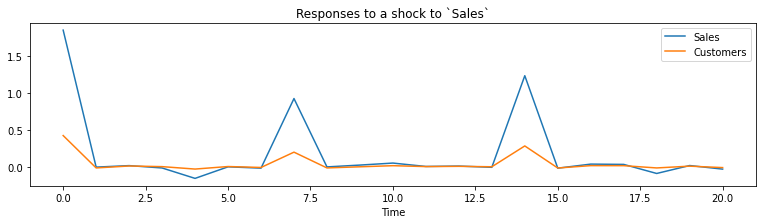

In [310]:
ax = varmax_model_fit_store_29_promo2.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

##### Based on bove plot we can observe that customer visit to store and Sales are highly correlated. In some cases from lag 2 to 4 though customer visiting store not reduced much though we can see dip sales to negative and start increasing sales again (this could be due to holiday period once holiday period over sales increasing again).

#### 8. Run Holt Winters' additive method with trend and seasonality for Store Id - 29

{'smoothing_level': 0.005, 'smoothing_trend': nan, 'smoothing_seasonal': 0.09476190476190476, 'damping_trend': nan, 'initial_level': 7198.457364341085, 'initial_trend': nan, 'initial_seasons': array([-7198.45736434, -1929.45736434, -2644.45736434, -1787.45736434,
       -1634.45736434, -7198.45736434,  3597.54263566]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\tsa\holtwinters\model.py:922: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning,


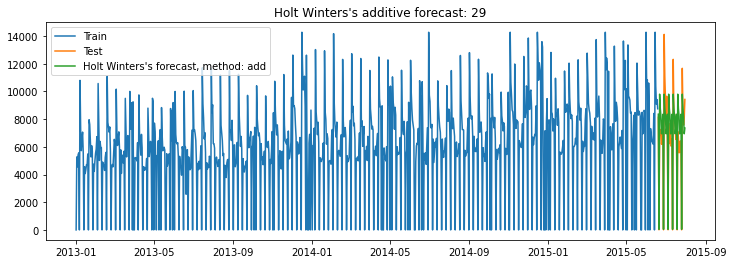

,Method,MAPE,RMSE
0,Holt Winters' additive method,78.5,1630.13


In [309]:
mape_error, rmse_error = run_holts_winter_model(store_id, original_dataset_store_29['Sales'])
holts_winter_res_store_29 = pd.DataFrame({'Method':['Holt Winters\' additive method'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
holts_winter_res_store_29

### Time Series Analysis and Forecasting for Store-31

#### Store_Id = 31 - RUN SARIMAX with exogenous and with-out exegenous variable
- As part of this first we run auto_arima to get values for p, q, d
- Once we get these values we run model and perform forecast

In [311]:
# Run Auto-ARIMA for store Id 31
store_id = 31
dataset_series_map_store_31 = store_id_vs_calculated_data_series.get(store_id)
original_dataset_store_31 = store_id_vs_sales_data.get(store_id)
run_auto_arima(dataset_series_map_store_31['Sales_boxcox'], None)

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                  942
Model:             SARIMAX(4, 0, 0)x(1, 0, 0, 7)   Log Likelihood                -818.697
Date:                           Fri, 13 Aug 2021   AIC                           1651.395
Time:                                   12:42:31   BIC                           1685.331
Sample:                                        0   HQIC                          1664.330
                                           - 942                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.2788      0.184      6.932      0.000       0.917       1.640
ar.L1          0.1062      0.022      4.868

#### 1. Run Model for store-31 using above identified parameters without exogenous

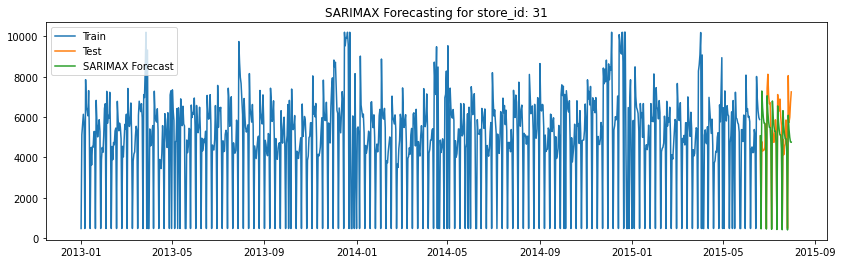

,Method,MAPE,RMSE
0,SARIMAX-No_EXOG,18.48,1183.73


In [312]:
# call function to create SARIMAX model for sales data
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_31['Sales'], 
                                                             dataset_series_map_store_31['Sales_boxcox'], 
                                                             None, (4, 0, 0), (1, 0, 0, 7))
sarimax_store_31_no_exog = pd.DataFrame({'Method':['SARIMAX-No_EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_31_no_exog

#### Store-id=31 Run auto_arima with following exogenous variables
- Promo
- Promo2Active

In [313]:
run_auto_arima(dataset_series_map_store_31['Sales_boxcox'], original_dataset_store_31['Promo'].values.reshape(-1, 1))

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                  942
Model:             SARIMAX(2, 0, 1)x(1, 0, 1, 7)   Log Likelihood                -510.956
Date:                           Fri, 13 Aug 2021   AIC                           1037.912
Time:                                   13:09:23   BIC                           1076.696
Sample:                                        0   HQIC                          1052.695
                                           - 942                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0053      0.010      0.542      0.588      -0.014       0.024
x1             0.3535      0.028     12.788

#### 2. Run SARIMAX with exogenous Promo for store-31

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


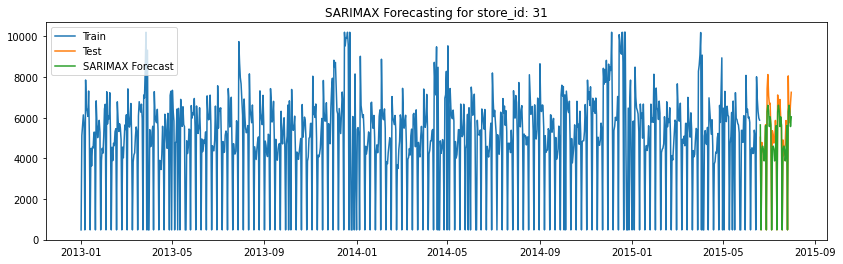

,Method,MAPE,RMSE
0,SARIMAX-EXOG,9.63,770.51


In [314]:
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_31['Sales'], 
                                                             dataset_series_map_store_31['Sales_boxcox'], 
                                                             original_dataset_store_31['Promo'], (2, 0, 1), (1, 0, 1, 7))
sarimax_store_31_exog = pd.DataFrame({'Method':['SARIMAX-EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_31_exog

#### Use Promo2Active as exogenous variable for store-id 31 and check the prediction quality

In [315]:
run_auto_arima(dataset_series_map_store_31['Sales_boxcox'], original_dataset_store_31['Promo2Active'].values.reshape(-1, 1))

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                  942
Model:             SARIMAX(4, 0, 0)x(1, 0, 0, 7)   Log Likelihood                -818.817
Date:                           Fri, 13 Aug 2021   AIC                           1653.635
Time:                                   13:12:27   BIC                           1692.419
Sample:                                        0   HQIC                          1668.418
                                           - 942                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.2199      0.182      6.691      0.000       0.863       1.577
const               0   6.55e+04          0

#### 3. Run SARIMAX with exogenous Promo2Active for store-31

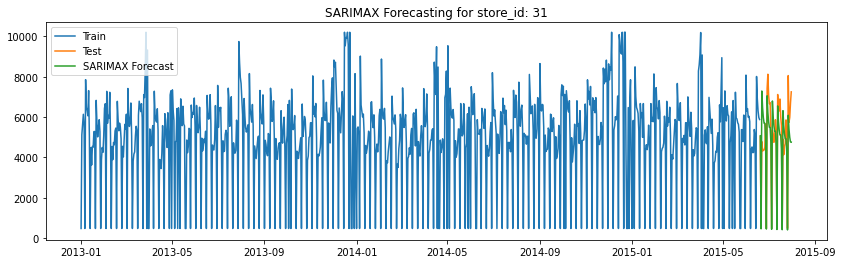

,Method,MAPE,RMSE
0,SARIMAX-EXOG,18.53,1184.08


In [316]:
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_31['Sales'], 
                                                             dataset_series_map_store_31['Sales_boxcox'], 
                                                             original_dataset_store_31['Promo2Active'], (4, 0, 0), (1, 0, 0, 7))
sarimax_store_31_exog_promo2 = pd.DataFrame({'Method':['SARIMAX-EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_31_exog_promo2

#### Use Promo and Promo2Active as exogenous variables for store-id-31 and check the prediction quality

In [439]:
store31_exog_variables = pd.concat([original_dataset_store_31['Promo'], original_dataset_store_31['Promo2Active']], axis=1)
run_auto_arima(dataset_series_map_store_31['Sales_boxcox'], store31_exog_variables.values.reshape(-1, 2))

                                       SARIMAX Results                                        
Dep. Variable:                                      y   No. Observations:                  942
Model:             SARIMAX(1, 0, 0)x(1, 0, [1, 2], 7)   Log Likelihood                -526.548
Date:                                Sun, 15 Aug 2021   AIC                           1069.096
Time:                                        02:40:58   BIC                           1107.880
Sample:                                             0   HQIC                          1083.879
                                                - 942                                         
Covariance Type:                                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0620      0.031      2.030      0.042       0.002       0.122
x1 

#### 4. Run SARIMAX with exogenous variables Promo and Promo2Active for store-31

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


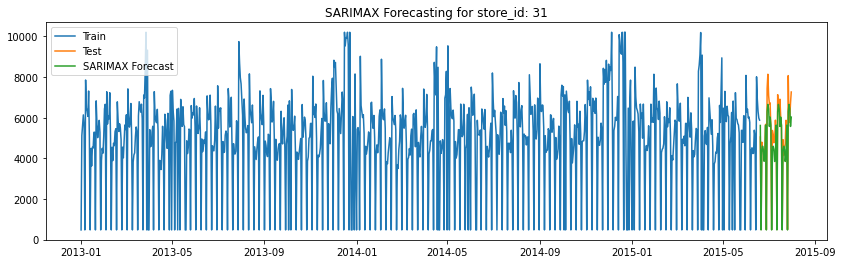

,Method,MAPE,RMSE
0,SARIMAX-With-Promo-And_promo2,10.37,790.9


In [440]:
# run model with Promo2Active as exognous variable using previous identified p, q values
store_id=31
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_31['Sales'], 
                                                             dataset_series_map_store_31['Sales_boxcox'],
                                                             store31_exog_variables, (1, 0, 0), (1, 0, [1, 2], 7))
store_31_sarimax_with_promo_and_promo2 = pd.DataFrame({'Method':['SARIMAX-With-Promo-And_promo2'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
store_31_sarimax_with_promo_and_promo2

### VAR model for store-id - 31

- Since bother Sales_boxcox and Cutomers_boxcox series are stationary from ADF test not required to run cointegration check.
- For Identify p to run VAR  model with range 1-15 for both params get best fit combination.

In [317]:
# create transformed data set for store-3
transformed_data_store_31 = pd.concat([dataset_series_map_store_31['Sales_boxcox'], dataset_series_map_store_31['Customers_boxcox']], axis=1)
var_model_store_31 = VAR(transformed_data_store_31)

var_fit_store_31 = var_model_store_31.select_order(maxlags=15)
var_fit_store_31.summary()

,AIC,BIC,FPE,HQIC
0,-5.535,-5.524,0.003948,-5.531
1,-5.731,-5.700,0.003244,-5.719
2,-5.975,-5.923,0.002542,-5.955
3,-6.067,-5.994,0.002317,-6.040
4,-6.111,-6.017,0.002219,-6.075
5,-6.239,-6.124,0.001952,-6.195
6,-6.434,-6.299,0.001606,-6.383
7,-7.100,-6.944,0.0008248,-7.041
8,-7.177,-7.000,0.0007640,-7.109
9,-7.185,-6.986,0.0007582,-7.109


####  5. Run VAR for store-id 31 using the AR lag 14 and check the prediction quality

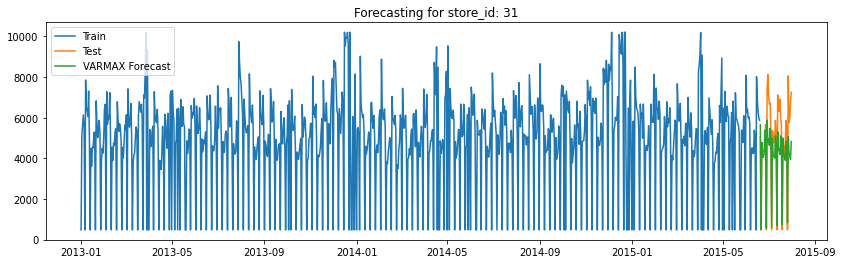

,Method,MAPE,RMSE
0,VAR_MODEL,21.03,1369.67


In [321]:
# run VAR model with earlier identified AR value
model_fit_store_31_no_exog, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_31['Sales'], 
                                       dataset_series_map_store_31['Sales_boxcox'],
                                       dataset_series_map_store_31['Customers_boxcox'],
                                       None, 15, 0)
var_model_res_store_31_no_exog = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_model_res_store_31_no_exog

#### Plot the Impulse response function for store-31

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

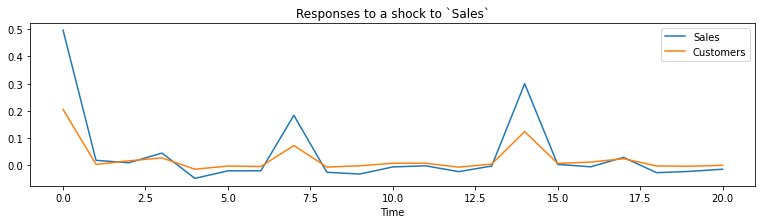

In [322]:
ax = model_fit_store_31_no_exog.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

##### From above plot we can observe that Shock customers visiting to store is almost impact immediately Sales of store-31

#### 6. Run VARMAX for store-id 31 using the AR lag 15 with Promo as Exogonus variable

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


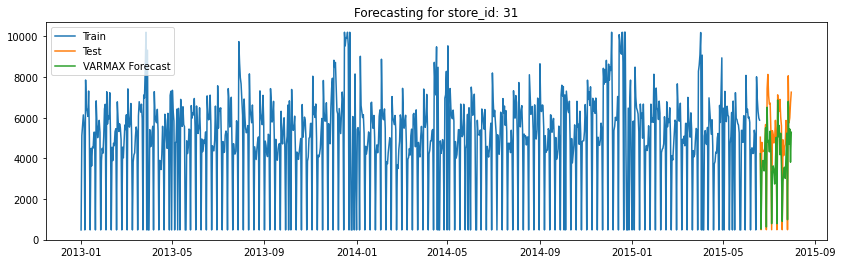

,Method,MAPE,RMSE
0,VAR_MODEL,27.69,1461.39


In [326]:
# run VAR model with earlier identified AR value
varmax_model_fit_store_31_exog_promo, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_31['Sales'], 
                                       dataset_series_map_store_31['Sales_boxcox'],
                                       dataset_series_map_store_31['Customers_boxcox'],
                                       original_dataset_store_31['Promo'], 15, 0)
var_mode_res_store_31_exog_promo = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_mode_res_store_31_exog_promo

#### Plot Impulse response function for above model for store-31

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

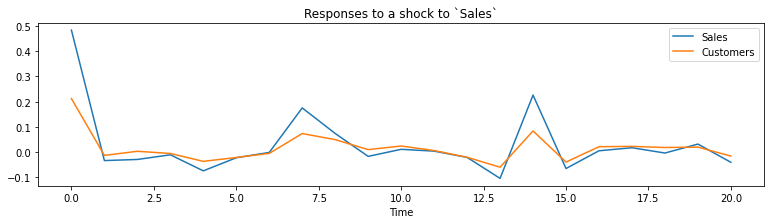

In [327]:
ax = varmax_model_fit_store_31_exog_promo.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

##### Based on bove plot we can observe that customer visit to store and Sales are highly correlated. In some cases from lag 3 to 4 though customer visiting store not reduced much we can see dip in sales to '-ve' it could be holiday on particular day.

#### 7. Run VARMAX for store-id 31 using the AR lag 15 with Promo2 as Exogonus variable

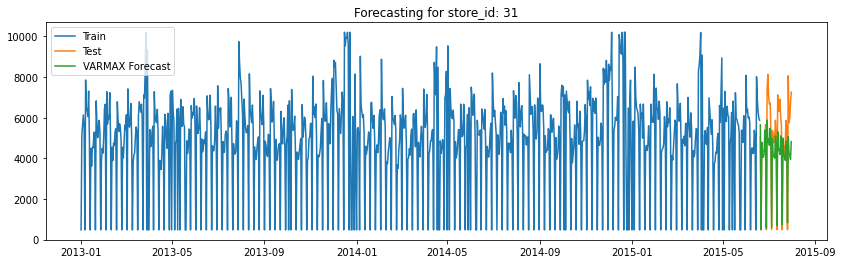

,Method,MAPE,RMSE
0,VAR_MODEL,20.93,1372.32


In [328]:
# run VAR model with earlier identified AR value
varmax_model_fit_store31_promo2, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_31['Sales'], 
                                       dataset_series_map_store_31['Sales_boxcox'],
                                       dataset_series_map_store_31['Customers_boxcox'],
                                       original_dataset_store_31['Promo2Active'], 15, 0)
var_mode_res_store_31_exog_promo2 = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_mode_res_store_31_exog_promo2

#### Plot Impulse response function for above model for store-31

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

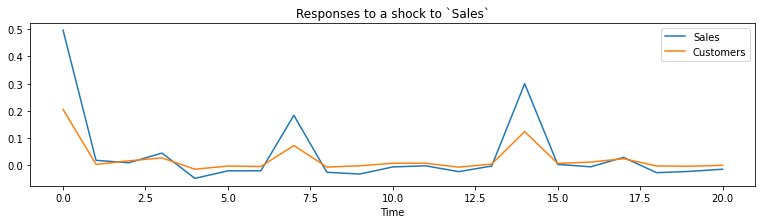

In [329]:
ax = varmax_model_fit_store31_promo2.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

#### 8. Run Holt Winters' additive method with trend and seasonality for Store Id - 31

{'smoothing_level': 0.02857142857142857, 'smoothing_trend': nan, 'smoothing_seasonal': 0.11564625850340135, 'damping_trend': nan, 'initial_level': 5629.885658914729, 'initial_trend': nan, 'initial_seasons': array([-5151.13565891,  -507.88565891,    -6.88565891,   510.11434109,
         -22.88565891, -5151.13565891,  2227.11434109]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\tsa\holtwinters\model.py:922: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning,


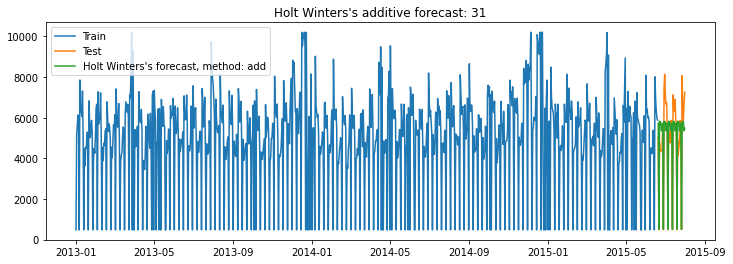

,Method,MAPE,RMSE
0,Holt Winters' additive method,14.64,1021.56


In [330]:
mape_error, rmse_error = run_holts_winter_model(store_id, original_dataset_store_31['Sales'])
holts_winter_res_store_31 = pd.DataFrame({'Method':['Holt Winters\' additive method'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
holts_winter_res_store_31

### Time Series Analysis and Forecasting for Store-46

#### Store_Id = 46 - RUN SARIMAX with exogenous and with-out exegenous variable
- As part of this first we run auto_arima to get values for p, q, d
- Once we get these values we run model and perform forecast

In [331]:
# Run Auto-ARIMA for store Id 46
store_id = 46
dataset_series_map_store_46 = store_id_vs_calculated_data_series.get(store_id)
original_dataset_store_46 = store_id_vs_sales_data.get(store_id)
run_auto_arima(dataset_series_map_store_46['Sales_boxcox'], None)

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                  942
Model:             SARIMAX(0, 1, 1)x(1, 0, 1, 7)   Log Likelihood               -1837.949
Date:                           Fri, 13 Aug 2021   AIC                           3683.898
Time:                                   14:55:25   BIC                           3703.286
Sample:                                        0   HQIC                          3691.288
                                           - 942                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9685      0.009   -111.259      0.000      -0.986      -0.951
ar.S.L7        0.9886      0.005    196.449

#### 1. Run Model for store-46 using above identified parameters without exogenous

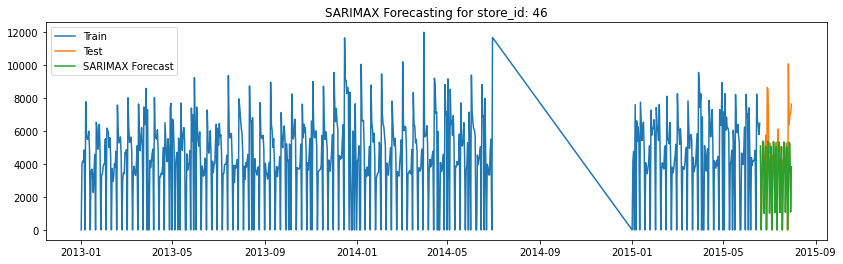

,Method,MAPE,RMSE
0,SARIMAX-No_EXOG,44.15,2539.2


In [332]:
# call function to create SARIMAX model for sales data
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_46['Sales'], 
                                                             dataset_series_map_store_46['Sales_boxcox'], 
                                                             None, (0, 1, 1), (1, 0, 1, 7))
sarimax_store_46_no_exog = pd.DataFrame({'Method':['SARIMAX-No_EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_46_no_exog

#### Store-id=46 Run auto_arima with following exogenous variables
- Promo
- Promo2Active

In [333]:
run_auto_arima(dataset_series_map_store_46['Sales_boxcox'], original_dataset_store_46['Promo'].values.reshape(-1, 1))

                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                  942
Model:             SARIMAX(2, 1, 3)x(1, 0, [1], 7)   Log Likelihood               -1813.681
Date:                             Fri, 13 Aug 2021   AIC                           3645.363
Time:                                     15:18:16   BIC                           3688.985
Sample:                                          0   HQIC                          3661.991
                                             - 942                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.6988      0.109      6.406      0.000       0.485       0.913
ar.L1         -1.4353      

#### 2. Run SARIMAX with exogenous Promo for store-46

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


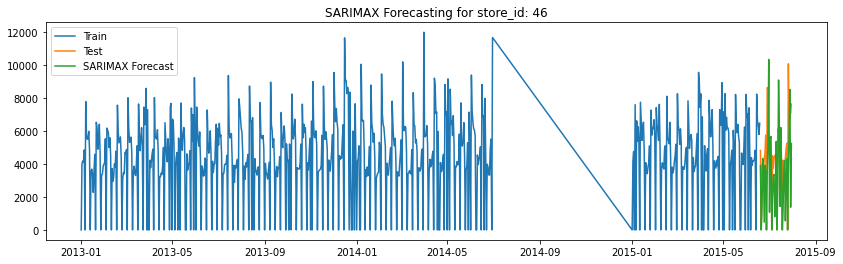

,Method,MAPE,RMSE
0,SARIMAX-EXOG,46.59,2601.22


In [334]:
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_46['Sales'], 
                                                             dataset_series_map_store_46['Sales_boxcox'], 
                                                             original_dataset_store_46['Promo'], (2, 1, 3), (1, 0, 1, 7) )
sarimax_store_46_exog = pd.DataFrame({'Method':['SARIMAX-EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_46_exog

#### Use Promo2Active as exogenous variable for store-id 46 and check the prediction quality

In [335]:
run_auto_arima(dataset_series_map_store_46['Sales_boxcox'], original_dataset_store_46['Promo2Active'].values.reshape(-1, 1))

                                       SARIMAX Results                                        
Dep. Variable:                                      y   No. Observations:                  942
Model:             SARIMAX(2, 1, 3)x(2, 0, [1, 2], 7)   Log Likelihood               -1830.263
Date:                                Fri, 13 Aug 2021   AIC                           3684.526
Time:                                        15:29:30   BIC                           3742.690
Sample:                                             0   HQIC                          3706.697
                                                - 942                                         
Covariance Type:                                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0005      0.003      0.152      0.879      -0.006       0.006
x1 

#### 3. Run SARIMAX with exogenous Promo2Active for store-46

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


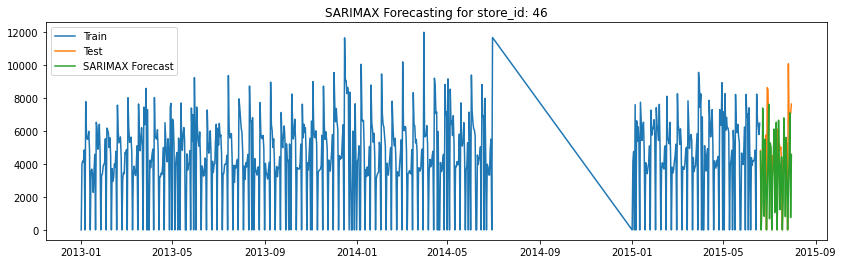

,Method,MAPE,RMSE
0,SARIMAX-EXOG,50.48,2768.47


In [337]:
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_46['Sales'], 
                                                             dataset_series_map_store_46['Sales_boxcox'], 
                                                             original_dataset_store_46['Promo2Active'], (2, 1, 3), (2, 0, 1, 7))
sarimax_store_46_exog_promo2 = pd.DataFrame({'Method':['SARIMAX-EXOG'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
sarimax_store_46_exog_promo2

#### Use Promo and Promo2Active as exogenous variables for store-id-46 and check the prediction quality

In [441]:
store46_exog_variables = pd.concat([original_dataset_store_46['Promo'], original_dataset_store_46['Promo2Active']], axis=1)
run_auto_arima(dataset_series_map_store_46['Sales_boxcox'], store46_exog_variables.values.reshape(-1, 2))

                                       SARIMAX Results                                        
Dep. Variable:                                      y   No. Observations:                  942
Model:             SARIMAX(0, 1, 1)x(2, 0, [1, 2], 7)   Log Likelihood               -1819.209
Date:                                Sun, 15 Aug 2021   AIC                           3654.417
Time:                                        02:45:40   BIC                           3693.193
Sample:                                             0   HQIC                          3669.198
                                                - 942                                         
Covariance Type:                                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.6897      0.100      6.925      0.000       0.494       0.885
x2 

#### 4. Run SARIMAX with exogenous variables Promo and Promo2Active for store-46

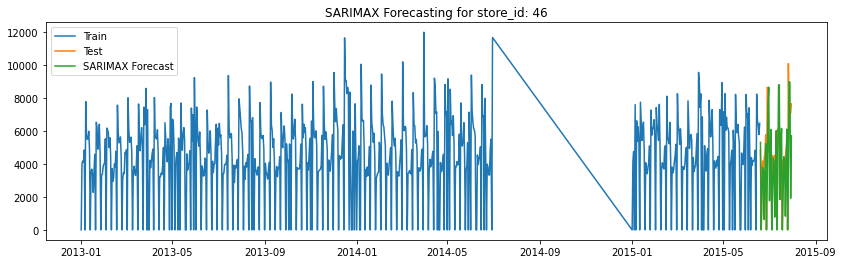

,Method,MAPE,RMSE
0,SARIMAX-With-Promo-And_promo2,46.18,2421.25


In [442]:
# run model with Promo2Active as exognous variable using previous identified p, q values
store_id=46
mape_error, rmse_error = create_sarimax_model_and_plot_forecast(store_id,
                                                             original_dataset_store_46['Sales'], 
                                                             dataset_series_map_store_46['Sales_boxcox'],
                                                             store46_exog_variables, (0, 1, 1), (2, 0, [1, 2], 7))
store_46_sarimax_with_promo_and_promo2 = pd.DataFrame({'Method':['SARIMAX-With-Promo-And_promo2'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
store_46_sarimax_with_promo_and_promo2

### VAR model for store-id - 46

- Since bother Sales_boxcox and Cutomers_boxcox series are stationary from ADF test not required to run cointegration check.
- For Identify p to run VAR  model with range 1-15 for both params get best fit combination.

In [338]:
# create transformed data set for store-46
transformed_data_store_46 = pd.concat([dataset_series_map_store_46['Sales_boxcox'], dataset_series_map_store_46['Customers_boxcox']], axis=1)
var_model_store_46 = VAR(transformed_data_store_3)

var_fit_store_46 = var_model_store_3.select_order(maxlags=15)
var_fit_store_46.summary()

,AIC,BIC,FPE,HQIC
0,-2.582,-2.571,0.07565,-2.578
1,-2.841,-2.810,0.05836,-2.829
2,-2.955,-2.903,0.05207,-2.935
3,-2.982,-2.909,0.05068,-2.954
4,-3.060,-2.967,0.04687,-3.025
5,-3.159,-3.044,0.04247,-3.115
6,-3.414,-3.279,0.03290,-3.363
7,-4.050,-3.894,0.01742,-3.991
8,-4.062,-3.885,0.01721,-3.995
9,-4.060,-3.862,0.01725,-3.984


####  5. Run VAR for store-id 3 using the AR lag 15 and check the prediction quality

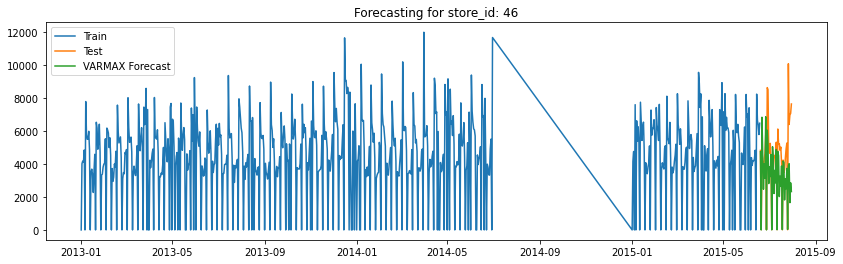

,Method,MAPE,RMSE
0,VAR_MODEL,36.54,2192.54


In [340]:
# run VAR model with earlier identified AR value
model_fit_store_46_no_exog, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_46['Sales'], 
                                       dataset_series_map_store_46['Sales_boxcox'],
                                       dataset_series_map_store_46['Customers_boxcox'],
                                       None, 15, 0)
var_model_res_store_46_no_exog = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_model_res_store_46_no_exog

#### Plot the Impulse response function for store-46

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

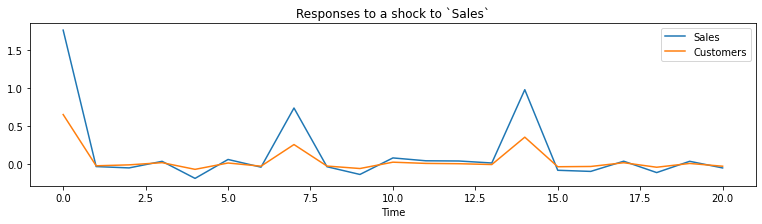

In [341]:
ax = model_fit_store_46_no_exog.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

##### From above plot we can observe that Shock in customers visiting to store is almost impact immediately Sales of store-46 both series are highly correlate each other

#### 6. Run VARMAX for store-id 46 using the AR lag 15 with Promo as Exogonus variable

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


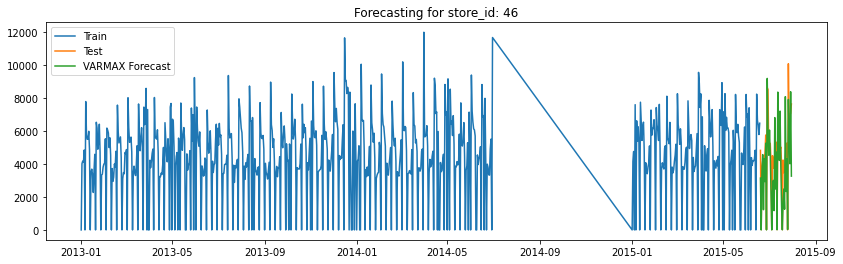

,Method,MAPE,RMSE
0,VAR_MODEL,37.04,1822.35


In [342]:
# run VAR model with earlier identified AR value
varmax_model_fit_store_46_with_exog, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_46['Sales'], 
                                       dataset_series_map_store_46['Sales_boxcox'],
                                       dataset_series_map_store_46['Customers_boxcox'],
                                       original_dataset_store_46['Promo'], 15, 0)
var_mode_res_store_46_exog_promo = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_mode_res_store_46_exog_promo

#### Plot Impulse response function for above model for store-46

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

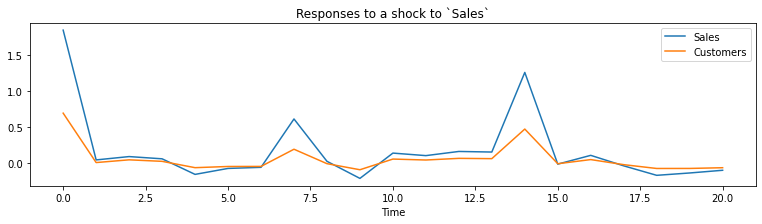

In [343]:
ax = varmax_model_fit_store_46_with_exog.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

##### Based on bove plot we can observe that customer visit to store and Sales are highly correlated. In some cases from lag 3 to 4 though customer visiting store not reduced much though we can see dip sales  to -ve it could be due to the holiday particular day.

#### 7. Run VARMAX for store-id 46 using the AR lag 15 with Promo2 as Exogonus variable

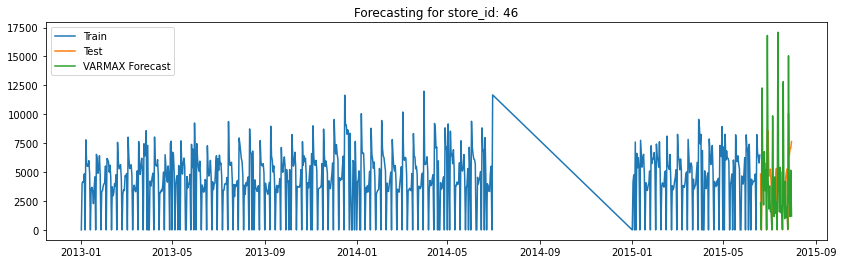

,Method,MAPE,RMSE
0,VAR_MODEL,68.08,3888.8


In [344]:
# run VAR model with earlier identified AR value
varmax_model_fit_store46_promo2, mape_error, rmse_error = run_var_model(store_id,
                                       original_dataset_store_46['Sales'], 
                                       dataset_series_map_store_46['Sales_boxcox'],
                                       dataset_series_map_store_46['Customers_boxcox'],
                                       original_dataset_store_46['Promo2Active'], 15, 0)
var_mode_res_store_46_exog_promo2 = pd.DataFrame({'Method':['VAR_MODEL'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
var_mode_res_store_46_exog_promo2

#### Plot Impulse response function for above model for store-46

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a shock to `Sales`')]

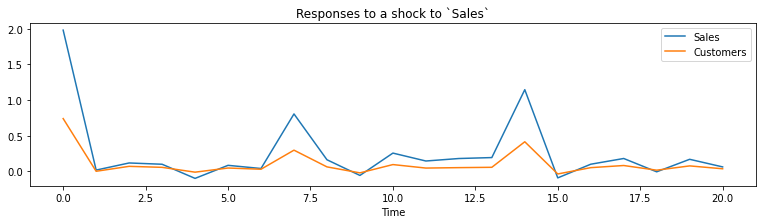

In [345]:
ax = varmax_model_fit_store46_promo2.impulse_responses(20, orthogonalized=True).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a shock to `Sales`')

##### Based on bove plot we can observe that customer visit to store and Sales are highly correlated. In some cases from lag 3 to 4 though customer visiting store not reduced much though we can see dip sales  to -ve it could be due to the holiday particular day.

#### 8. Run Holt Winters' additive method with trend and seasonality for Store Id - 46

c:\users\slesha\anaconda37\envs\timeseries_forecasting\lib\site-packages\statsmodels\tsa\holtwinters\model.py:922: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning,


{'smoothing_level': 0.35857142857142854, 'smoothing_trend': nan, 'smoothing_seasonal': 0.15092436974789916, 'damping_trend': nan, 'initial_level': 5269.638089252042, 'initial_trend': nan, 'initial_seasons': array([-5269.63808925, -1253.63808925, -1092.63808925, -1144.63808925,
        -421.63808925, -5269.63808925,  2518.36191075]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


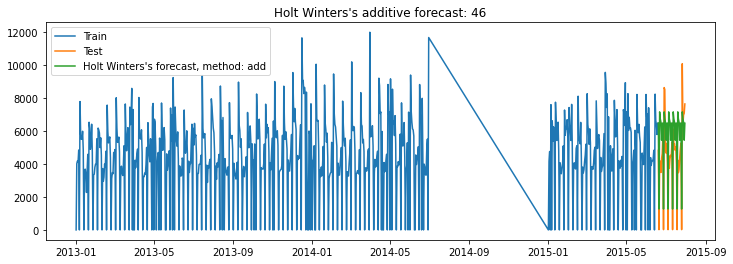

,Method,MAPE,RMSE
0,Holt Winters' additive method,1149.33,1868.69


In [348]:
mape_error, rmse_error = run_holts_winter_model(store_id, original_dataset_store_46['Sales'])
holts_winter_res_store_46 = pd.DataFrame({'Method':['Holt Winters\' additive method'], 'MAPE': [mape_error], 'RMSE': [rmse_error]})
holts_winter_res_store_46

## Models Analysis based on Models Build for each store

### 1. Model Analysis for Store-1 based on add model results

#### Concatenate errors for all models for store-1

In [444]:
pd.concat([stores_error_data[1], sarimax_store1_with_manual_acf_pacf, tempResults, store_1_res2, store_1_res3, store_1_sarimax_with_promo_and_promo2, store_1_res_var_model1_no_exog, store_1_res_var_model1_with_promo, store_1_res_var_model1_with_prom_and_promo2], axis=0)

,Method,MAPE,RMSE
0,ARMA_On_Transformed_data,18.14,990.47
0,SARIMAX,16.96,952.16
0,SARIMAX,15.39,817.74
0,SARIMAX,13.93,770.29
0,SARIMAX,14.77,812.39
0,SARIMAX-With-Promo-And_promo2,13.79,757.51
0,VAR_MODEL,24.21,1124.06
0,VAR_MODEL_with_promo,21.36,1119.73
0,VAR_MODEL-With_promo_and_promo2,29.90,1385.78


##### From above Table we can observe that seasonal Auto regression models performing better than Multivariate variable regression models.
##### For Store-1 SARIMAX with 'promo'  and Promo2 as exogenous variables providing better prediction compare to any other model.
- `SARIMAX-With-Promo-And_promo2	13.79	757.51`	

### 2. Model Analysis for Store-3 based on all model results

In [445]:
pd.concat([stores_error_data[3], sarimax_store_3_no_exog, sarimax_store_3_exog, sarimax_store_3_exog_promo2, store_3_sarimax_with_promo_and_promo2, var_mode_res_store_3_no_exog, var_mode_res_store_3_exog_promo, var_mode_res_store_3_exog_promo2, holts_winter_res_store_3], axis=0)

,Method,MAPE,RMSE
0,ARMA_On_Transformed_data,44.75,2969.52
0,SARIMAX-No_EXOG,37.54,2768.55
0,SARIMAX-EXOG,38.25,2482.11
0,SARIMAX-EXOG,36.82,2631.19
0,SARIMAX-With-Promo-And_promo2,45.39,2743.81
0,VAR_MODEL,31.49,2452.94
0,VAR_MODEL,33.95,2462.59
0,VAR_MODEL,38.59,2880.03
0,Holt Winters' additive method,68.65,1510.81


##### From above Table we can observe that Multivariate time-series regression performing better than any seasonal auto regression.
##### For Store-3 VAR_MODEL with Sales and Customers time series giving better prediction results compare to other models.
- `VAR_MODEL provide better prediction error MAPE - 31.49`

### 3. Model Analysis for Store-8 based on all model results

In [446]:
pd.concat([stores_error_data[8], sarimax_store_8_no_exog, sarimax_store_8_exog_promo, sarimax_store_8_exog_promo2, store_8_sarimax_with_promo_and_promo2, var_mode_res_store_8_no_exog, var_mode_res_store_8_exog_promo, var_mode_res_store_8_exog_promo2, holts_winter_res_store_8], axis=0)

,Method,MAPE,RMSE
0,ARMA_On_Transformed_data,46.26,3096.05
0,SARIMAX-No_EXOG,38.11,2700.79
0,SARIMAX-EXOG,40.99,2322.14
0,SARIMAX-EXOG,40.22,2705.55
0,SARIMAX-With-Promo-And_promo2,42.99,2336.02
0,VAR_MODEL,41.58,2835.10
0,VAR_MODEL,54.68,4303.29
0,VAR_MODEL,43.20,2880.67
0,Holt Winters' additive method,1129.56,1647.01


##### From above Table we can observe that Seasonal SARIMAX provides better prediction error compare to other Multivariate regression models VAR For Store-8 
- SARIMAX with Exogenous variable 'Promo2' provide better prediction error MAPE - 40.22 compare to other models.

### 4. Model Analysis for Store-9 based on all model results

In [447]:
pd.concat([stores_error_data[9], sarimax_store_9_no_exog, sarimax_store_9_exog, sarimax_store_9_exog_promo2, store_9_sarimax_with_promo_and_promo2, var_mode_res_store_9_no_exog, var_mode_res_store_9_exog_promo, var_mode_res_store_9_exog_promo2, holts_winter_res_store_9], axis=0)

,Method,MAPE,RMSE
0,ARMA_On_Transformed_data,23.96,2323.64
0,SARIMAX-No_EXOG,376.13,20195.64
0,SARIMAX-EXOG,16.76,1630.99
0,SARIMAX-EXOG,19.46,2052.08
0,SARIMAX-With-Promo-And_promo2,19.27,1748.77
0,VAR_MODEL,21.71,1729.24
0,VAR_MODEL,33.66,2056.56
0,VAR_MODEL,21.41,1746.88
0,Holt Winters' additive method,18.59,1359.84


##### From above Table we can observe that seasonal Auto regression modesl performing better than Multivariate variable regression.
##### For Store-1 SARIMAX with 'promo' as exogenous variable providing better prediction compare to any other model.
- `SARIMAX	MAPE - 16.76`

### 5. Model Analysis for Store-13 based on all its model results

In [448]:
pd.concat([stores_error_data[13], sarimax_store_13_no_exog, sarimax_store_13_exog_promo, sarimax_store_zero_imputed_13_exog_promo, sarimax_store_13_exog_promo2, sarimax_store_13_zero_imputed_exog_promo2, store_13_sarimax_with_promo_and_promo2, var_model_res_store_13_no_exog, var_mode_res_store_13_exog_promo, var_mode_res_store_13_exog_promo2, holts_winter_res_store_13], axis=0)

,Method,MAPE,RMSE
0,ARMA_On_Transformed_data,57.41,2996.97
0,SARIMAX-No_EXOG,46.29,2982.24
0,SARIMAX-EXOG,45.60,2796.98
0,SARIMAX-Zero-Imputed-EXOG-Promo,40.34,2521.86
0,SARIMAX-EXOG,47.96,2936.74
0,SARIMAX-EXOG-zero_imputed_exog_promo2,48.72,2909.35
0,SARIMAX-With-Promo-And_promo2,42.19,2437.67
0,VAR_MODEL,45.86,2762.17
0,VAR_MODEL,58.06,2447.19
0,VAR_MODEL,42.26,2815.77


##### From above Table we can observe that SARIMAX perform better on zero imputed values for mssing data on store-13 performs better than VAR models
- `SARIMAX-Zero-Imputed-EXOG-Promo	40.34(MAPE)	2521.86`

### 6. Model Analysis for Store-25 based on all its model results

In [449]:
pd.concat([stores_error_data[25], sarimax_store_25_no_exog, sarimax_store_25_exog, sarimax_store_25_exog_promo2, store_25_sarimax_with_promo_and_promo2, var_mode_res_store_25_no_exog, var_mode_res_store_25_exog_promo, var_model_res_store_25_exog_promo2, holts_winter_res_store_25], axis=0)

,Method,MAPE,RMSE
0,ARMA_On_Transformed_data,62.19,6120.96
0,SARIMAX-No_EXOG,37.08,4024.79
0,SARIMAX-EXOG,40.26,4074.60
0,SARIMAX-EXOG,47.73,4950.20
0,SARIMAX-With-Promo-And_promo2,43.26,4129.51
0,VAR_MODEL,49.75,5184.97
0,VAR_MODEL,54.40,5396.45
0,VAR_MODEL,48.95,5188.91
0,Holt Winters' additive method,1095.43,1956.78


##### From above Table we can observe that seasonal Auto regression model SARIMAX performing better than Multivariate variable regression models VARMAX.
##### For Store-1 SARIMAX without exogenous variable providing better prediction compare to any other model.
- `SARIMAX	MAPE - 37.08`

### 7. Model Analysis for Store-29 based on all its model results

In [450]:
pd.concat([stores_error_data[29], sarimax_store_29_no_exog, sarimax_store_29_exog, sarimax_store_29_exog_promo2, store_29_sarimax_with_promo_and_promo2, var_model_res_store_29_no_exog, var_model_res_store_29_exog_promo, var_model_res_store_29_exog_promo2, holts_winter_res_store_29], axis=0)

,Method,MAPE,RMSE
0,ARMA_On_Transformed_data,45.07,3423.62
0,SARIMAX-No_EXOG,37.66,3117.20
0,SARIMAX-EXOG,39.98,2867.70
0,SARIMAX-EXOG,38.86,3118.50
0,SARIMAX-With-Promo-And_promo2,42.28,2884.62
0,VAR_MODEL,36.79,2865.84
0,VAR_MODEL,46.97,3483.89
0,VAR_MODEL,38.29,2879.81
0,Holt Winters' additive method,78.50,1630.13


##### From above Table we can observe that seasonal Auto regression model SARIMAX and Multivariate variable regression models VARMAX performing better for store 29. Prediction error difference very minimal between models SARIMAX with no exogenous variable and VARMAX with no exogenous variable.
- `SARIMAX-No_EXOG	37.66(MAPE)	3117.20`
- `VAR_MODEL	    36.79(MAPE)	2865.84`

### 8. Model Analysis for Store-31 based on all its model results

In [451]:
pd.concat([stores_error_data[31], sarimax_store_31_no_exog, sarimax_store_31_exog, sarimax_store_31_exog_promo2, store_31_sarimax_with_promo_and_promo2, var_model_res_store_31_no_exog, var_mode_res_store_31_exog_promo, var_mode_res_store_31_exog_promo2, holts_winter_res_store_31], axis=0)

,Method,MAPE,RMSE
0,ARMA_On_Transformed_data,16.53,1327.46
0,SARIMAX-No_EXOG,18.48,1183.73
0,SARIMAX-EXOG,9.63,770.51
0,SARIMAX-EXOG,18.53,1184.08
0,SARIMAX-With-Promo-And_promo2,10.37,790.90
0,VAR_MODEL,21.03,1369.67
0,VAR_MODEL,27.69,1461.39
0,VAR_MODEL,20.93,1372.32
0,Holt Winters' additive method,14.64,1021.56


##### From above Table we can observe that seasonal Auto regression models performing better than Multivariate variable regression models.
##### For Store-1 SARIMAX with 'promo' as exogenous variable providing better prediction compare to any other model.
- `SARIMAX-EXOG	  9.63	770.51`

### 9. Model Analysis for Store-46 based on all its model results

In [452]:
pd.concat([stores_error_data[46], sarimax_store_46_no_exog, sarimax_store_46_exog, sarimax_store_46_exog_promo2, store_46_sarimax_with_promo_and_promo2, var_model_res_store_46_no_exog, var_mode_res_store_46_exog_promo, var_mode_res_store_46_exog_promo2, holts_winter_res_store_46], axis=0)

,Method,MAPE,RMSE
0,ARMA_On_Transformed_data,59.31,2965.30
0,SARIMAX-No_EXOG,44.15,2539.20
0,SARIMAX-EXOG,46.59,2601.22
0,SARIMAX-EXOG,50.48,2768.47
0,SARIMAX-With-Promo-And_promo2,46.18,2421.25
0,VAR_MODEL,36.54,2192.54
0,VAR_MODEL,37.04,1822.35
0,VAR_MODEL,68.08,3888.80
0,Holt Winters' additive method,1149.33,1868.69


##### From above Table we can observe that Multivariate time-series regression VARMAX performing better than any seasonal auto regression models ARIMA , SARIMAX and Holt Winters.
##### For Store-13 VAR_MODEL with Sales and Customer's inflow time series giving better prediction results compare to other models.
- VAR_MODEL without exogenous variable and with exogenous variable 'Promo2' provide better prediction error
- `VAR_MODEL	    36.54(MAPE)	2192.54`
- `VAR_MODEL-Promo	37.04(MAPE)	1822.35`

### Note: Explored other exogenous variable 'CompitationDuration'  along with 'Promo' and 'Promo2Active' part of model building but those models doesn't provide better prediction error comapre with combination of 'Promo' and 'Promo2'. 